# AML Tabla Recognition and Prediction: Model 1

#### Group Member: Shreya Gupta, Kayla Lu, Jierong Huang

### Task:

#### 1. Data Preparation

#### 2. Model 1 Construction: CNN

Basic CNN implementation for Tabla Note Recognition, with tested feature selection and parameter tuning;

   2.1 Block & CNN Construction
   2.2 Training Presettings
   2.3 Training and Validating
   2.4 Testing
   2.5 Visualization
   2.6 Save the model

#### 3. Create Labeled Data

Using the live patterns played by the same tabla player to generate dataset TablaLive, which comes from real instrument sampling; use Rectified Complex Domain as onset strategy to slice and run saved CNN model to recognize the notes and store info in a dictionary saved as .csv file to record note type and duration

To check generalisation of the model on other tabla samples, we generate labels dataset for TablaPU, generated from itablaPro app (an electronic platform of tabla app with live samples)

### Dataset: TablaSN

#### Main Properties:

Sample Rate: 48 kHz
Channels:  Stereo

Bit Depth:  24 bit

#### Dataset Description:

The dataset holds recordings of individual hits in each pattern, of the hits: "dha", "dhin", "ta", "tin", "t", "kat", "re", "ki", "na", "ghe", "tun". The tabla player is Vaibhav Vijay Duratkar. Each audio file in the dataset is a '.wav' file that contains a recording of one hit.
The folders are organised by notes'name and then the index number of hit.

The note included in Tabla should be categorized into three coarse types due to their basic acoustic characteristics, the type "Ringing bell-like tones" includes "Na", "Tin", "Ta" and "Tun"; the type "Resonant bass strokes" includes "Dha", "Dhin" and "Ghe"; the type "Closed, crisp sounds" includes "Ti", "Re", "Ki", "T" and "Kat"

### Environment setting

In [1]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import librosa
import os
import seaborn as sns
import csv
import pandas as pd
import re

from glob import glob
from torch.utils.data import Dataset, DataLoader, TensorDataset
from numpy.ma.core import squeeze
from pathlib import Path
from sklearn.metrics import confusion_matrix
from collections import Counter
from scipy.signal import find_peaks
from collections import defaultdict
from sklearn.metrics import accuracy_score, classification_report

## Single Tabla Note Recognition

## 1. Data Preparation

### 1.1 Load dataset TablaSN

In [3]:

# Define the workfolder path
work_dir = Path.cwd()

# Define the specific path to TablaSN folder
base_dir = Path.cwd() / "Dataset" / "Total_DataSet"
SN_filepath = str(base_dir / "**/*.wav")

# Find all the .wav files in the dataset
wave_files = glob(SN_filepath, recursive=True)
TablaSN_size = len(wave_files)

# Initialise tracking variables for durations and lengths
Max_length = 0
Min_length = float("inf")
Max_duration = 0
Min_duration = float("inf")

# Define tabla note labels
note_labels = ["Dha", "Dhin", "Ghe", "Kat", "Ki", "Na", "Re", "T", "Ta", "Ti", "Tun", "Tin"]
note_counts = {label: 0 for label in note_labels}
note_durations = {label: [] for label in note_labels}
all_durations = []

# Dataset Analysis: Duration and Count per note
for n in wave_files:
    # Load the audio files
    y, sr = librosa.load(n, sr=None)
    length_in_samples = len(y)
    duration = length_in_samples / sr  # Duration in seconds
    all_durations.append(duration)

    # Update length
    if length_in_samples > Max_length:
        Max_length = length_in_samples
        Max_file = os.path.basename(n)
    if length_in_samples < Min_length:
        Min_length = length_in_samples
        Min_file = os.path.basename(n)

    # Update duration
    if duration > Max_duration:
        Max_duration = duration
    if duration < Min_duration:
        Min_duration = duration

    # Extract note name from filename
    filename = os.path.basename(n)
    match = re.match(r"([A-Za-z]+(?:_[A-Za-z]+)?)_\d+", filename)

    if match:
        note_str = match.group(1)
    else:
        note_str = filename.split("_")[0]

    if note_str in note_counts:
        note_counts[note_str] += 1
        note_durations[note_str].append(duration)

In [4]:
# Print dataset statistics
print(f"Found {TablaSN_size} .wav files.")
print(f"Longest file: {Max_file}, length in samples: {Max_length}, duration: {Max_duration:.2f}s")
print(f"Shortest file: {Min_file}, length in samples: {Min_length}, duration: {Min_duration:.2f}s")

# Calculate average and median duration for all files
avg_duration_overall = np.mean(all_durations)
median_duration_overall = np.median(all_durations)
print(f"\nOverall statistics:")
print(f"  Average duration: {avg_duration_overall:.4f}s")
print(f"  Median duration: {median_duration_overall:.4f}s")

# Calculate average and median duration for each note type
print("\nDuration statistics by note type:")
avg_durations = []
median_durations = []

for note in note_labels:
    if note_counts[note] > 0:
        avg_duration = np.mean(note_durations[note])
        median_duration = np.median(note_durations[note])
        avg_durations.append(avg_duration)
        median_durations.append(median_duration)
        print(f"  {note}: Avg={avg_duration:.4f}s, Median={median_duration:.4f}s (from {note_counts[note]} files)")
    else:
        avg_durations.append(0)
        median_durations.append(0)
        print(f"  {note}: No files found")

Found 8408 .wav files.
Longest file: Dha_1623.wav, length in samples: 78592, duration: 1.64s
Shortest file: T_326.wav, length in samples: 2739, duration: 0.06s

Overall statistics:
  Average duration: 0.4278s
  Median duration: 0.3947s

Duration statistics by note type:
  Dha: Avg=0.4919s, Median=0.4106s (from 1673 files)
  Dhin: Avg=0.5480s, Median=0.5013s (from 1992 files)
  Ghe: Avg=0.2549s, Median=0.2445s (from 290 files)
  Kat: Avg=0.3462s, Median=0.2942s (from 153 files)
  Ki: Avg=0.1619s, Median=0.1626s (from 176 files)
  Na: Avg=0.3272s, Median=0.2987s (from 1235 files)
  Re: Avg=0.1623s, Median=0.1707s (from 173 files)
  T: Avg=0.2473s, Median=0.2027s (from 981 files)
  Ta: Avg=0.5001s, Median=0.4373s (from 494 files)
  Ti: Avg=0.1677s, Median=0.1655s (from 236 files)
  Tun: Avg=0.4899s, Median=0.4796s (from 148 files)
  Tin: Avg=0.5758s, Median=0.5013s (from 857 files)


{'Tin': 857, 'Dhin': 1992, 'Na': 1235, 'Tun': 148, 'Dha': 1673, 'T': 981, 'Ghe': 290, 'Kat': 153, 'Ki': 176, 'Ta': 494, 'Re': 173, 'Ti': 236}


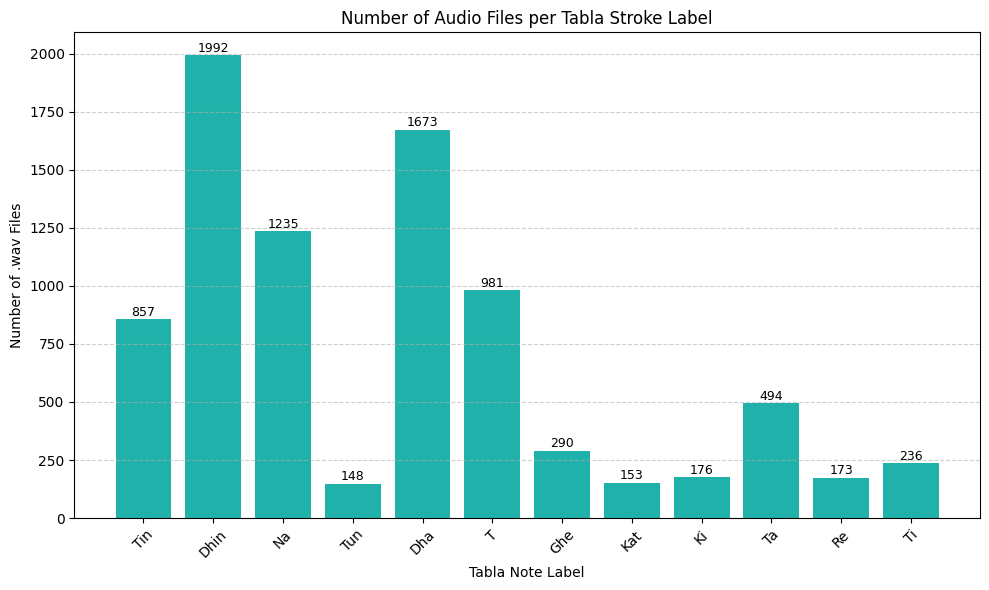

In [5]:


# Path to your dataset
#base_dir = Path("Total_DataSet")  # update if your path is different

# Count WAV files in each label folder (Dha, Tin, etc.)
label_counts = defaultdict(int)

for label_folder in base_dir.iterdir():
    if label_folder.is_dir():
        wav_files = list(label_folder.glob("*.wav"))
        label_counts[label_folder.name] = len(wav_files)

# Convert to regular dict for plotting
label_counts = dict(label_counts)
print(label_counts)

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(label_counts.keys(), label_counts.values(), color="lightseagreen")
plt.title("Number of Audio Files per Tabla Stroke Label")
plt.xlabel("Tabla Note Label")
plt.ylabel("Number of .wav Files")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Add number labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 2, str(height),
             ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


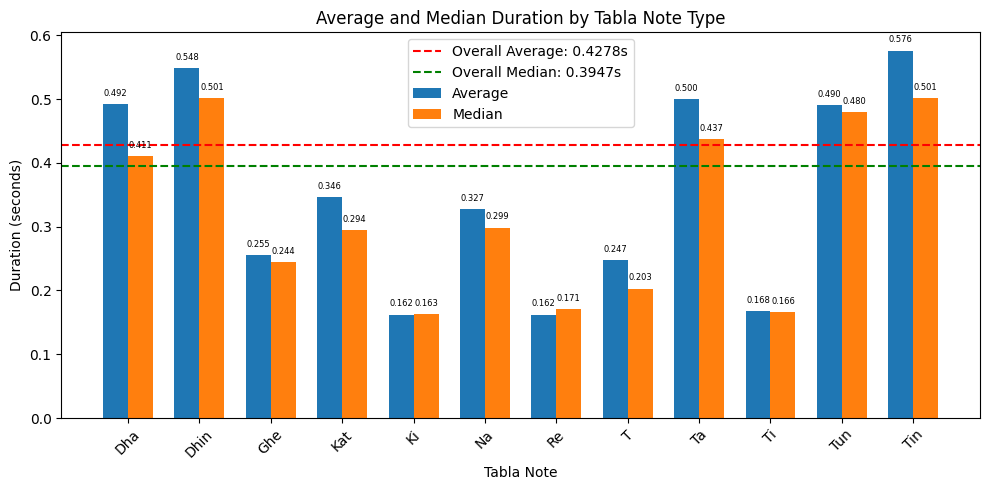

In [6]:
# Plotting Average and Median Durations per Note
plt.figure(figsize=(10, 5))
x = np.arange(len(note_labels))
width = 0.35

bars1 = plt.bar(x - width/2, avg_durations, width, label='Average')
bars2 = plt.bar(x + width/2, median_durations, width, label='Median')

plt.axhline(y=avg_duration_overall, color='r', linestyle='--', label=f'Overall Average: {avg_duration_overall:.4f}s')
plt.axhline(y=median_duration_overall, color='g', linestyle='--', label=f'Overall Median: {median_duration_overall:.4f}s')

# Annotate bars
for i, bar in enumerate(bars1):
    height = bar.get_height()
    if height > 0:
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontsize=6)

for i, bar in enumerate(bars2):
    height = bar.get_height()
    if height > 0:
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontsize=6)

plt.xlabel('Tabla Note')
plt.ylabel('Duration (seconds)')
plt.title('Average and Median Duration by Tabla Note Type')
plt.xticks(x, note_labels, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

/var/folders/ty/jtb0r7z947v1rwjplpwl4t540000gn/T/ipykernel_77724/273918288.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_for_box, labels=note_labels)


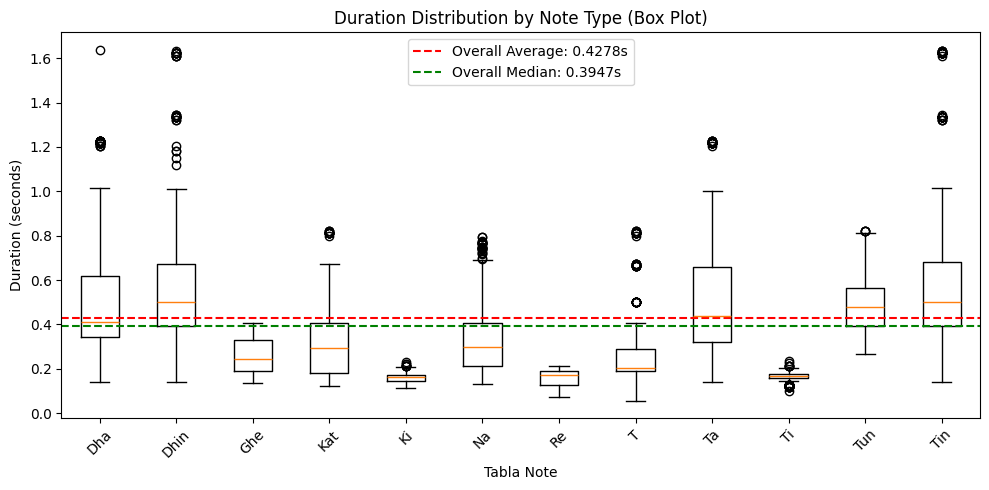

In [7]:
# Box plot: Duration Distribution by Note
plt.figure(figsize=(10, 5))
data_for_box = []
for note in note_labels:
    if note_counts[note] > 0:
        data_for_box.append(note_durations[note])
    else:
        data_for_box.append([])

plt.boxplot(data_for_box, labels=note_labels)
plt.title('Duration Distribution by Note Type (Box Plot)')
plt.xlabel('Tabla Note')
plt.ylabel('Duration (seconds)')
plt.axhline(y=avg_duration_overall, color='r', linestyle='--', label=f'Overall Average: {avg_duration_overall:.4f}s')
plt.axhline(y=median_duration_overall, color='g', linestyle='--', label=f'Overall Median: {median_duration_overall:.4f}s')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

### 1.2 Maintain Onset Consistency: RCD

After a careful investigation of different onset strategies, Rectified Complex Domain was confirmed as the onset strategy for training and prediction. For checking the other strategies, please refer to the other strategies mentioned in Appendix. Other possible strategies considered are Librosa onset detection, hybrid_onsets and Energy Onset Detection.

In [8]:
# RCD Onset Detection
def compute_rcd_onsets(y, sr, n_fft=2048, hop_length=512, threshold=0.3):
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    mag, phase = np.abs(S), np.angle(S)

    # Estimate phase prediction
    phase_diff = np.diff(phase, axis=1)
    phase_diff = np.pad(phase_diff, ((0, 0), (1, 0)), mode='constant')
    pred = mag[:, :-1] * np.exp(1j * (phase[:, :-1] + phase_diff[:, :-1]))
    error = np.abs(S[:, 1:] - pred)

    # Rectified Complex Domain
    rcd = np.where(mag[:, 1:] >= mag[:, :-1], error, 0)
    onset_env = np.sum(rcd, axis=0)

    # Normalize and peak pick
    onset_env = onset_env - np.mean(onset_env)
    onset_env /= np.std(onset_env) + 1e-8
    peaks = librosa.util.peak_pick(onset_env, pre_max=3, post_max=3, pre_avg=3, post_avg=3,delta=threshold, wait=5)

    # Convert frames to samples
    onset_samples = librosa.frames_to_samples(peaks, hop_length=hop_length)

    # Append the end of audio to capture the last stroke
    if onset_samples[-1] < len(y):
        onset_samples = np.append(onset_samples, len(y))

    return onset_samples, onset_env

In [9]:
# Stroke Extraction using Onsets
def preprocess_onsets(
    file_path,
    db_threshold=-30,
    pre_onset_samples=1000
):
    # Load audio
    y, sr = librosa.load(file_path, sr=None)

    return y

In [5]:
# testing the onset with a random file
preprocess_onsets_data = preprocess_onsets(file_path="DataSet/Total_DataSet/Dha/Dha_007.wav")
print(preprocess_onsets_data[0].shape)
print(preprocess_onsets_data[1])

NameError: name 'preprocess_onsets' is not defined

### 1.3 Length process function

Possible strategies for truncating or zero-padding:

    1.⁠ ⁠Max length = target length (just add zero padding)
    2.⁠ ⁠⁠average length = target length
    3.⁠ ⁠⁠median length = target length
    4.⁠ ⁠⁠min length = target length (truncated from the right)

After trial on the most extreme case of truncate, aim to maintain as much original audio infos as possible, we decide to apply strategy 1, add right zero-padding to shorter audio files

In [28]:
# Function to adjust the length of audio data
def Adjust_Length(audio_data, target_length):
    # Right zero-padding
    if len(audio_data) < target_length:
        padded_audio = np.pad(audio_data, (0, target_length - len(audio_data)), mode = 'constant')
        return padded_audio
    else:
        return audio_data

In [29]:
# Extracting Target Length from Reference file
target_Len_file = base_dir / "Dha" / "Dha_1623.wav"                             # Or assign the specific file length you want!
y_target_Len, sr_target_Len = librosa.load(target_Len_file, sr = None)
target_length = len(y_target_Len)

print(f"The target length in samples is: {target_length}")

The target length in samples is: 78592


### 1.4 Feature extract Methods

After a careful assessment of the Tabla hits spectrum, we decided to go with the feature plan that is combination of MFCCs and Chroma. The other possible considered features were:
    1. MFCCs + Spectral Centroid
    2. Log-Mel-spec + Spectral Centroid

To refer to the other considered feature plans, please refer to the functions of them in the Appendix

#### Feature Extraction Plan: MFCCs + Chroma (Preferred Plan)

MFCCs, (T, C), 2d
	Pros: suitable for timbre; after DCT, lessen compute complexity
	Cons: loss part of transient characteristic in high frequency

Chroma, (T, ), 1d
	Pros: good for harmonic structure and certain pitch-based Tabla notes; lessen compute complexity;
	Cons: Limited for percussive sounds** without clear pitch; weak in transient characteristics

Returns: 3D array of features with shape (n_features, n_time_frames, n_feature_types)

In [30]:
# Function to preprocess audio data
def preprocess(audio_data, sample_rate):
    # Normalize the audio data
    if np.max(np.abs(audio_data)) > 0:
        audio_data = audio_data / np.max(np.abs(audio_data))

    # Extract MFCCs (13 coefficients)
    mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=13)

    # Extract Chroma features
    chroma = librosa.feature.chroma_stft(y=audio_data, sr=sample_rate, n_chroma=13)

    # Ensure both features have the same number of time frames
    min_frames = min(mfccs.shape[1], chroma.shape[1])
    mfccs = mfccs[:, :min_frames]
    chroma = chroma[:, :min_frames]

    # Stack features along a new dimension to create a 3D array
    # Shape: (n_features, n_time_frames, n_feature_types)
    features = np.stack([mfccs, chroma], axis=2)


    return features

This is a test code for feature extraction dimension

In [31]:
# Test the feature dimension
test_audio_path = base_dir / "Dha" / "Dha_1623.wav"

# Load the audio data and sample rate
audio_data, sample_rate = librosa.load(test_audio_path, sr=None)

# Call preprocess function
features = preprocess(audio_data, sample_rate)

# Print shape of extracted features
print("Feature shape:", features.shape)  # Expected: (n_features, n_time_frames, n_feature_types)

# Verify normalization
normalized_audio = audio_data / np.max(np.abs(audio_data))
print("Max absolute value after normalization:", np.max(np.abs(normalized_audio)))  # Should be 1.0

Feature shape: (13, 154, 2)
Max absolute value after normalization: 1.0


### 1.4 Dataset Splitting and Preprocessing

In [32]:
# Set global sample rate and data split proportions
SR = 48000
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Initialise subsets
train_files = []
val_files = []
test_files = []

In [33]:
# Populate subsets with file paths
for note in note_labels:
    note_dir = base_dir / note
    audio_files = glob(str(note_dir / "*.wav"))
    total_per_digit = len(audio_files)

    # Determine split counts
    num_train = int(total_per_digit * train_ratio)
    num_val = int(total_per_digit * val_ratio)
    num_test = total_per_digit - num_train - num_val  # Ensure integer count

    # Shuffle files to ensure random distribution
    np.random.shuffle(audio_files)

    train_files.extend(audio_files[:num_train])
    val_files.extend(audio_files[num_train:num_train + num_val])
    test_files.extend(audio_files[num_train + num_val:])

In [34]:
# Print distribution
print(f"Total files: {len(train_files) + len(val_files) + len(test_files)}")
print(f"Train files: {len(train_files)}")
print(f"Validation files: {len(val_files)}")
print(f"Test files: {len(test_files)}")

Total files: 8408
Train files: 6721
Validation files: 836
Test files: 851


In [35]:
# Test code, to see what's the file actually inside the test file subset
print("Test Files:")
for file_path in test_files:
    print(file_path)

Test Files:
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_1243.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_447.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_185.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_050.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_822.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_1057.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_762.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/Dataset/Total_DataSet/Dha/Dha_614.wav
/Users/shreyagupta/Desktop/Machine_Learning/Group_

#### Plot Class Distribution in Subsets

/var/folders/ty/jtb0r7z947v1rwjplpwl4t540000gn/T/ipykernel_32053/27770874.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(note_counts.keys(), rotation=45)
/var/folders/ty/jtb0r7z947v1rwjplpwl4t540000gn/T/ipykernel_32053/27770874.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(note_counts.keys(), rotation=45)
/var/folders/ty/jtb0r7z947v1rwjplpwl4t540000gn/T/ipykernel_32053/27770874.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(note_counts.keys(), rotation=45)


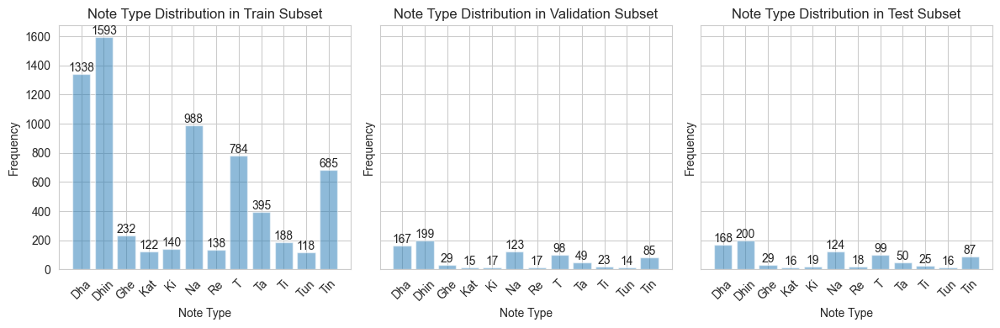

In [36]:
# Function to count note types in a subset
def count_note_types(file_list):
    note_counts = Counter()
    for file_path in file_list:
        note_type = file_path.split('/')[-1].split('_')[0]
        note_counts[note_type] += 1
    return note_counts

# Count note types in each subset
num_train = count_note_types(train_files)
num_val = count_note_types(val_files)
num_test = count_note_types(test_files)

# Plot note type distribution for each subset in one row
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

def plot_note_distribution(note_counts, subset_name, ax):
    ax.bar(note_counts.keys(), note_counts.values(), alpha=0.5)
    ax.set_xlabel('Note Type')
    ax.set_ylabel('Frequency')
    ax.set_title(f'Note Type Distribution in {subset_name} Subset')
    ax.set_xticklabels(note_counts.keys(), rotation=45)
    ax.grid(True)

    # Annotate bars with exact count numbers
    for i, (note, count) in enumerate(note_counts.items()):
        ax.text(i, count, str(count), ha='center', va='bottom')

plot_note_distribution(num_train, 'Train', axes[0])
plot_note_distribution(num_val, 'Validation', axes[1])
plot_note_distribution(num_test, 'Test', axes[2])
plt.tight_layout()
plt.show()

In [37]:
# Convert Audio to Feature-label Tensors
def process_subset(file_list, target_length):
    features_list = []
    labels_list = []
    for file_path in file_list:
        audio_data, sample_rate = librosa.load(file_path, sr=None)
        adjusted_audio = Adjust_Length(audio_data, target_length)

        # Preprocess the audio data
        features = preprocess(adjusted_audio, sample_rate)

        # Determine the label from the filename and convert to numerical index
        label_str = file_path.split('/')[-1].split('_')[0]
        label_index = note_labels.index(label_str)

        features_list.append(features)

        # One-hot encode the label
        one_hot_label = np.zeros(len(note_labels))
        one_hot_label[label_index] = 1
        labels_list.append(one_hot_label)

    # Convert lists to PyTorch tensors
    features_tensor = torch.tensor(features_list, dtype=torch.float32)
    labels_tensor = torch.tensor(labels_list, dtype=torch.float32)  # Use float32 for one-hot encoding

    return features_tensor, labels_tensor

In [38]:
# Process each subset ##########################################################################################################################
train_features, train_labels = process_subset(train_files, target_length)
val_features, val_labels = process_subset(val_files, target_length)
test_features, test_labels = process_subset(test_files, target_length)

# Print the shapes of the processed tensors
print(f"Train features shape: {train_features.shape}; Train labels shape: {train_labels.shape}")
print(f"Validation features shape: {val_features.shape}; Train labels shape: {val_labels.shape}")
print(f"Testing features shape: {test_features.shape}; Testing labels shape: {test_labels.shape}")

/opt/anaconda3/envs/ML312/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/var/folders/ty/jtb0r7z947v1rwjplpwl4t540000gn/T/ipykernel_32053/3728678922.py:24: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:257.)
  features_tensor = torch.tensor(features_list, dtype=torch.float32)


Train features shape: torch.Size([6721, 13, 154, 2]); Train labels shape: torch.Size([6721, 12])
Validation features shape: torch.Size([836, 13, 154, 2]); Train labels shape: torch.Size([836, 12])
Testing features shape: torch.Size([851, 13, 154, 2]); Testing labels shape: torch.Size([851, 12])


 Utility Check: File Label Verification. (This is a test part to take the first audio as example, see if it is labeled and feature extracted successfully.)

In [39]:
# Test code, for verify if label correctly
if train_files:
    first_train_file = train_files[0]
    print(f"Original filename: {os.path.basename(first_train_file)}")

    # Determine the label from the filename and convert to numerical index
    label_str = first_train_file.split('/')[-1].split('_')[0]
    label_index = note_labels.index(label_str)

    # Display the current label
    print(f"Current label (numerical index): {label_index}")

Original filename: Dha_1236.wav
Current label (numerical index): 0


Search Utility: Locate File in Dataset (This is a test part to look up certain specific audio assign result if it is in train, val or test subset.)

In [40]:
# Define the filename to search for
target_filename = "Dha_1623.wav"

# Function to find the file in subsets and display its information
def find_file_info(subset_name, file_list, features, labels, target_filename):
    for i, file_path in enumerate(file_list):
        if os.path.basename(file_path) == target_filename:
            print(f"File '{target_filename}' is in the {subset_name} subset.")
            print(f"Label (one-hot encoded): {labels[i]}")
            print(f"Features shape: {features[i].shape}")
            return True
    return False

# Check each subset
found = find_file_info("train", train_files, train_features, train_labels, target_filename)
if not found:
    found = find_file_info("validation", val_files, val_features, val_labels, target_filename)
if not found:
    found = find_file_info("test", test_files, test_features, test_labels, target_filename)

if not found:
    print(f"File '{target_filename}' was not found in any subset.")

File 'Dha_1623.wav' is in the train subset.
Label (one-hot encoded): tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Features shape: torch.Size([13, 154, 2])


## 2. Model 1 Construction: CNN

This model is for single note recognition task for Tabla with dataset TablaSN.

In [41]:
# CNN Module Block
class ConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size):
        super(ConvBlock, self).__init__()
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size, padding=kernel_size//2)
        self.bn = torch.nn.BatchNorm2d(out_channels)
        self.relu = torch.nn.ReLU()

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

In [42]:
# Define a simple CNN model for classification

In [43]:
class ConvNet(torch.nn.Module):
    def __init__(self, input_channels, num_classes=12, num_channels=16, kernel_size=5):
        super(ConvNet, self).__init__()
        self.layers = torch.nn.Sequential(
            ConvBlock(input_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
            ConvBlock(num_channels, num_channels, kernel_size),
        )
        self.global_avg_pool = torch.nn.AdaptiveAvgPool2d((1, 1))  # Change to 2d pooling
        self.fc = torch.nn.Linear(num_channels, num_classes)

    def forward(self, x):
        x = self.layers(x)
        x = self.global_avg_pool(x).view(x.size(0), -1)  # Flatten to 2d
        network_output = self.fc(x)
        return network_output

In [44]:
# test to check I/O dimension

In [45]:
# Create an instance of your network, as process some input with it as described above.
instance_input = torch.randn(8, 128, 2048, 8)      # batch size: 8; channels: 128; frames: 2048
instance_model = ConvNet(input_channels = 128)
instance_output = instance_model(instance_input)

# Check the output dimension, due to global_avg_pooling, the phenomenon here is dimension reduction for output comparing to input
print("Dimension of instance input: ", instance_input.shape)
print("Dimension of instance output: ", instance_output.shape)

Dimension of instance input:  torch.Size([8, 128, 2048, 8])
Dimension of instance output:  torch.Size([8, 12])


### 2.2 Training Presettings

In [46]:
# Training parameters
num_epochs = 75
batch_size = 50
learning_rate = 0.001

In [47]:
# Define DataLoaders
train_dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
test_dataset = TensorDataset(test_features, test_labels)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [48]:
# Instantiate model, define loss and optimiser
'''If use Feature Extraction Plan 2, modify input_channels = 128! Otherwise 13''' ######################################## Mention this in Appendix

model = ConvNet(input_channels=13, num_classes=12)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

### 2.3 Training and Validating

In [49]:
# Loop for Training and Validation
train_losses, val_losses, val_accuracies = [], [], []               # Initialization

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    total_loss = 0.0

    for inputs, labels in train_loader:
        labels = labels.argmax(dim=1)                               # Convert one-hot encoded labels to integer indices if needed

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()                                   # Accumulate loss

    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    if (epoch + 1) % 5 == 0:
        model.eval()
        total_val_loss, correct, total = 0, 0, 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                labels = labels.argmax(dim=1)                       # Convert one-hot encoded labels to integer indices if needed

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                total_val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        avg_val_loss = total_val_loss / len(val_loader)             # Average validation loss
        val_accuracy = correct / total                              # Validation accuracy
        val_losses.append(avg_val_loss)                             # Validation loss
        val_accuracies.append(val_accuracy)                         # Validation accuracy

        # Print the process
        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

print("Training complete.")

Epoch 5/75, Train Loss: 0.5704, Val Loss: 0.5584, Val Acc: 0.8170
Epoch 10/75, Train Loss: 0.3426, Val Loss: 0.3070, Val Acc: 0.8983
Epoch 15/75, Train Loss: 0.2093, Val Loss: 0.2192, Val Acc: 0.9462
Epoch 20/75, Train Loss: 0.1473, Val Loss: 0.1199, Val Acc: 0.9653
Epoch 25/75, Train Loss: 0.1134, Val Loss: 0.1425, Val Acc: 0.9462
Epoch 30/75, Train Loss: 0.1010, Val Loss: 0.0815, Val Acc: 0.9641
Epoch 35/75, Train Loss: 0.0796, Val Loss: 0.0729, Val Acc: 0.9713
Epoch 40/75, Train Loss: 0.0802, Val Loss: 0.4650, Val Acc: 0.8469
Epoch 45/75, Train Loss: 0.0779, Val Loss: 0.1044, Val Acc: 0.9641
Epoch 50/75, Train Loss: 0.0845, Val Loss: 0.7326, Val Acc: 0.8194
Epoch 55/75, Train Loss: 0.0578, Val Loss: 0.0854, Val Acc: 0.9665
Epoch 60/75, Train Loss: 0.0460, Val Loss: 0.0723, Val Acc: 0.9761
Epoch 65/75, Train Loss: 0.0558, Val Loss: 0.0691, Val Acc: 0.9689
Epoch 70/75, Train Loss: 0.0482, Val Loss: 0.0494, Val Acc: 0.9773
Epoch 75/75, Train Loss: 0.0402, Val Loss: 0.0554, Val Acc: 0.9

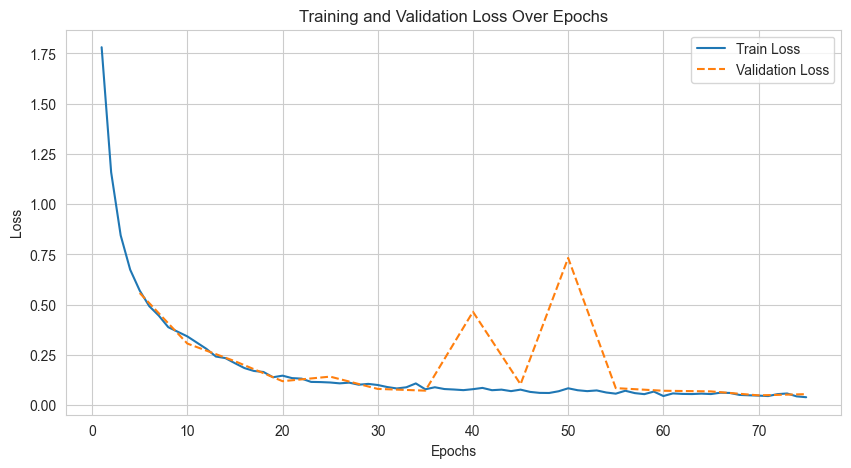

In [51]:
# Plot the loss values
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), train_losses, label='Train Loss')
plt.plot(range(5, num_epochs + 1, 5), val_losses, label='Validation Loss', linestyle='--')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

### 2.4 Testing

In [52]:
# Test Loop
model.eval()
total_test_loss, correct, total = 0, 0, 0                           # Initialization
all_preds, all_labels = [], []

with torch.no_grad():
    for inputs, labels in test_loader:
        labels = labels.argmax(dim=1)                               # Convert one-hot encoded labels to integer indices if needed
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        total_test_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

avg_test_loss = total_test_loss / len(test_loader)                  # Average test loss
test_accuracy = correct / total                                     # Test accuracy
print(f'Test Loss: {avg_test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')

Test Loss: 0.0879, Test Accuracy: 0.9659


### 2.5 Visualization

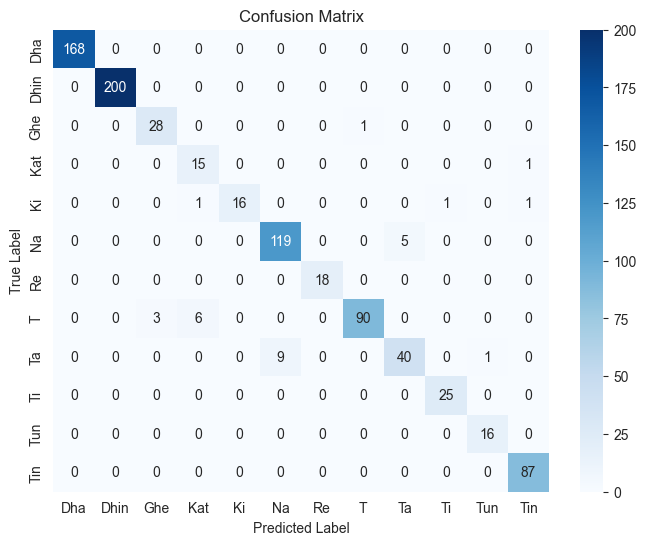

In [81]:
# Assuming you have the true labels and predicted labels
true_labels = test_labels.argmax(dim=1).numpy()  # Convert one-hot encoded labels to integer indices
predicted_labels = []  # This should be filled with your model's predictions

# Fill predicted_labels with your model's predictions
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    for inputs, _ in test_loader:
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        predicted_labels.extend(preds.numpy())

# Compute confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt = 'd', cmap='Blues', xticklabels=note_labels, yticklabels=note_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [64]:
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       168
           1       1.00      1.00      1.00       200
           2       0.90      0.97      0.93        29
           3       0.68      0.94      0.79        16
           4       1.00      0.84      0.91        19
           5       0.93      0.96      0.94       124
           6       1.00      1.00      1.00        18
           7       0.99      0.91      0.95        99
           8       0.89      0.80      0.84        50
           9       0.96      1.00      0.98        25
          10       0.94      1.00      0.97        16
          11       0.98      1.00      0.99        87

    accuracy                           0.97       851
   macro avg       0.94      0.95      0.94       851
weighted avg       0.97      0.97      0.97       851



### 2.6 Save the model

In [54]:
# Save the trained model
Base_Folder = Path.cwd()
model_save_dir = Base_Folder / "ModelSave"

# Ensure the directory exists
model_save_dir.mkdir(parents=True, exist_ok=True)

# Specify the file name for the model
model_save_path = model_save_dir / "ConvNet_SNFPR_model.pth"
torch.save(model.state_dict(), model_save_path)

print(f"Model saved to {model_save_path}")

Model saved to /Users/shreyagupta/Desktop/Machine_Learning/Group_Project/Project_Tabla_Kaggle/ModelSave/ConvNet_SNFPR_model.pth


## 3. Create Labeled Data

With trained CNN model that achieved high accuracy on single note recognition, we can now use it to classify multiple notes in a phrase to generate some symbolic output that includes note type and duration infos.

In [61]:
# Load the trained CNN model
model_path = work_dir / "ModelSave" / "ConvNet_SNFPR_model.pth"  # Enclose the filename in quotes
model = ConvNet(input_channels=13, num_classes=12)  # Ensure input_channels and num_classes match your model
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode

ConvNet(
  (layers): Sequential(
    (0): ConvBlock(
      (conv): Conv2d(13, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): ConvBlock(
      (conv): Conv2d(16, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (2): ConvBlock(
      (conv): Conv2d(16, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (3): ConvBlock(
      (conv): Conv2d(16, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (4): ConvBlock(
      (conv): Conv2d(16, 16, kernel_size=(5, 5), stride=(1, 1), padding

## Part 3: Inference on Real Audio: Onset Dectection + Stroke Prediction

After assesing a few onset strategies, we decided to use RCD onset strategy as mentioned above.

Rectified Complex Domain (RCD) Onset Detection is a high-precision strategy introduced in Simon Dixon's "Onset Detection Revisited" that improves upon traditional spectral methods by modeling both magnitude and phase information of the short-time Fourier transform (STFT).

In [56]:
def predict_tabla_bols(
    file_path,
    model,
    adjust_length_fn,
    target_length,
    db_threshold=-30,
    pre_onset_samples=1000
):
    # Load audio
    y, sr = librosa.load(file_path, sr=None)

    # Compute RCD-based onsets
    onset_samples, onset_env = compute_rcd_onsets(y, sr)

    # Manually add 0 if missing at start
    if 0 not in onset_samples:
        initial_db = librosa.amplitude_to_db([np.max(np.abs(y[:2048]))])[0]
        print(f"Added onset at 0s manually (initial dB: {initial_db:.2f})")
        onset_samples = np.insert(onset_samples, 0, 0)

    results = []
    duration = []
    t_axis = np.linspace(0, len(y) / sr, len(y))
    plt.figure(figsize=(12, 5))
    plt.plot(t_axis, y, label="Waveform", color="skyblue", linewidth=1)

    print(f"Detected {len(onset_samples) - 1} strokes")

    for i in range(len(onset_samples) - 1):
        start = max(onset_samples[i] - pre_onset_samples, 0)
        end = onset_samples[i + 1]
        duration_samples = end - start
        duration_sec = duration_samples / sr
        duration.append(duration_sec)
        stroke = y[start:end]

        if stroke.shape[0] == 0:
            print(f"Skipping stroke {i+1}: zero-length.")
            continue

        stroke_db = librosa.amplitude_to_db([np.max(np.abs(stroke))])[0]
        if stroke_db < db_threshold:
            print(f"Skipping stroke {i+1}: below dB threshold ({stroke_db:.2f} dB).")
            continue

        # Preprocess
        adjusted = adjust_length_fn(stroke, target_length)
        features = preprocess(adjusted, sr)
        input_tensor = torch.tensor(features, dtype=torch.float32).unsqueeze(0)

        # Predict
        model.eval()
        with torch.no_grad():
            output = model(input_tensor)
            pred_index = torch.argmax(output, dim=1).item()
            predicted_bol = note_labels[pred_index]

        results.append(predicted_bol)
        print(f"Stroke {i+1}: Predicted → {predicted_bol} (dB: {stroke_db:.2f})")

        # Plot
        t_stroke = t_axis[start:end]
        plt.plot(t_stroke, y[start:end] + 1.1 - 0.2 * i, label=f"Stroke {i+1}: {predicted_bol}", linewidth=2)

    plt.title("Detected Strokes with Predictions")
    plt.xlabel("Time (s)")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return results, duration


Added onset at 0s manually (initial dB: -51.77)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-51.77 dB).
Stroke 2: Predicted → Dhin (dB: -1.08)
Stroke 3: Predicted → Dhin (dB: -8.77)
Stroke 4: Predicted → Dha (dB: -4.78)
Stroke 5: Predicted → Ghe (dB: -7.58)
Stroke 6: Predicted → Ti (dB: -9.38)
Stroke 7: Predicted → Ti (dB: -6.70)
Stroke 8: Predicted → T (dB: -5.96)
Stroke 9: Predicted → Na (dB: -9.19)
Stroke 10: Predicted → Kat (dB: -4.68)
Stroke 11: Predicted → Tin (dB: -4.75)
Stroke 12: Predicted → Dha (dB: -4.07)
Stroke 13: Predicted → Ghe (dB: -8.47)
Stroke 14: Predicted → Ti (dB: -7.68)
Stroke 15: Predicted → Ti (dB: -6.56)
Stroke 16: Predicted → Dhin (dB: -8.43)
Stroke 17: Predicted → Na (dB: -9.04)


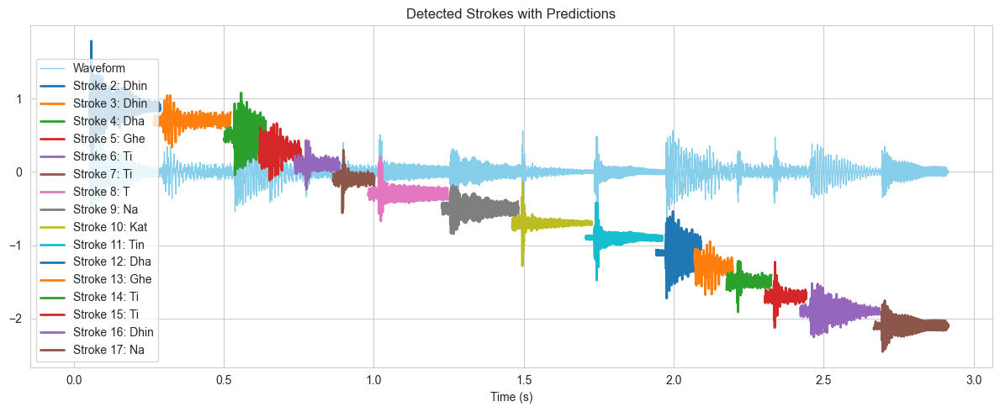

16
['Dhin', 'Dhin', 'Dha', 'Ghe', 'Ti', 'Ti', 'T', 'Na', 'Kat', 'Tin', 'Dha', 'Ghe', 'Ti', 'Ti', 'Dhin', 'Na'] [np.float64(0.042666666666666665), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.13816666666666666), np.float64(0.13816666666666666), np.float64(0.14883333333333335), np.float64(0.13816666666666666), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.14883333333333335), np.float64(0.1275), np.float64(0.14883333333333335), np.float64(0.13816666666666666), np.float64(0.26616666666666666), np.float64(0.24972916666666667)]


In [57]:
predicted_normalised, durations = predict_tabla_bols(file_path="DataSet/Kaggle_Dataset/Ektaal/Ektaal-060.wav",model=model,adjust_length_fn=Adjust_Length,
    target_length=53608)  # match your model's input

print(len(predicted_normalised))  # ['Dha', 'Tin', 'Na', ...]
print(predicted_normalised, durations)

Added onset at 0s manually (initial dB: -51.77)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-51.77 dB).
Stroke 2: Predicted → Dhin (dB: -1.08)
Stroke 3: Predicted → Dhin (dB: -8.77)
Stroke 4: Predicted → Dha (dB: -4.78)
Stroke 5: Predicted → Ghe (dB: -7.58)
Stroke 6: Predicted → Ti (dB: -9.38)
Stroke 7: Predicted → Ti (dB: -6.70)
Stroke 8: Predicted → T (dB: -5.96)
Stroke 9: Predicted → Na (dB: -9.19)
Stroke 10: Predicted → Kat (dB: -4.68)
Stroke 11: Predicted → Tin (dB: -4.75)
Stroke 12: Predicted → Dha (dB: -4.07)
Stroke 13: Predicted → Ghe (dB: -8.47)
Stroke 14: Predicted → Ti (dB: -7.68)
Stroke 15: Predicted → Ti (dB: -6.56)
Stroke 16: Predicted → Dhin (dB: -8.43)
Stroke 17: Predicted → Na (dB: -9.04)


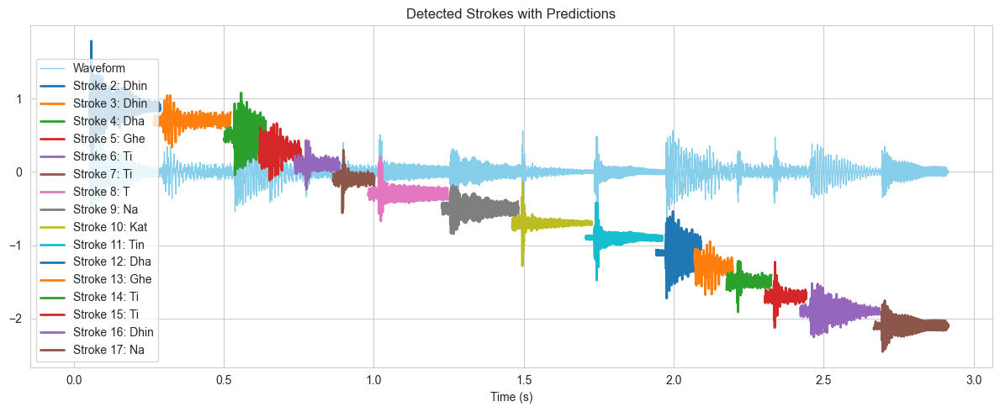

16
['Dhin', 'Dhin', 'Dha', 'Ghe', 'Ti', 'Ti', 'T', 'Na', 'Kat', 'Tin', 'Dha', 'Ghe', 'Ti', 'Ti', 'Dhin', 'Na'] [np.float64(0.042666666666666665), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.13816666666666666), np.float64(0.13816666666666666), np.float64(0.14883333333333335), np.float64(0.13816666666666666), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.14883333333333335), np.float64(0.1275), np.float64(0.14883333333333335), np.float64(0.13816666666666666), np.float64(0.26616666666666666), np.float64(0.24972916666666667)]


In [60]:
predicted_normalised, durations = predict_tabla_bols(file_path="DataSet/Kaggle_Dataset/Ektaal/Ektaal-060.wav",model=model,adjust_length_fn=Adjust_Length,
    target_length=53608)  # match your model's input

print(len(predicted_normalised))  # ['Dha', 'Tin', 'Na', ...]
print(predicted_normalised, durations)

Added onset at 0s manually (initial dB: -4.60)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-53.02 dB).
Stroke 2: Predicted → Dha (dB: -0.54)
Stroke 3: Predicted → Dhin (dB: -6.15)
Stroke 4: Predicted → Na (dB: -13.11)
Stroke 5: Predicted → Dha (dB: -2.70)
Stroke 6: Predicted → Dha (dB: -2.43)
Stroke 7: Predicted → Dhin (dB: -5.83)
Stroke 8: Predicted → Na (dB: -14.17)
Stroke 9: Predicted → Dha (dB: -2.72)
Stroke 10: Predicted → Dha (dB: -2.77)
Stroke 11: Predicted → Tin (dB: -2.95)
Stroke 12: Predicted → T (dB: -14.28)
Stroke 13: Predicted → Ta (dB: -7.48)
Stroke 14: Predicted → Na (dB: -7.20)
Stroke 15: Predicted → Dhin (dB: -4.94)
Stroke 16: Predicted → Dhin (dB: -13.86)
Stroke 17: Predicted → Dha (dB: -2.73)


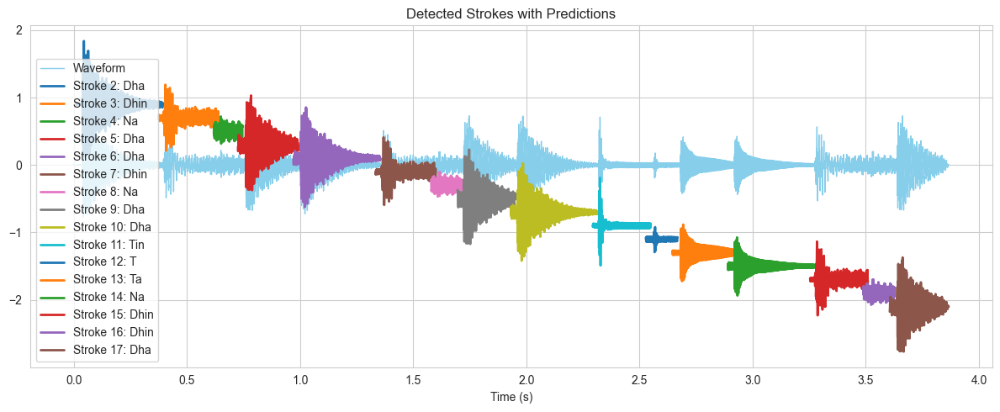

Detected 16 strokes
Stroke 1: Predicted → Dha (dB: -0.00)
Stroke 2: Predicted → Dhin (dB: -6.42)
Stroke 3: Predicted → Na (dB: -11.34)
Stroke 4: Predicted → Dha (dB: -2.60)
Stroke 5: Predicted → Dha (dB: -2.90)
Stroke 6: Predicted → Dhin (dB: -6.42)
Stroke 7: Predicted → Dhin (dB: -11.85)
Stroke 8: Predicted → Dha (dB: -2.71)
Stroke 9: Predicted → Dha (dB: -2.50)
Stroke 10: Predicted → Tin (dB: -2.87)
Stroke 11: Predicted → T (dB: -14.81)
Stroke 12: Predicted → Na (dB: -7.57)
Stroke 13: Predicted → Na (dB: -7.55)
Stroke 14: Predicted → Dhin (dB: -5.60)
Stroke 15: Predicted → Na (dB: -11.46)
Stroke 16: Predicted → Dha (dB: -2.58)


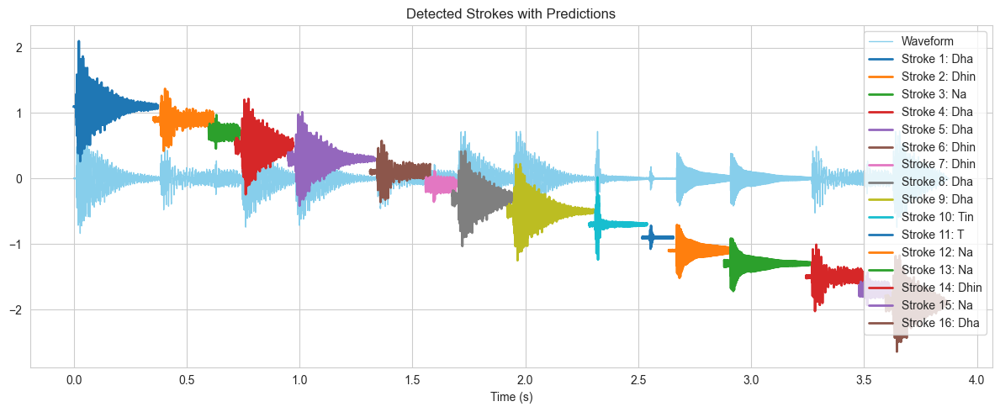

Detected 16 strokes
Stroke 1: Predicted → Dha (dB: -1.23)
Stroke 2: Predicted → Dhin (dB: -4.49)
Stroke 3: Predicted → Na (dB: -12.56)
Stroke 4: Predicted → Dha (dB: -3.64)
Stroke 5: Predicted → Dha (dB: -2.52)
Stroke 6: Predicted → Dhin (dB: -4.19)
Stroke 7: Predicted → Dhin (dB: -10.94)
Stroke 8: Predicted → Dha (dB: -2.73)
Stroke 9: Predicted → Dha (dB: -3.01)
Stroke 10: Predicted → Tin (dB: -0.27)
Stroke 11: Predicted → T (dB: -14.11)
Stroke 12: Predicted → Na (dB: -7.70)
Stroke 13: Predicted → Na (dB: -7.81)
Stroke 14: Predicted → Dhin (dB: -3.86)
Stroke 15: Predicted → Na (dB: -11.01)
Stroke 16: Predicted → Dha (dB: -2.75)


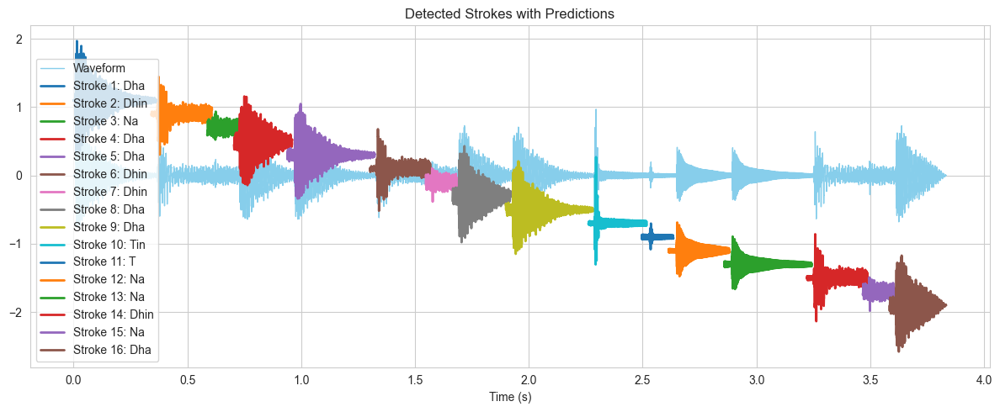

Added onset at 0s manually (initial dB: -0.91)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-53.62 dB).
Stroke 2: Predicted → Dha (dB: -0.91)
Stroke 3: Predicted → Dhin (dB: -6.06)
Stroke 4: Predicted → Na (dB: -11.40)
Stroke 5: Predicted → Dha (dB: -2.80)
Stroke 6: Predicted → Dha (dB: -2.55)
Stroke 7: Predicted → Dhin (dB: -5.58)
Stroke 8: Predicted → Na (dB: -11.79)
Stroke 9: Predicted → Dha (dB: -2.79)
Stroke 10: Predicted → Dha (dB: -2.59)
Stroke 11: Predicted → Tin (dB: -2.73)
Stroke 12: Predicted → T (dB: -14.69)
Stroke 13: Predicted → Na (dB: -7.91)
Stroke 14: Predicted → Na (dB: -7.69)
Stroke 15: Predicted → Dhin (dB: -4.99)
Stroke 16: Predicted → Na (dB: -11.43)
Stroke 17: Predicted → Dha (dB: -2.81)


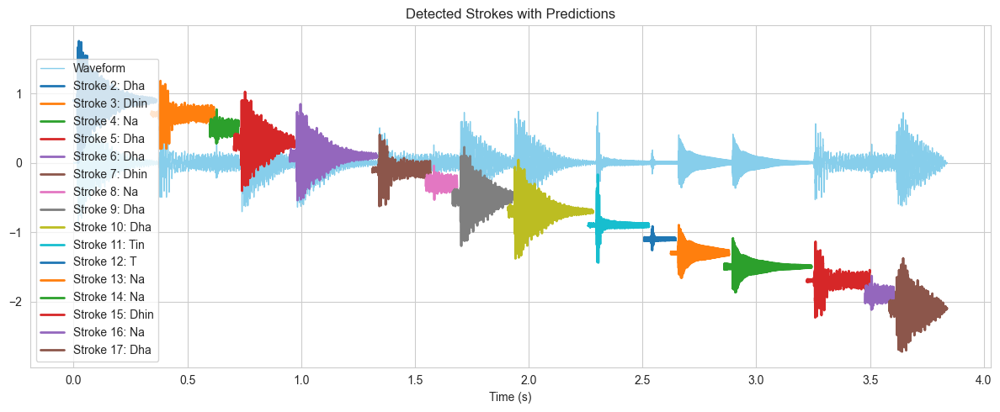

Detected 16 strokes
Stroke 1: Predicted → Dha (dB: -1.70)
Stroke 2: Predicted → Dhin (dB: -6.38)
Stroke 3: Predicted → Na (dB: -11.88)
Stroke 4: Predicted → Dha (dB: -3.01)
Stroke 5: Predicted → Dha (dB: -2.85)
Stroke 6: Predicted → Dhin (dB: -6.10)
Stroke 7: Predicted → T (dB: -12.01)
Stroke 8: Predicted → Dha (dB: -3.00)
Stroke 9: Predicted → Dha (dB: -2.68)
Stroke 10: Predicted → Tin (dB: -3.14)
Stroke 11: Predicted → T (dB: -14.52)
Stroke 12: Predicted → Na (dB: -8.61)
Stroke 13: Predicted → Na (dB: -8.65)
Stroke 14: Predicted → Dhin (dB: -5.97)
Stroke 15: Predicted → Na (dB: -11.96)
Stroke 16: Predicted → Dha (dB: -3.03)


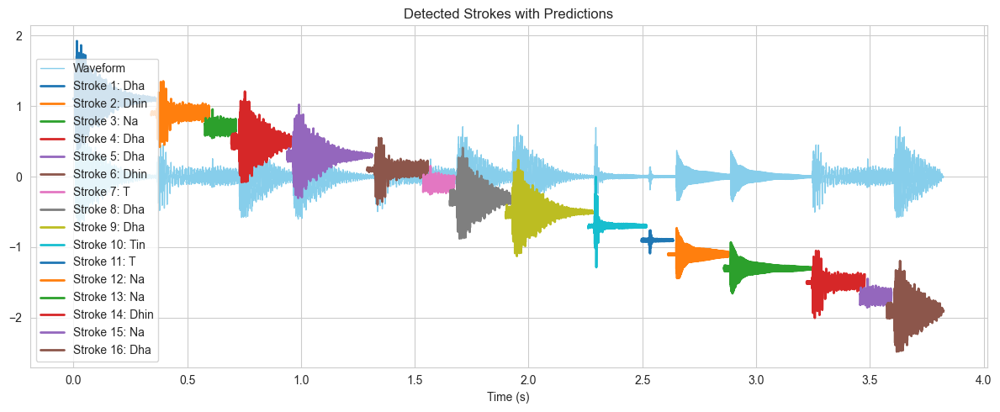

Added onset at 0s manually (initial dB: -1.41)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-55.26 dB).
Stroke 2: Predicted → Dha (dB: -1.41)
Stroke 3: Predicted → Dhin (dB: -5.25)
Stroke 4: Predicted → Dhin (dB: -14.08)
Stroke 5: Predicted → Dha (dB: -3.35)
Stroke 6: Predicted → Dha (dB: -3.19)
Stroke 7: Predicted → Dhin (dB: -5.05)
Stroke 8: Predicted → Ghe (dB: -14.29)
Stroke 9: Predicted → Dha (dB: -3.35)
Stroke 10: Predicted → Dha (dB: -3.24)
Stroke 11: Predicted → Tin (dB: -1.67)
Stroke 12: Predicted → T (dB: -15.17)
Stroke 13: Predicted → Na (dB: -8.19)
Stroke 14: Predicted → Na (dB: -8.68)
Stroke 15: Predicted → Dhin (dB: -5.06)
Stroke 16: Predicted → Ghe (dB: -15.04)
Stroke 17: Predicted → Dha (dB: -3.26)


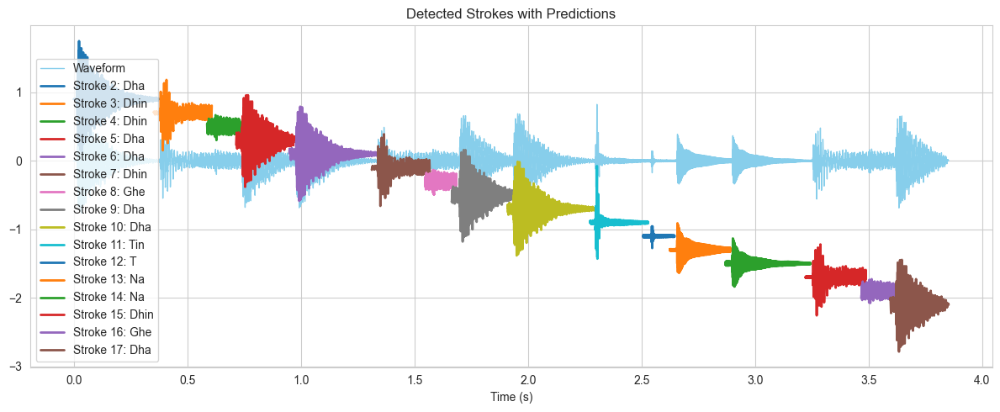

Added onset at 0s manually (initial dB: -0.45)
Detected 16 strokes
Skipping stroke 1: below dB threshold (-55.75 dB).
Stroke 2: Predicted → Dha (dB: -0.45)
Stroke 3: Predicted → Dhin (dB: -3.55)
Stroke 4: Predicted → Dha (dB: -1.74)
Stroke 5: Predicted → Dha (dB: -2.13)
Stroke 6: Predicted → Dhin (dB: -3.70)
Stroke 7: Predicted → T (dB: -11.87)
Stroke 8: Predicted → Dha (dB: -1.71)
Stroke 9: Predicted → Dha (dB: -2.23)
Stroke 10: Predicted → Tin (dB: -2.88)
Stroke 11: Predicted → T (dB: -14.91)
Stroke 12: Predicted → Na (dB: -7.37)
Stroke 13: Predicted → Na (dB: -7.36)
Stroke 14: Predicted → Dhin (dB: -2.95)
Stroke 15: Predicted → Ghe (dB: -13.80)
Stroke 16: Predicted → Dha (dB: -1.77)


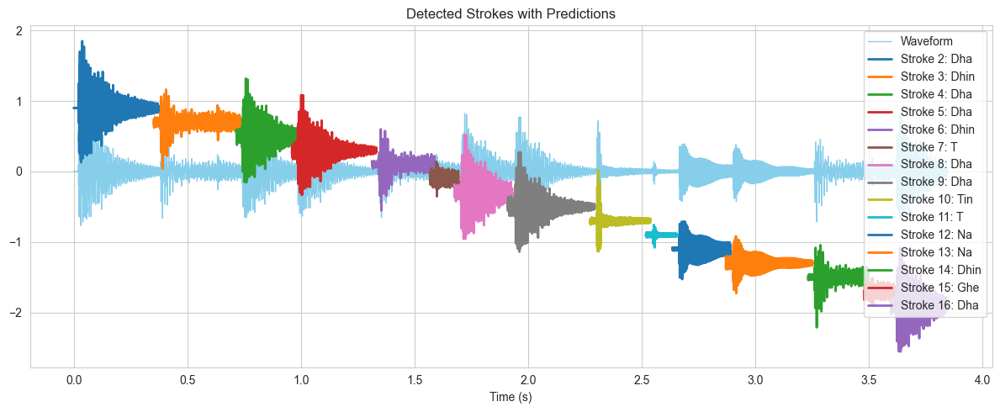

Added onset at 0s manually (initial dB: -1.28)
Detected 16 strokes
Skipping stroke 1: below dB threshold (-52.05 dB).
Stroke 2: Predicted → Dha (dB: -1.28)
Stroke 3: Predicted → Dhin (dB: -2.57)
Stroke 4: Predicted → Ghe (dB: -11.51)
Stroke 5: Predicted → Dha (dB: -2.78)
Stroke 6: Predicted → Dha (dB: -2.68)
Stroke 7: Predicted → Dhin (dB: -2.42)
Stroke 8: Predicted → Dha (dB: -2.82)
Stroke 9: Predicted → Dha (dB: -1.95)
Stroke 10: Predicted → Tin (dB: -2.08)
Stroke 11: Predicted → T (dB: -15.77)
Stroke 12: Predicted → Na (dB: -6.98)
Stroke 13: Predicted → Na (dB: -6.27)
Stroke 14: Predicted → Dhin (dB: -2.18)
Stroke 15: Predicted → T (dB: -11.54)
Stroke 16: Predicted → Dha (dB: -2.81)


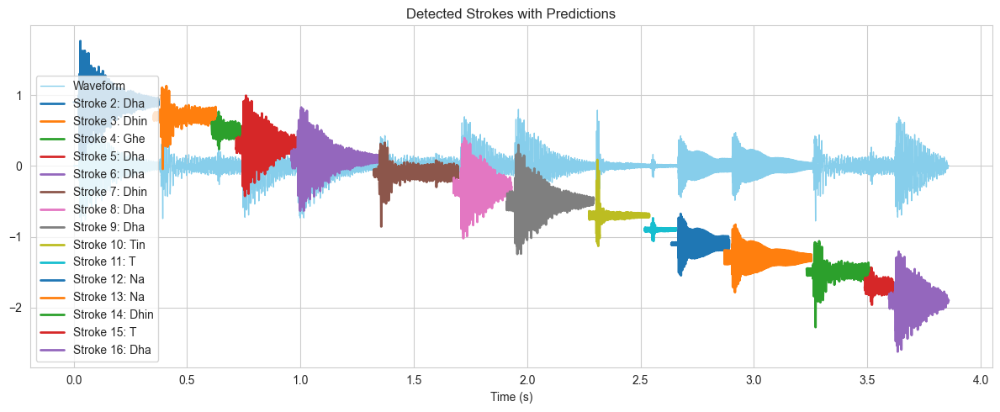

Added onset at 0s manually (initial dB: -0.69)
Detected 14 strokes
Skipping stroke 1: below dB threshold (-55.97 dB).
Stroke 2: Predicted → Dha (dB: -0.69)
Stroke 3: Predicted → Dhin (dB: -5.67)
Stroke 4: Predicted → Dha (dB: -1.75)
Stroke 5: Predicted → Dha (dB: -1.56)
Stroke 6: Predicted → Dhin (dB: -5.46)
Stroke 7: Predicted → Dha (dB: -1.83)
Stroke 8: Predicted → Dha (dB: -1.36)
Stroke 9: Predicted → Tin (dB: -2.63)
Stroke 10: Predicted → T (dB: -14.89)
Stroke 11: Predicted → Na (dB: -7.06)
Stroke 12: Predicted → Ta (dB: -5.74)
Stroke 13: Predicted → Dhin (dB: -5.41)
Stroke 14: Predicted → Dha (dB: -1.83)


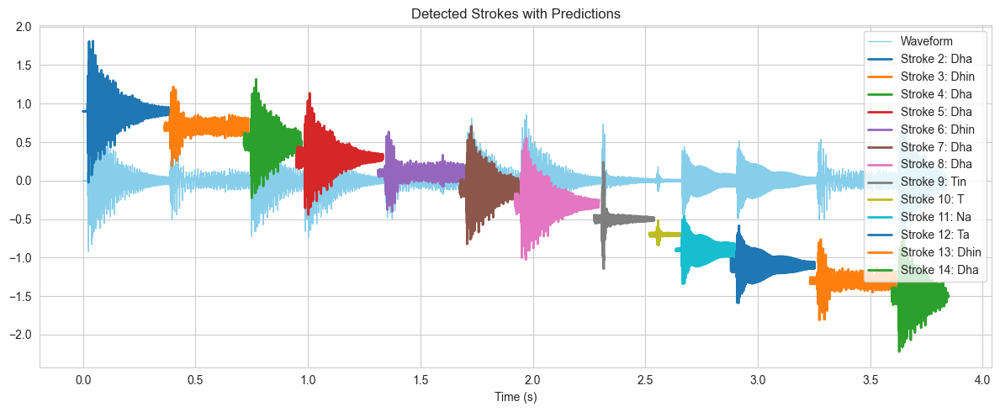

Added onset at 0s manually (initial dB: 0.00)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-56.42 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -6.21)
Stroke 4: Predicted → Ghe (dB: -13.12)
Stroke 5: Predicted → Dha (dB: -1.96)
Stroke 6: Predicted → Dha (dB: -1.86)
Stroke 7: Predicted → Dhin (dB: -6.19)
Stroke 8: Predicted → Ghe (dB: -12.71)
Stroke 9: Predicted → Dha (dB: -2.08)
Stroke 10: Predicted → Dha (dB: -1.80)
Stroke 11: Predicted → Tin (dB: -0.09)
Stroke 12: Predicted → T (dB: -15.12)
Stroke 13: Predicted → Na (dB: -6.33)
Stroke 14: Predicted → Na (dB: -6.79)
Stroke 15: Predicted → Dhin (dB: -5.81)
Stroke 16: Predicted → Ghe (dB: -12.84)
Stroke 17: Predicted → Dha (dB: -2.01)


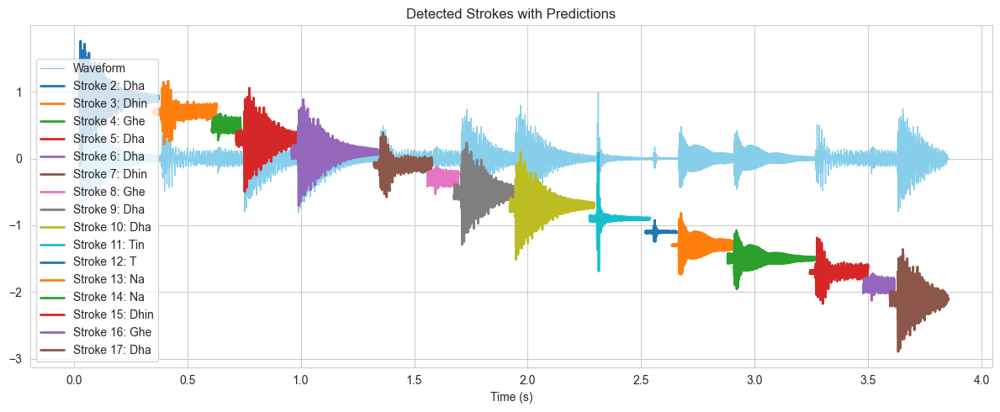

Added onset at 0s manually (initial dB: -3.81)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-55.73 dB).
Stroke 2: Predicted → Dhin (dB: -3.81)
Stroke 3: Predicted → Na (dB: -5.57)
Stroke 4: Predicted → Dhin (dB: -5.39)
Stroke 5: Predicted → Dhin (dB: -5.62)
Stroke 6: Predicted → Na (dB: -5.46)
Stroke 7: Predicted → T (dB: -6.31)
Stroke 8: Predicted → Tin (dB: -3.75)
Stroke 9: Predicted → Na (dB: -7.74)
Stroke 10: Predicted → Tin (dB: -2.07)
Stroke 11: Predicted → Tin (dB: -1.48)
Stroke 12: Predicted → Na (dB: -7.20)
Stroke 13: Predicted → Dha (dB: -4.54)


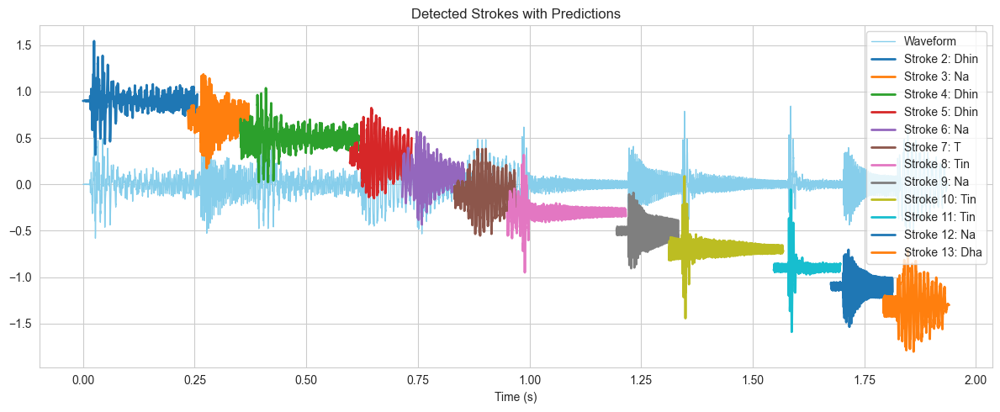

Added onset at 0s manually (initial dB: -3.84)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-57.43 dB).
Stroke 2: Predicted → Dhin (dB: -3.84)
Stroke 3: Predicted → Na (dB: -5.57)
Stroke 4: Predicted → Dhin (dB: -4.33)
Stroke 5: Predicted → Dhin (dB: -5.55)
Stroke 6: Predicted → Na (dB: -4.79)
Stroke 7: Predicted → Dha (dB: -5.01)
Stroke 8: Predicted → Tin (dB: -0.71)
Stroke 9: Predicted → Na (dB: -7.82)
Stroke 10: Predicted → Tin (dB: -0.00)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Na (dB: -7.73)
Stroke 13: Predicted → Dha (dB: -4.50)


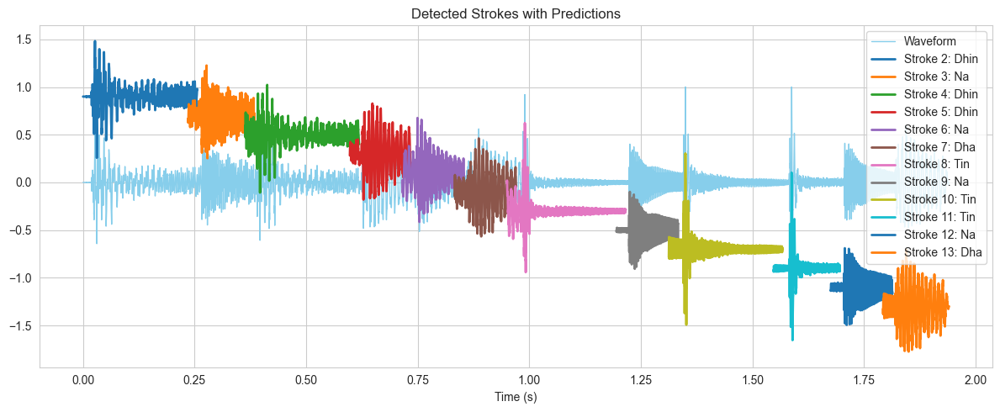

Added onset at 0s manually (initial dB: -2.93)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-53.76 dB).
Stroke 2: Predicted → Dhin (dB: -2.93)
Stroke 3: Predicted → Na (dB: -6.52)
Stroke 4: Predicted → Dha (dB: -4.62)
Stroke 5: Predicted → Dhin (dB: -5.04)
Stroke 6: Predicted → Na (dB: -5.85)
Stroke 7: Predicted → T (dB: -5.25)
Stroke 8: Predicted → Tin (dB: -0.51)
Stroke 9: Predicted → Na (dB: -8.23)
Stroke 10: Predicted → Tin (dB: -0.00)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Na (dB: -7.30)
Stroke 13: Predicted → Na (dB: -5.05)


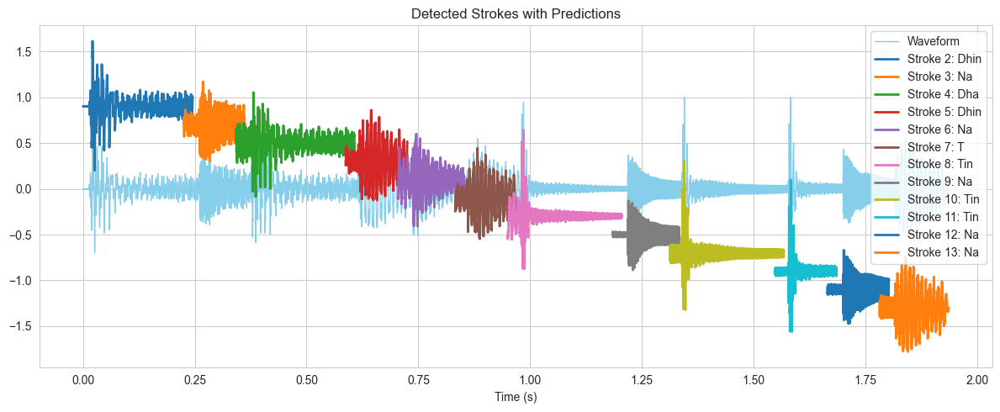

Added onset at 0s manually (initial dB: -4.63)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-52.74 dB).
Stroke 2: Predicted → Dhin (dB: -3.83)
Stroke 3: Predicted → Na (dB: -6.83)
Stroke 4: Predicted → Dhin (dB: -5.32)
Stroke 5: Predicted → Dhin (dB: -5.78)
Stroke 6: Predicted → Na (dB: -5.03)
Stroke 7: Predicted → T (dB: -5.42)
Stroke 8: Predicted → Tin (dB: -3.62)
Stroke 9: Predicted → Na (dB: -8.73)
Stroke 10: Predicted → Tin (dB: -0.98)
Stroke 11: Predicted → Tin (dB: -1.34)
Stroke 12: Predicted → Na (dB: -8.20)
Stroke 13: Predicted → Na (dB: -5.02)


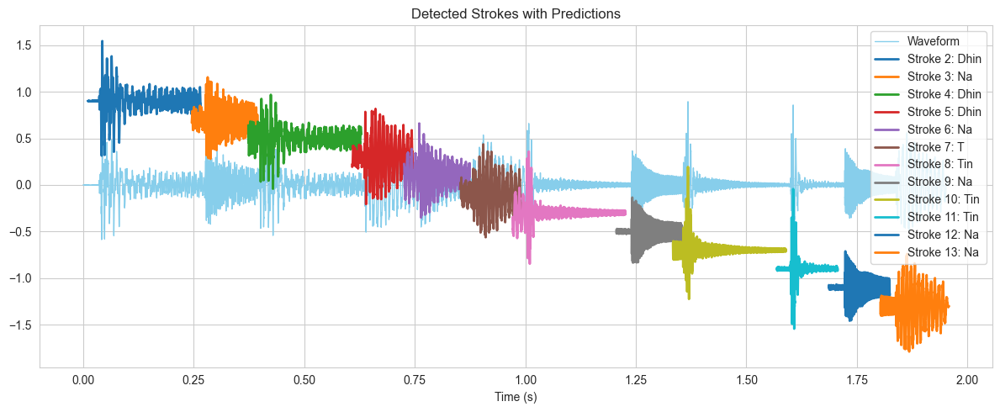

Detected 12 strokes
Stroke 1: Predicted → Dhin (dB: -5.48)
Stroke 2: Predicted → Na (dB: -7.08)
Stroke 3: Predicted → Dhin (dB: -6.31)
Stroke 4: Predicted → Dhin (dB: -5.54)
Stroke 5: Predicted → Na (dB: -5.91)
Stroke 6: Predicted → T (dB: -5.57)
Stroke 7: Predicted → Tin (dB: -3.79)
Stroke 8: Predicted → Na (dB: -9.17)
Stroke 9: Predicted → Tin (dB: -2.29)
Stroke 10: Predicted → Tin (dB: -1.81)
Stroke 11: Predicted → Na (dB: -8.39)
Stroke 12: Predicted → Dha (dB: -4.77)


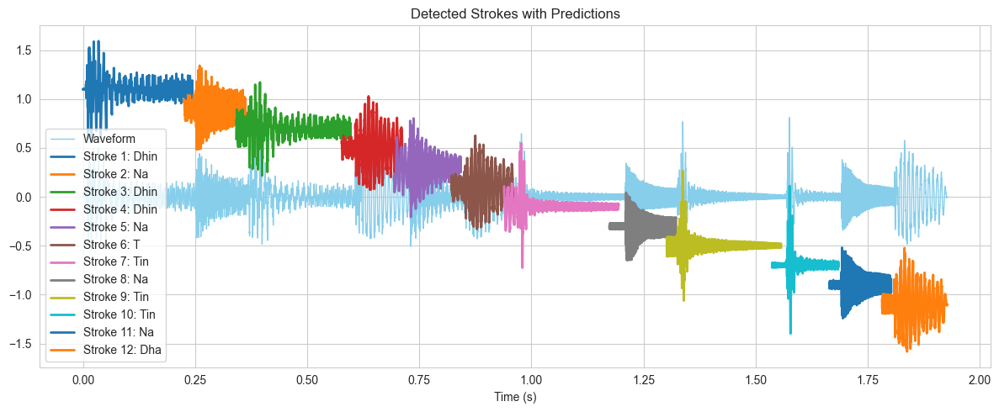

Added onset at 0s manually (initial dB: -58.02)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-52.41 dB).
Stroke 2: Predicted → Dhin (dB: -3.90)
Stroke 3: Predicted → Na (dB: -6.60)
Stroke 4: Predicted → Dha (dB: -5.32)
Stroke 5: Predicted → Dhin (dB: -5.51)
Stroke 6: Predicted → Na (dB: -5.99)
Stroke 7: Predicted → T (dB: -5.75)
Stroke 8: Predicted → Tin (dB: -2.06)
Stroke 9: Predicted → Na (dB: -8.96)
Stroke 10: Predicted → Tin (dB: -0.87)
Stroke 11: Predicted → Tin (dB: -0.62)
Stroke 12: Predicted → Na (dB: -8.30)
Stroke 13: Predicted → T (dB: -4.91)


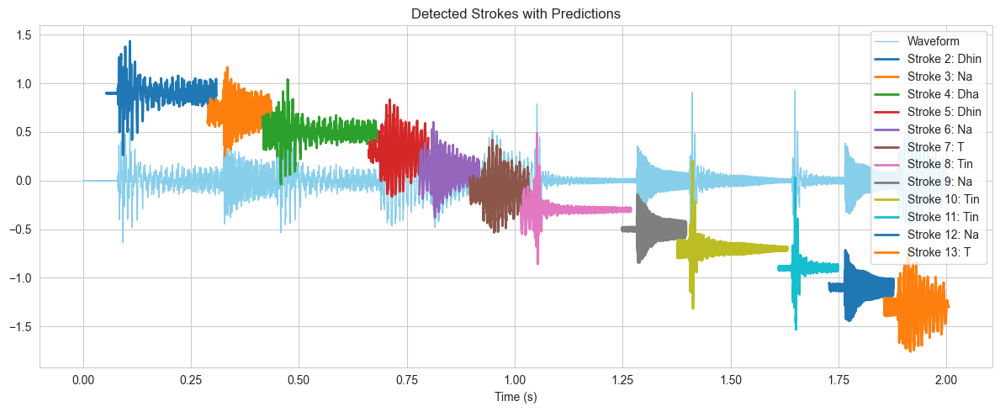

Added onset at 0s manually (initial dB: -1.89)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-53.46 dB).
Stroke 2: Predicted → Dhin (dB: -1.89)
Stroke 3: Predicted → Na (dB: -5.73)
Stroke 4: Predicted → Dha (dB: -2.27)
Stroke 5: Predicted → Dhin (dB: -5.33)
Stroke 6: Predicted → Na (dB: -5.24)
Stroke 7: Predicted → T (dB: -4.51)
Stroke 8: Predicted → Tin (dB: -2.06)
Stroke 9: Predicted → Na (dB: -7.22)
Stroke 10: Predicted → Tin (dB: -1.46)
Stroke 11: Predicted → Tin (dB: -1.72)
Stroke 12: Predicted → Na (dB: -6.87)
Stroke 13: Predicted → Dha (dB: -3.79)


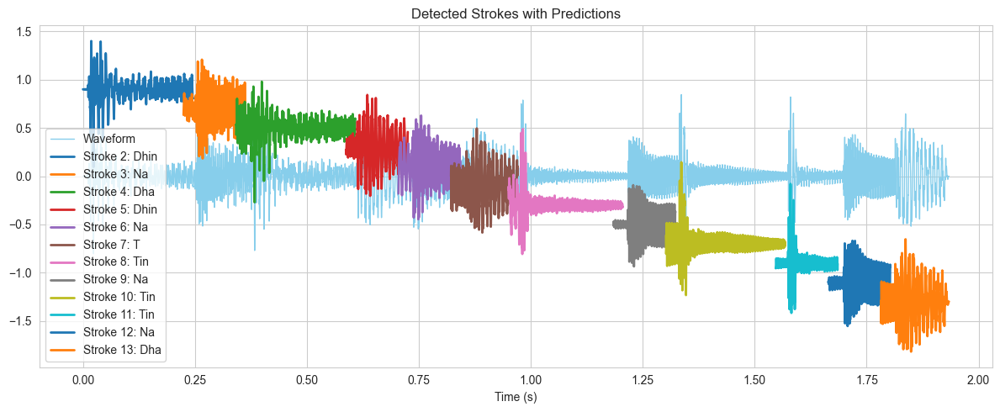

Added onset at 0s manually (initial dB: -1.70)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-51.57 dB).
Stroke 2: Predicted → Dhin (dB: -1.70)
Stroke 3: Predicted → Na (dB: -5.71)
Stroke 4: Predicted → Dha (dB: -2.75)
Stroke 5: Predicted → Dhin (dB: -4.90)
Stroke 6: Predicted → Na (dB: -5.27)
Stroke 7: Predicted → T (dB: -5.11)
Stroke 8: Predicted → Tin (dB: -2.01)
Stroke 9: Predicted → Na (dB: -7.05)
Stroke 10: Predicted → Tin (dB: -2.03)
Stroke 11: Predicted → Tin (dB: -1.06)
Stroke 12: Predicted → Na (dB: -6.53)
Stroke 13: Predicted → Dha (dB: -4.62)


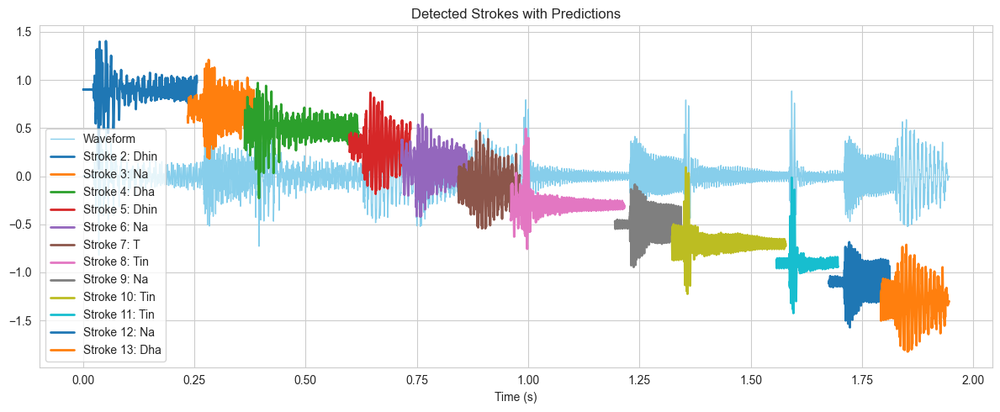

Added onset at 0s manually (initial dB: -4.48)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-36.16 dB).
Stroke 2: Predicted → Dhin (dB: -4.48)
Stroke 3: Predicted → Na (dB: -5.50)
Stroke 4: Predicted → Dha (dB: -6.28)
Stroke 5: Predicted → Dhin (dB: -4.92)
Stroke 6: Predicted → Na (dB: -4.82)
Stroke 7: Predicted → Na (dB: -5.24)
Stroke 8: Predicted → Tin (dB: -2.27)
Stroke 9: Predicted → Na (dB: -7.09)
Stroke 10: Predicted → Tin (dB: -0.74)
Stroke 11: Predicted → Tin (dB: -1.58)
Stroke 12: Predicted → Na (dB: -6.80)
Stroke 13: Predicted → Ghe (dB: -4.42)


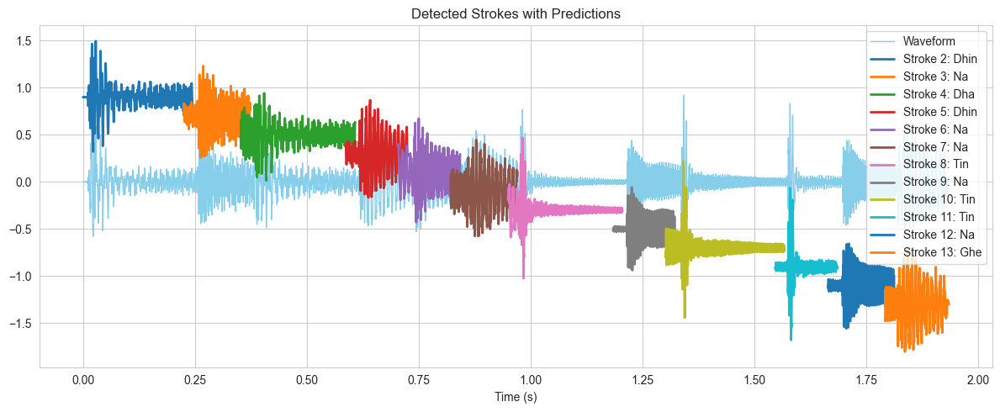

Added onset at 0s manually (initial dB: -4.37)
Detected 14 strokes
Skipping stroke 1: below dB threshold (-50.81 dB).
Stroke 2: Predicted → Dhin (dB: -4.37)
Stroke 3: Predicted → Na (dB: -6.85)
Stroke 4: Predicted → Dha (dB: -4.90)
Stroke 5: Predicted → Dhin (dB: -4.94)
Stroke 6: Predicted → Na (dB: -3.94)
Stroke 7: Predicted → T (dB: -4.98)
Stroke 8: Predicted → Tin (dB: -1.01)
Stroke 9: Predicted → Na (dB: -7.07)
Stroke 10: Predicted → Tin (dB: -0.00)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Na (dB: -6.51)
Stroke 13: Predicted → T (dB: -4.64)
Stroke 14: Predicted → T (dB: -9.63)


/opt/anaconda3/envs/ML312/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


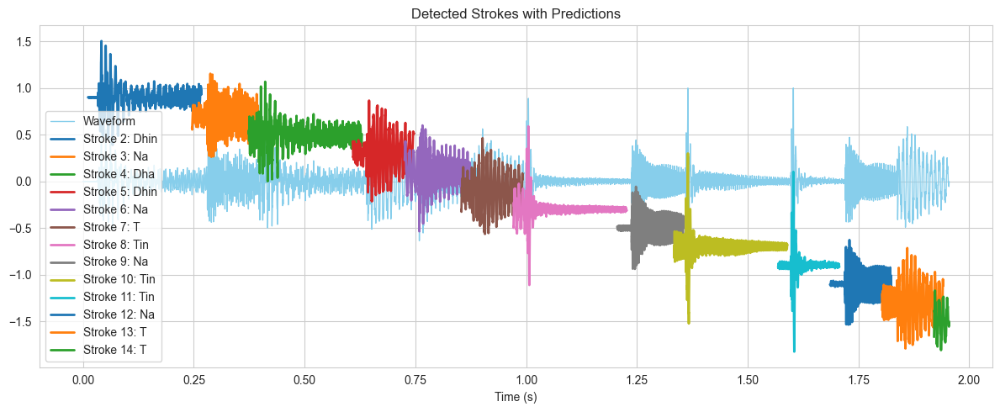

Added onset at 0s manually (initial dB: -62.61)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-54.19 dB).
Stroke 2: Predicted → Dha (dB: -2.47)
Stroke 3: Predicted → Dhin (dB: -7.77)
Stroke 4: Predicted → Na (dB: -7.08)
Stroke 5: Predicted → Dha (dB: -4.12)
Stroke 6: Predicted → Tin (dB: -6.21)
Stroke 7: Predicted → Ta (dB: -8.52)


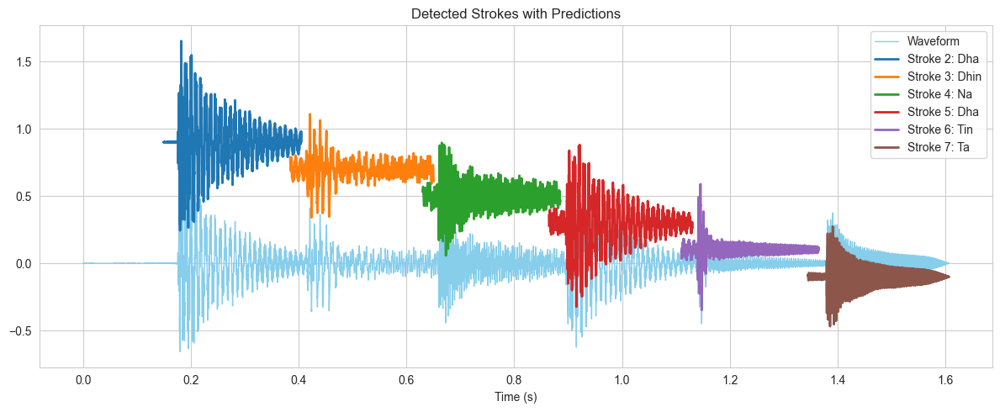

Added onset at 0s manually (initial dB: -62.17)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-51.32 dB).
Stroke 2: Predicted → Dha (dB: -2.55)
Stroke 3: Predicted → Dhin (dB: -7.35)
Stroke 4: Predicted → Na (dB: -7.39)
Stroke 5: Predicted → Dha (dB: -4.72)
Stroke 6: Predicted → Tin (dB: -3.01)
Stroke 7: Predicted → Ta (dB: -8.89)


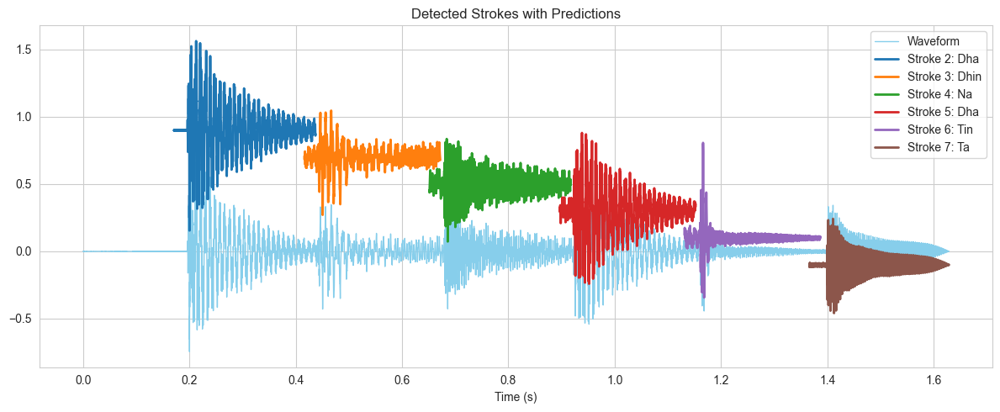

Added onset at 0s manually (initial dB: -54.21)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-52.68 dB).
Stroke 2: Predicted → Dha (dB: -3.02)
Stroke 3: Predicted → Dhin (dB: -6.97)
Stroke 4: Predicted → Na (dB: -8.61)
Stroke 5: Predicted → Dha (dB: -4.54)
Stroke 6: Predicted → Tin (dB: -2.93)
Stroke 7: Predicted → Na (dB: -9.01)


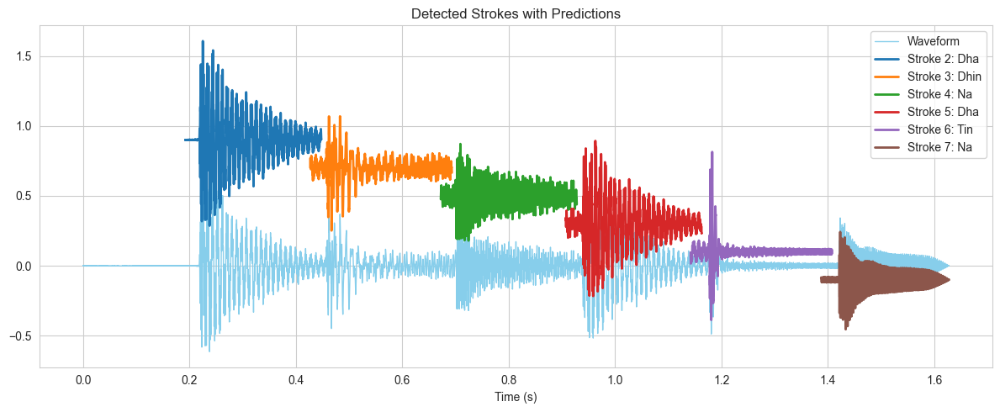

Added onset at 0s manually (initial dB: -63.65)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-56.02 dB).
Stroke 2: Predicted → Dha (dB: -2.80)
Stroke 3: Predicted → Dhin (dB: -7.94)
Stroke 4: Predicted → Na (dB: -8.01)
Stroke 5: Predicted → Dha (dB: -4.66)
Stroke 6: Predicted → Tin (dB: -5.95)
Stroke 7: Predicted → Na (dB: -9.30)


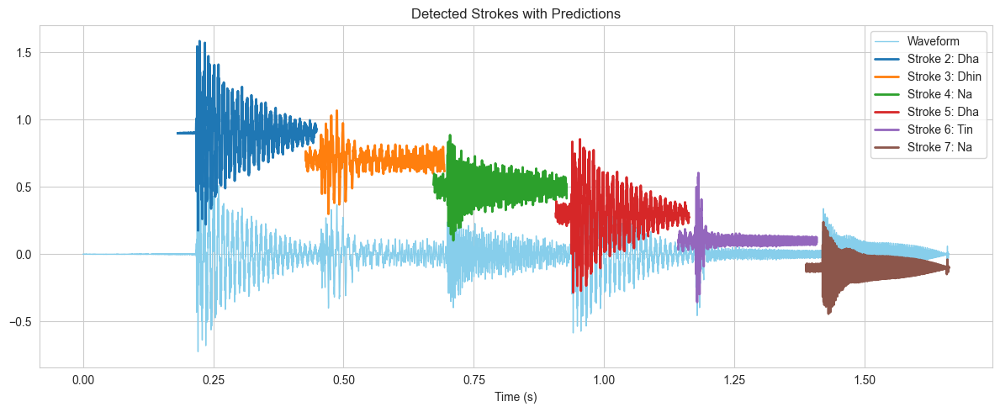

Added onset at 0s manually (initial dB: -65.45)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-49.72 dB).
Stroke 2: Predicted → Dha (dB: -3.61)
Stroke 3: Predicted → Dhin (dB: -8.06)
Stroke 4: Predicted → Na (dB: -8.06)
Stroke 5: Predicted → Dha (dB: -5.45)
Stroke 6: Predicted → Tin (dB: -5.95)
Stroke 7: Predicted → Ta (dB: -9.75)


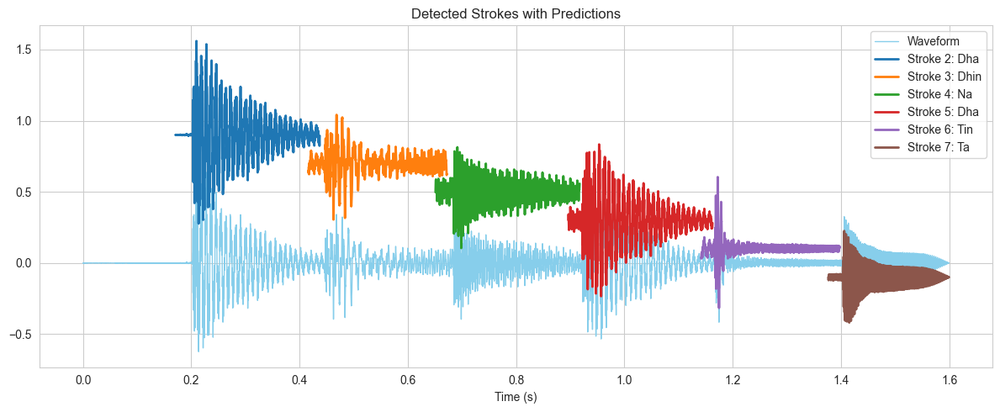

Added onset at 0s manually (initial dB: -64.40)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-51.58 dB).
Stroke 2: Predicted → Dha (dB: -3.10)
Stroke 3: Predicted → Dhin (dB: -8.37)
Stroke 4: Predicted → Na (dB: -7.66)
Stroke 5: Predicted → Dha (dB: -4.84)
Stroke 6: Predicted → Tin (dB: -4.28)
Stroke 7: Predicted → Ta (dB: -9.90)


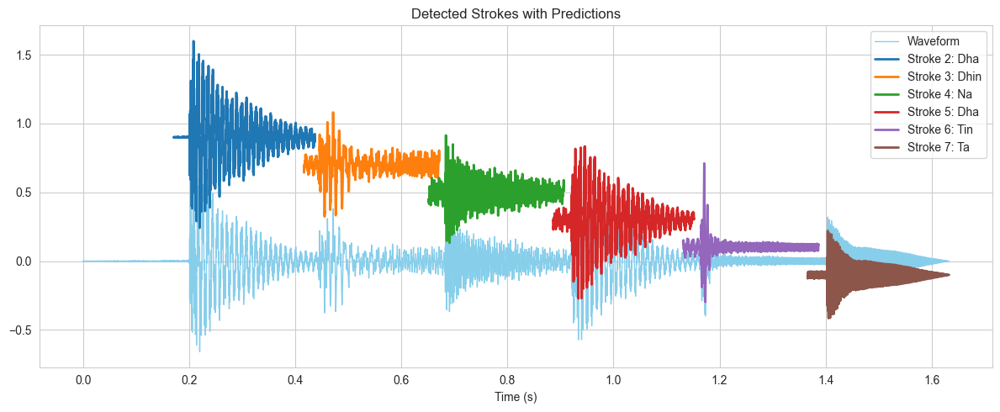

Added onset at 0s manually (initial dB: -62.36)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-54.05 dB).
Stroke 2: Predicted → Dha (dB: -2.49)
Stroke 3: Predicted → Dhin (dB: -5.69)
Stroke 4: Predicted → Na (dB: -7.45)
Stroke 5: Predicted → Dha (dB: -4.24)
Stroke 6: Predicted → Tin (dB: -5.10)
Stroke 7: Predicted → Ta (dB: -8.81)


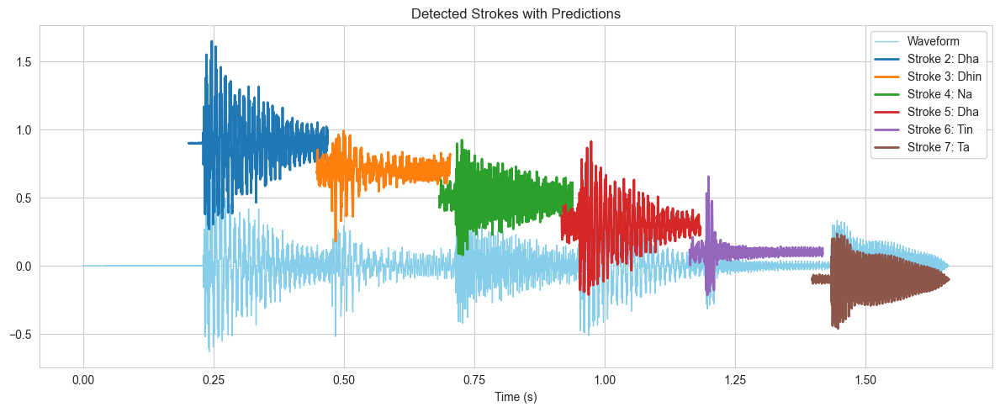

Added onset at 0s manually (initial dB: -64.73)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-51.60 dB).
Stroke 2: Predicted → Dha (dB: -3.24)
Stroke 3: Predicted → Dhin (dB: -5.40)
Stroke 4: Predicted → Na (dB: -7.96)
Stroke 5: Predicted → Dha (dB: -4.01)
Stroke 6: Predicted → Tin (dB: -4.76)
Stroke 7: Predicted → Ta (dB: -8.53)


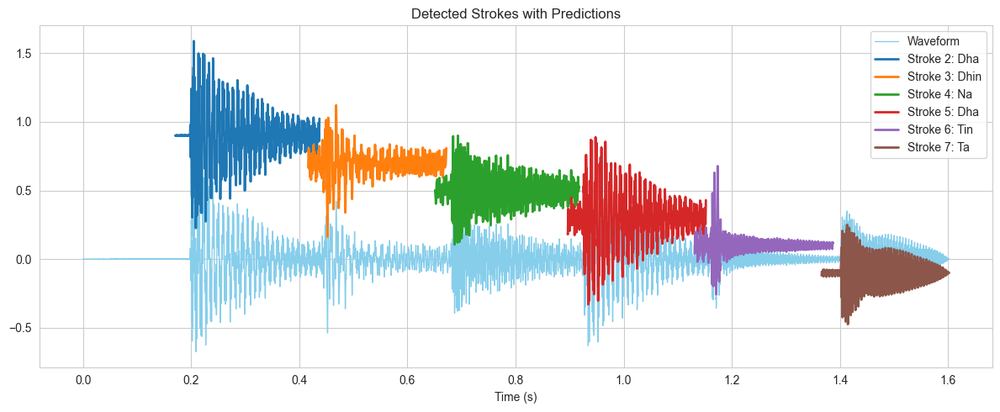

Added onset at 0s manually (initial dB: -63.54)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-51.74 dB).
Stroke 2: Predicted → Dha (dB: -2.53)
Stroke 3: Predicted → Dhin (dB: -7.46)
Stroke 4: Predicted → Na (dB: -7.97)
Stroke 5: Predicted → Dha (dB: -2.90)
Stroke 6: Predicted → Tin (dB: -4.55)
Stroke 7: Predicted → Ta (dB: -8.18)


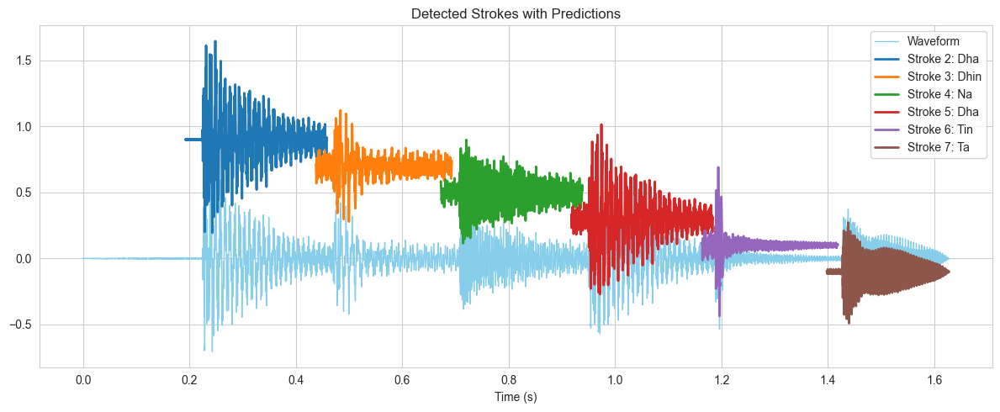

Added onset at 0s manually (initial dB: -63.39)
Detected 7 strokes
Skipping stroke 1: below dB threshold (-55.05 dB).
Stroke 2: Predicted → Dha (dB: -1.98)
Stroke 3: Predicted → Dhin (dB: -8.13)
Stroke 4: Predicted → Na (dB: -7.36)
Stroke 5: Predicted → Dha (dB: -4.09)
Stroke 6: Predicted → Tin (dB: -3.40)
Stroke 7: Predicted → Ta (dB: -8.54)


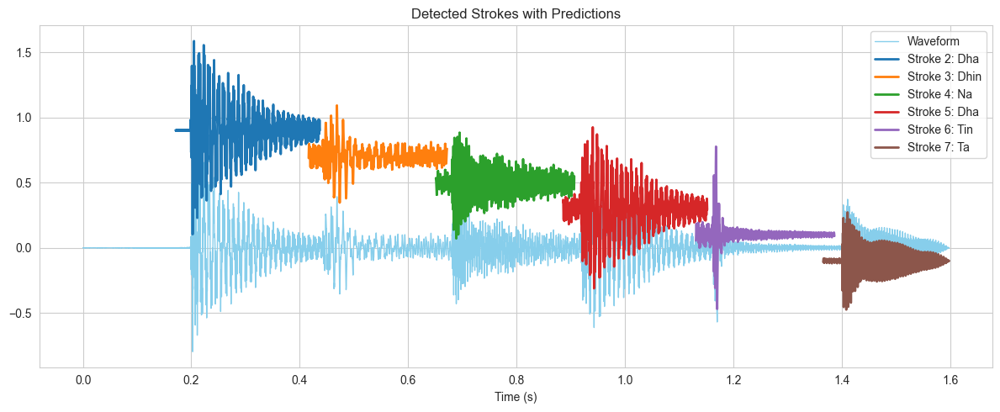

Added onset at 0s manually (initial dB: -2.91)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-49.65 dB).
Stroke 2: Predicted → Dha (dB: -2.91)
Stroke 3: Predicted → Dhin (dB: -7.45)
Stroke 4: Predicted → Dha (dB: -4.35)
Stroke 5: Predicted → Dha (dB: -4.70)
Stroke 6: Predicted → Tin (dB: -7.58)
Stroke 7: Predicted → Ta (dB: -8.40)
Stroke 8: Predicted → Tin (dB: -6.91)
Stroke 9: Predicted → Dha (dB: -4.03)
Stroke 10: Predicted → Dha (dB: -4.76)
Stroke 11: Predicted → Dhin (dB: -7.02)


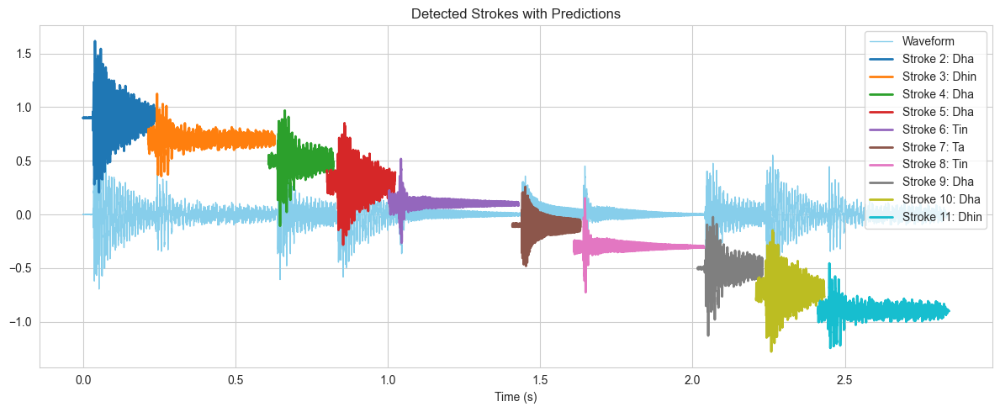

Added onset at 0s manually (initial dB: -3.26)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-55.75 dB).
Stroke 2: Predicted → Dha (dB: -3.26)
Stroke 3: Predicted → Dhin (dB: -8.97)
Stroke 4: Predicted → Dha (dB: -4.89)
Stroke 5: Predicted → Dha (dB: -4.89)
Stroke 6: Predicted → Tin (dB: -3.28)
Stroke 7: Predicted → Ta (dB: -8.89)
Stroke 8: Predicted → Tin (dB: -3.57)
Stroke 9: Predicted → Dha (dB: -4.84)
Stroke 10: Predicted → Dha (dB: -4.96)
Stroke 11: Predicted → Dhin (dB: -8.25)


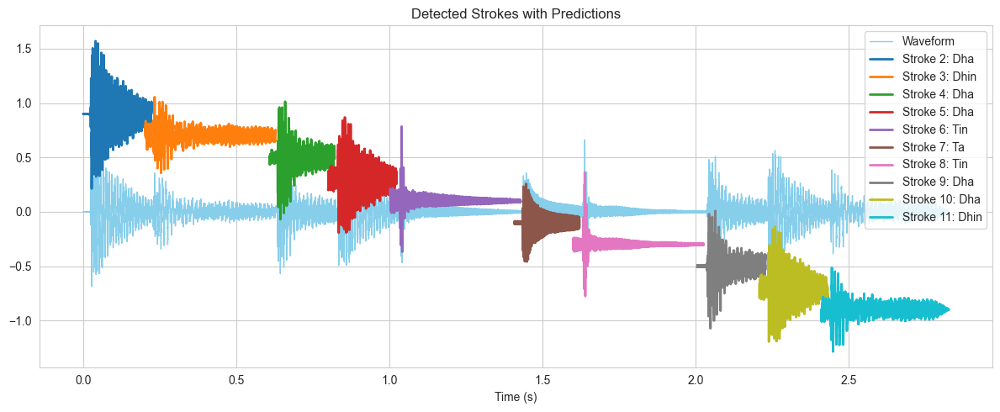

Added onset at 0s manually (initial dB: -3.47)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-52.58 dB).
Stroke 2: Predicted → Dha (dB: -3.47)
Stroke 3: Predicted → Dhin (dB: -7.33)
Stroke 4: Predicted → Dha (dB: -5.60)
Stroke 5: Predicted → Dha (dB: -5.28)
Stroke 6: Predicted → Tin (dB: -3.44)
Stroke 7: Predicted → Ta (dB: -8.98)
Stroke 8: Predicted → Tin (dB: -2.89)
Stroke 9: Predicted → Dha (dB: -5.51)
Stroke 10: Predicted → Dha (dB: -5.25)
Stroke 11: Predicted → Dhin (dB: -6.93)


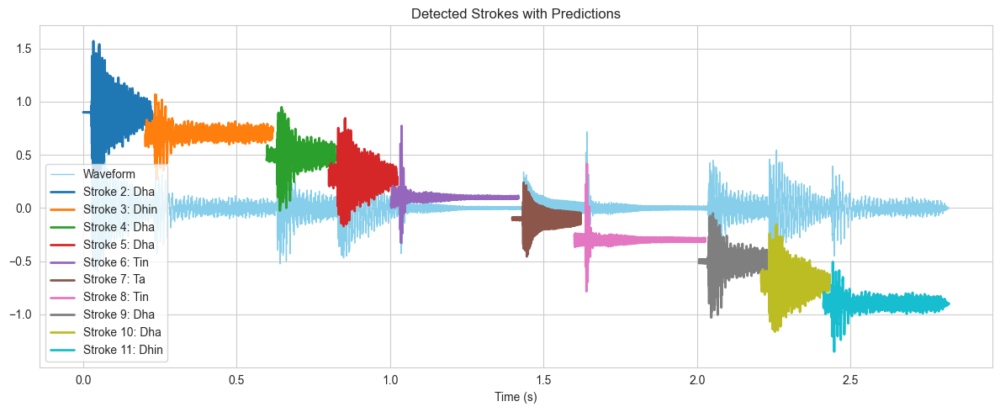

Added onset at 0s manually (initial dB: -3.35)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-54.30 dB).
Stroke 2: Predicted → Dha (dB: -3.35)
Stroke 3: Predicted → Dhin (dB: -7.69)
Stroke 4: Predicted → Dha (dB: -5.61)
Stroke 5: Predicted → Dha (dB: -4.94)
Stroke 6: Predicted → Tin (dB: -7.29)
Stroke 7: Predicted → Ta (dB: -9.38)
Stroke 8: Predicted → Tin (dB: -6.45)
Stroke 9: Predicted → Dha (dB: -5.59)
Stroke 10: Predicted → Dha (dB: -4.95)
Stroke 11: Predicted → Dhin (dB: -7.53)


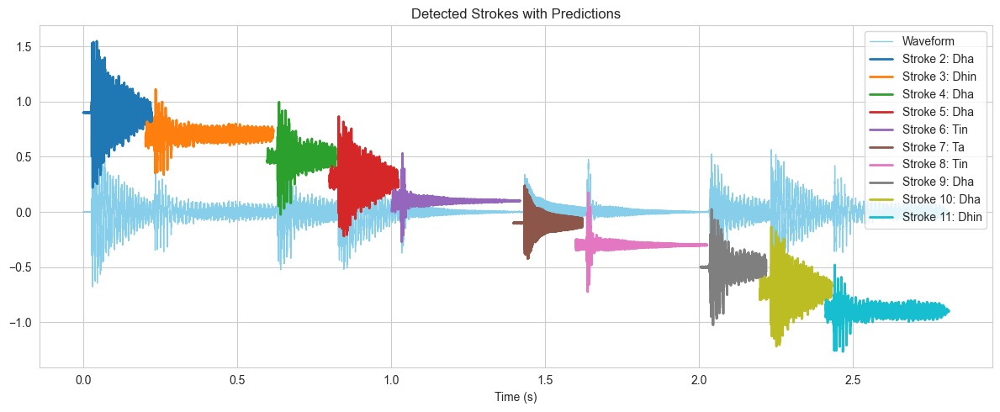

Added onset at 0s manually (initial dB: -3.94)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-54.57 dB).
Stroke 2: Predicted → Dha (dB: -3.94)
Stroke 3: Predicted → Dhin (dB: -8.32)
Stroke 4: Predicted → Dha (dB: -5.12)
Stroke 5: Predicted → Dha (dB: -5.10)
Stroke 6: Predicted → Tin (dB: -6.78)
Stroke 7: Predicted → Ta (dB: -9.47)
Stroke 8: Predicted → Tin (dB: -7.11)
Stroke 9: Predicted → Dha (dB: -5.13)
Stroke 10: Predicted → Dha (dB: -5.12)
Stroke 11: Predicted → Dhin (dB: -9.28)


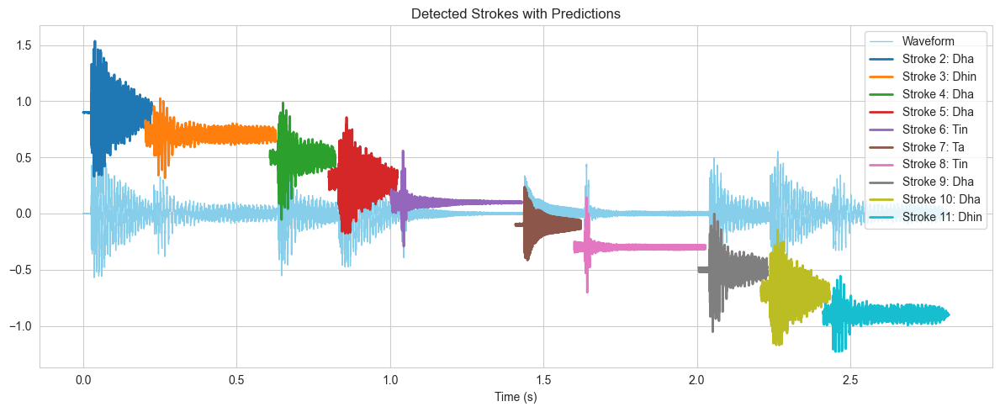

Added onset at 0s manually (initial dB: -3.62)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-51.79 dB).
Stroke 2: Predicted → Dha (dB: -3.62)
Stroke 3: Predicted → Dhin (dB: -8.83)
Stroke 4: Predicted → Dha (dB: -6.10)
Stroke 5: Predicted → Dha (dB: -5.90)
Stroke 6: Predicted → Tin (dB: -5.70)
Stroke 7: Predicted → Ta (dB: -9.10)
Stroke 8: Predicted → Tin (dB: -5.45)
Stroke 9: Predicted → Dha (dB: -5.47)
Stroke 10: Predicted → Dha (dB: -5.84)
Stroke 11: Predicted → Dhin (dB: -8.44)


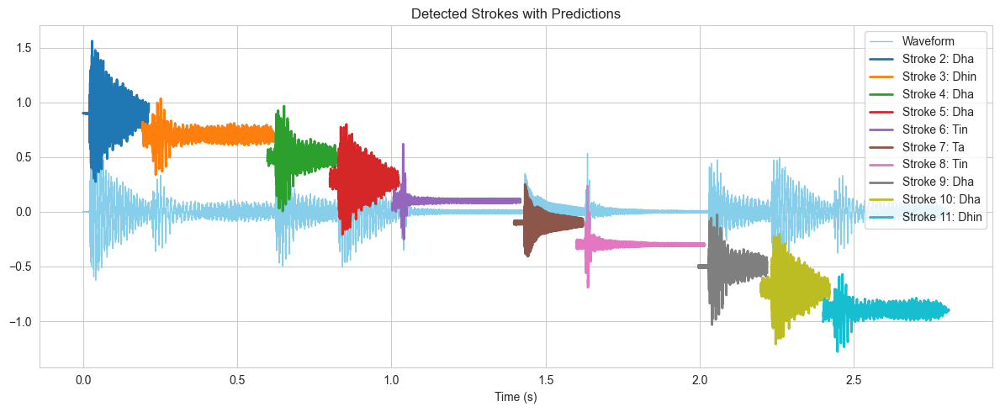

Added onset at 0s manually (initial dB: -3.78)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-48.97 dB).
Stroke 2: Predicted → Dha (dB: -2.77)
Stroke 3: Predicted → Dhin (dB: -6.49)
Stroke 4: Predicted → Dha (dB: -4.35)
Stroke 5: Predicted → Dha (dB: -4.72)
Stroke 6: Predicted → Tin (dB: -5.84)
Stroke 7: Predicted → Ta (dB: -8.58)
Stroke 8: Predicted → Tin (dB: -6.26)
Stroke 9: Predicted → Dha (dB: -4.23)
Stroke 10: Predicted → Dha (dB: -4.79)
Stroke 11: Predicted → Dhin (dB: -6.74)


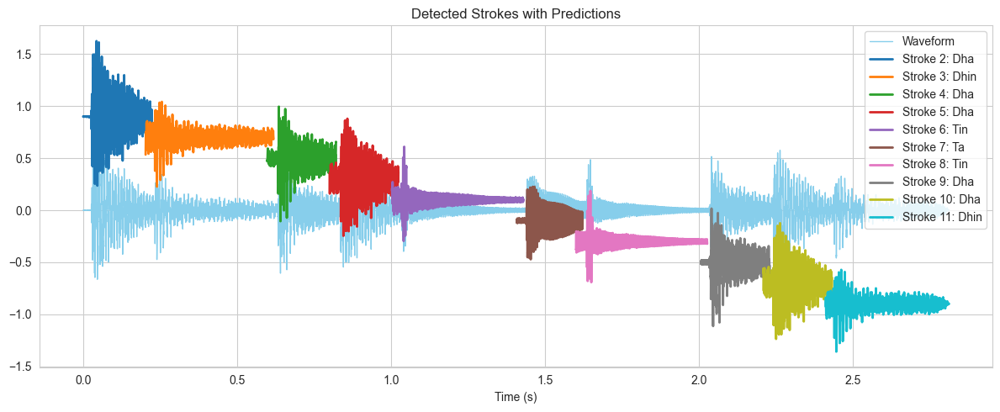

Added onset at 0s manually (initial dB: -3.27)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-54.02 dB).
Stroke 2: Predicted → Dha (dB: -3.27)
Stroke 3: Predicted → Dhin (dB: -6.28)
Stroke 4: Predicted → Dha (dB: -3.82)
Stroke 5: Predicted → Dha (dB: -5.33)
Stroke 6: Predicted → Tin (dB: -6.37)
Stroke 7: Predicted → Ta (dB: -8.34)
Stroke 8: Predicted → Tin (dB: -4.88)
Stroke 9: Predicted → Dha (dB: -3.63)
Stroke 10: Predicted → Dha (dB: -5.27)
Stroke 11: Predicted → Dhin (dB: -5.28)


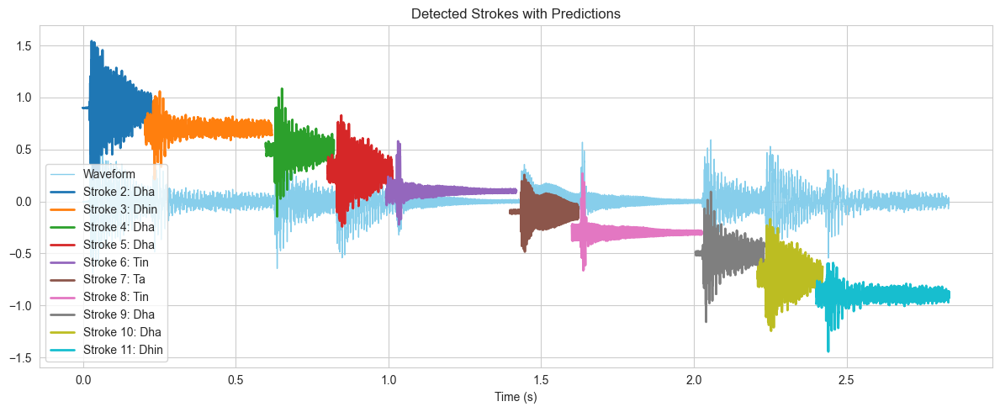

Added onset at 0s manually (initial dB: -3.42)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-53.61 dB).
Stroke 2: Predicted → Dha (dB: -2.64)
Stroke 3: Predicted → Dha (dB: -7.36)
Stroke 4: Predicted → Dha (dB: -4.89)
Stroke 5: Predicted → Dha (dB: -4.35)
Stroke 6: Predicted → Tin (dB: -5.98)
Stroke 7: Predicted → Ta (dB: -8.35)
Stroke 8: Predicted → Tin (dB: -5.43)
Stroke 9: Predicted → Dha (dB: -4.65)
Stroke 10: Predicted → Dha (dB: -4.41)
Stroke 11: Predicted → Dha (dB: -7.36)


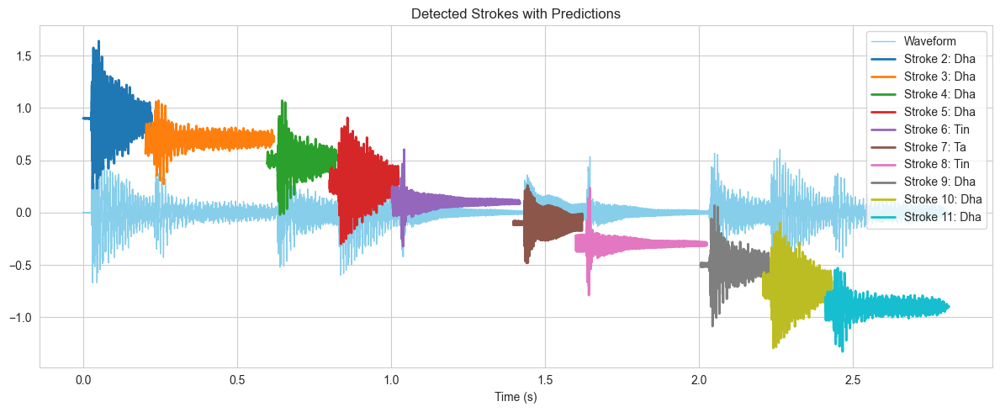

Added onset at 0s manually (initial dB: -2.41)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-55.59 dB).
Stroke 2: Predicted → Dha (dB: -2.41)
Stroke 3: Predicted → Dhin (dB: -8.82)
Stroke 4: Predicted → Dha (dB: -4.63)
Stroke 5: Predicted → Dha (dB: -3.81)
Stroke 6: Predicted → Tin (dB: -3.35)
Stroke 7: Predicted → Ta (dB: -8.14)
Stroke 8: Predicted → Tin (dB: -2.77)
Stroke 9: Predicted → Dha (dB: -4.45)
Stroke 10: Predicted → Dha (dB: -3.82)
Stroke 11: Predicted → Dhin (dB: -8.86)


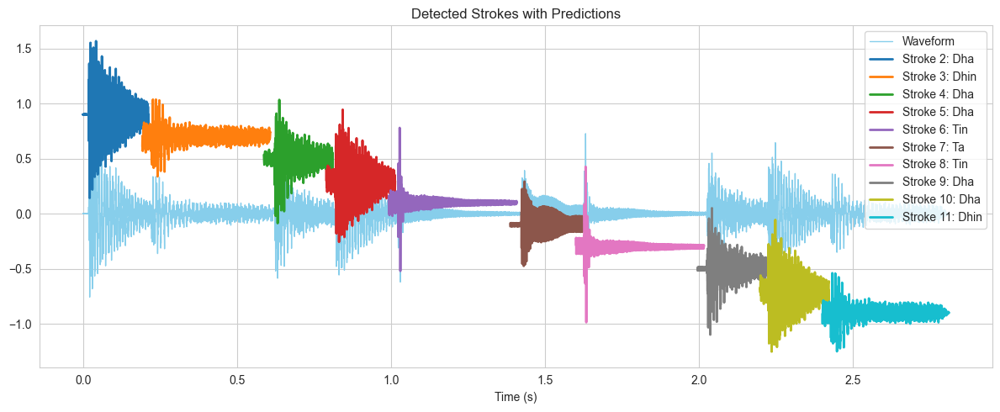

Added onset at 0s manually (initial dB: -50.92)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-50.92 dB).
Stroke 2: Predicted → Dhin (dB: -0.49)
Stroke 3: Predicted → Dhin (dB: -8.95)
Stroke 4: Predicted → Dha (dB: -4.75)
Stroke 5: Predicted → T (dB: -8.48)
Stroke 6: Predicted → Ti (dB: -8.47)
Stroke 7: Predicted → Ti (dB: -6.26)
Stroke 8: Predicted → Tun (dB: -5.97)
Stroke 9: Predicted → Na (dB: -9.02)
Stroke 10: Predicted → Kat (dB: -4.33)
Stroke 11: Predicted → Ta (dB: -5.29)
Stroke 12: Predicted → Dha (dB: -4.87)
Stroke 13: Predicted → T (dB: -8.98)
Stroke 14: Predicted → Ti (dB: -7.61)
Stroke 15: Predicted → Ti (dB: -6.82)
Stroke 16: Predicted → Dhin (dB: -7.63)
Stroke 17: Predicted → Na (dB: -9.42)


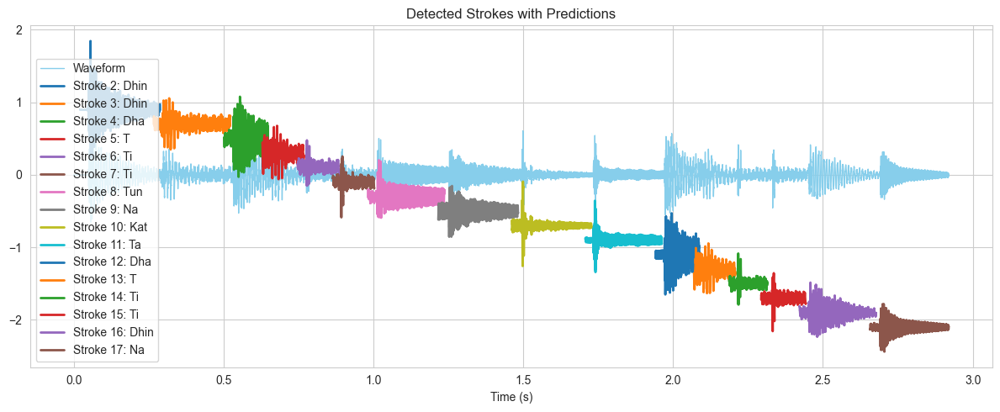

Added onset at 0s manually (initial dB: -59.47)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-52.02 dB).
Stroke 2: Predicted → Dhin (dB: -0.02)
Stroke 3: Predicted → Dhin (dB: -8.98)
Stroke 4: Predicted → Dha (dB: -5.07)
Stroke 5: Predicted → T (dB: -8.19)
Stroke 6: Predicted → Ti (dB: -7.06)
Stroke 7: Predicted → Ti (dB: -6.30)
Stroke 8: Predicted → Tun (dB: -5.18)
Stroke 9: Predicted → Na (dB: -7.29)
Stroke 10: Predicted → Kat (dB: -4.83)
Stroke 11: Predicted → Ta (dB: -4.93)
Stroke 12: Predicted → Dha (dB: -4.67)
Stroke 13: Predicted → Dha (dB: -8.81)
Stroke 14: Predicted → Ti (dB: -6.89)
Stroke 15: Predicted → Re (dB: -5.88)
Stroke 16: Predicted → Dhin (dB: -7.63)
Stroke 17: Predicted → Na (dB: -8.78)
Stroke 18: Predicted → T (dB: -8.88)


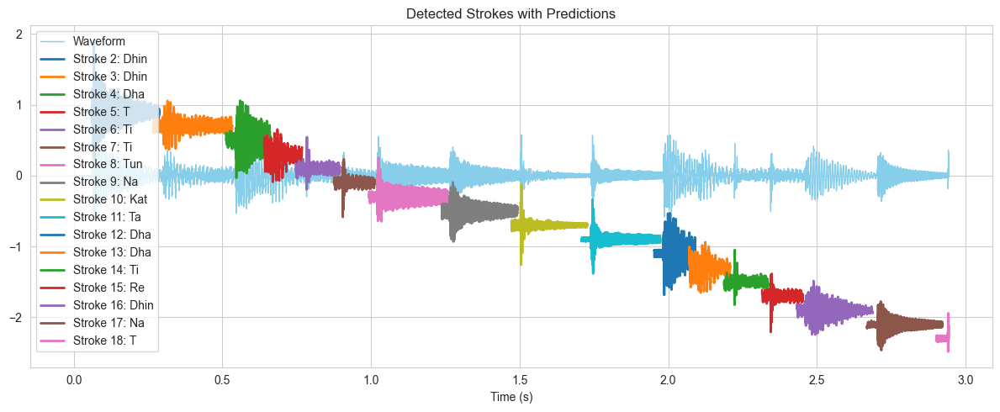

Added onset at 0s manually (initial dB: -1.92)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-54.74 dB).
Stroke 2: Predicted → Dhin (dB: -1.92)
Stroke 3: Predicted → Dhin (dB: -8.59)
Stroke 4: Predicted → Dha (dB: -5.39)
Stroke 5: Predicted → T (dB: -8.58)
Stroke 6: Predicted → Ti (dB: -8.53)
Stroke 7: Predicted → T (dB: -7.37)
Stroke 8: Predicted → Tun (dB: -5.14)
Stroke 9: Predicted → Na (dB: -9.31)
Stroke 10: Predicted → T (dB: -5.43)
Stroke 11: Predicted → Ta (dB: -5.64)
Stroke 12: Predicted → Dha (dB: -5.32)
Stroke 13: Predicted → Dha (dB: -8.36)
Stroke 14: Predicted → Ti (dB: -8.26)
Stroke 15: Predicted → T (dB: -7.15)
Stroke 16: Predicted → Dhin (dB: -7.72)
Stroke 17: Predicted → Na (dB: -9.56)


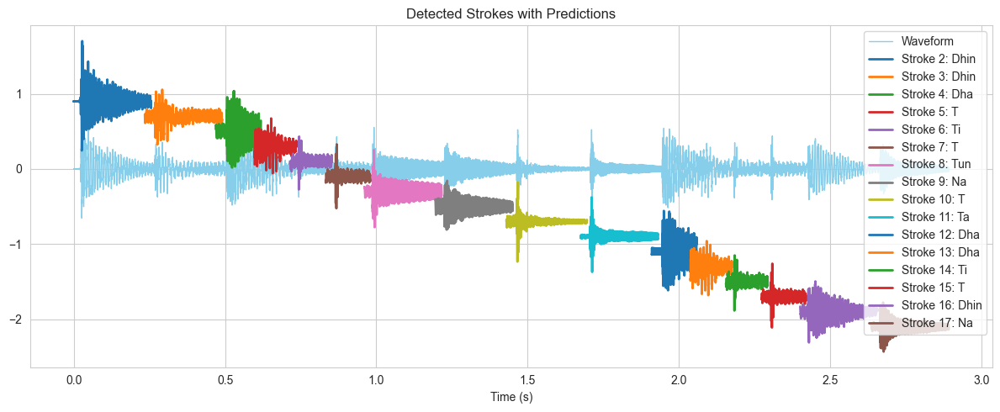

Added onset at 0s manually (initial dB: -3.70)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-59.58 dB).
Stroke 2: Predicted → Dhin (dB: -3.70)
Stroke 3: Predicted → Dhin (dB: -8.84)
Stroke 4: Predicted → Dha (dB: -5.12)
Stroke 5: Predicted → T (dB: -8.47)
Stroke 6: Predicted → Ti (dB: -8.35)
Stroke 7: Predicted → Re (dB: -6.55)
Stroke 8: Predicted → Tun (dB: -4.72)
Stroke 9: Predicted → Na (dB: -8.02)
Stroke 10: Predicted → Kat (dB: -4.67)
Stroke 11: Predicted → Ta (dB: -6.24)
Stroke 12: Predicted → Dha (dB: -4.76)
Stroke 13: Predicted → T (dB: -8.05)
Stroke 14: Predicted → Ti (dB: -7.63)
Stroke 15: Predicted → T (dB: -7.03)
Stroke 16: Predicted → Dhin (dB: -7.35)
Stroke 17: Predicted → Na (dB: -10.11)


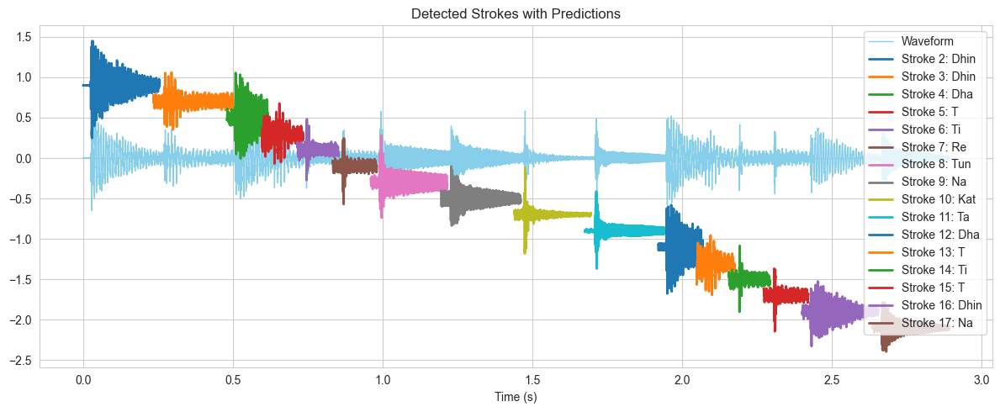

Added onset at 0s manually (initial dB: -3.28)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-55.14 dB).
Stroke 2: Predicted → Dhin (dB: -3.28)
Stroke 3: Predicted → Dhin (dB: -9.12)
Stroke 4: Predicted → Dha (dB: -5.31)
Stroke 5: Predicted → T (dB: -8.74)
Stroke 6: Predicted → Ti (dB: -8.95)
Stroke 7: Predicted → T (dB: -6.14)
Stroke 8: Predicted → Tun (dB: -6.22)
Stroke 9: Predicted → Na (dB: -10.28)
Stroke 10: Predicted → T (dB: -4.27)
Stroke 11: Predicted → T (dB: -6.31)
Stroke 12: Predicted → Dha (dB: -5.20)
Stroke 13: Predicted → T (dB: -8.13)
Stroke 14: Predicted → Ti (dB: -9.07)
Stroke 15: Predicted → Re (dB: -5.78)
Stroke 16: Predicted → Dhin (dB: -7.72)
Stroke 17: Predicted → Na (dB: -10.06)


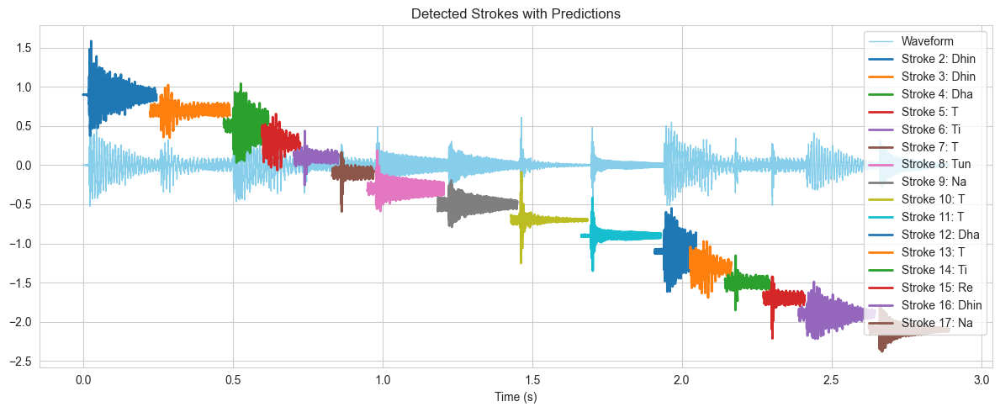

Added onset at 0s manually (initial dB: -3.89)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-55.84 dB).
Stroke 2: Predicted → Dhin (dB: -3.89)
Stroke 3: Predicted → Dhin (dB: -8.51)
Stroke 4: Predicted → Dha (dB: -5.61)
Stroke 5: Predicted → T (dB: -8.08)
Stroke 6: Predicted → Ti (dB: -9.01)
Stroke 7: Predicted → T (dB: -6.46)
Stroke 8: Predicted → Tun (dB: -8.88)
Stroke 9: Predicted → Na (dB: -9.34)
Stroke 10: Predicted → T (dB: -4.28)
Stroke 11: Predicted → T (dB: -6.34)
Stroke 12: Predicted → Dha (dB: -5.24)
Stroke 13: Predicted → T (dB: -8.28)
Stroke 14: Predicted → Ti (dB: -8.16)
Stroke 15: Predicted → T (dB: -7.40)
Stroke 16: Predicted → Dhin (dB: -8.23)
Stroke 17: Predicted → Na (dB: -9.68)


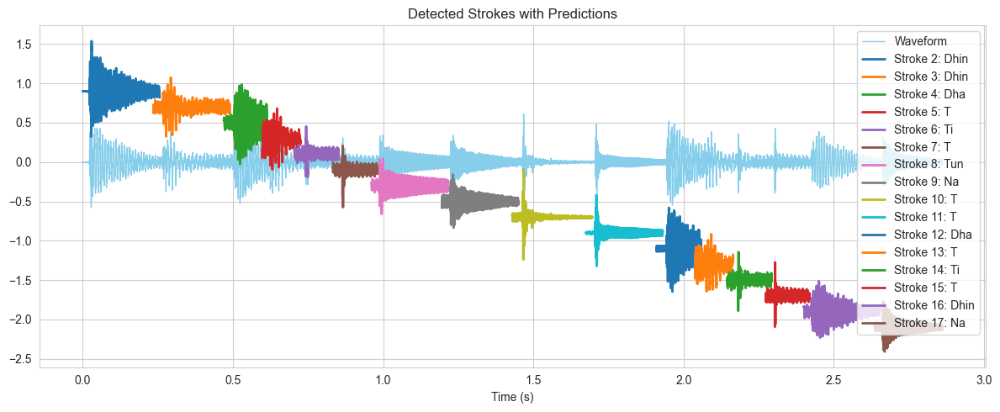

Added onset at 0s manually (initial dB: -33.92)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-51.66 dB).
Stroke 2: Predicted → Dhin (dB: -3.32)
Stroke 3: Predicted → Dhin (dB: -6.08)
Stroke 4: Predicted → Dha (dB: -4.59)
Stroke 5: Predicted → T (dB: -8.02)
Stroke 6: Predicted → Ti (dB: -7.96)
Stroke 7: Predicted → Ti (dB: -6.90)
Stroke 8: Predicted → Tun (dB: -9.02)
Stroke 9: Predicted → Na (dB: -8.57)
Stroke 10: Predicted → Kat (dB: -4.91)
Stroke 11: Predicted → Ta (dB: -5.15)
Stroke 12: Predicted → Dha (dB: -4.43)
Stroke 13: Predicted → T (dB: -7.55)
Stroke 14: Predicted → Ti (dB: -8.17)
Stroke 15: Predicted → Dhin (dB: -6.70)
Stroke 16: Predicted → Dhin (dB: -7.12)
Stroke 17: Predicted → Na (dB: -9.17)


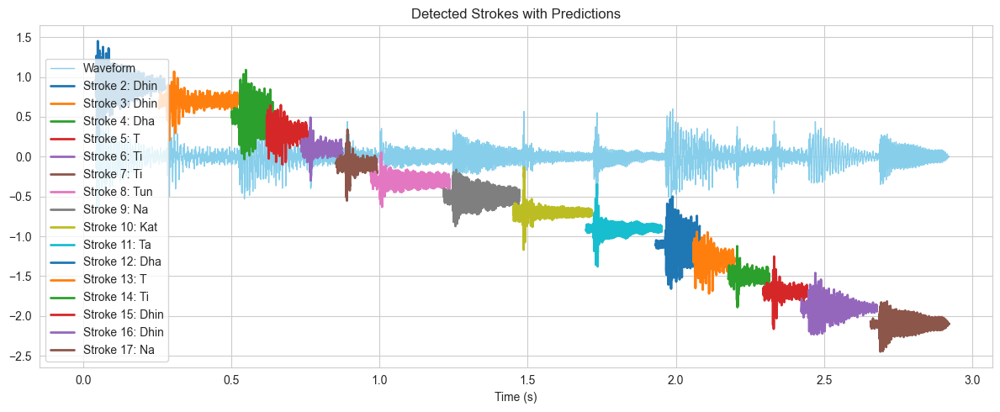

Added onset at 0s manually (initial dB: -61.82)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-50.58 dB).
Stroke 2: Predicted → Dhin (dB: -4.38)
Stroke 3: Predicted → Dhin (dB: -8.32)
Stroke 4: Predicted → Dha (dB: -5.25)
Stroke 5: Predicted → T (dB: -8.08)
Stroke 6: Predicted → Ti (dB: -7.37)
Stroke 7: Predicted → Re (dB: -6.68)
Stroke 8: Predicted → Tun (dB: -5.35)
Stroke 9: Predicted → Na (dB: -9.21)
Stroke 10: Predicted → Kat (dB: -4.54)
Stroke 11: Predicted → Tin (dB: -4.59)
Stroke 12: Predicted → Dha (dB: -5.62)
Stroke 13: Predicted → T (dB: -8.51)
Stroke 14: Predicted → Ti (dB: -7.78)
Stroke 15: Predicted → Re (dB: -6.98)
Stroke 16: Predicted → Dhin (dB: -8.64)
Stroke 17: Predicted → Na (dB: -9.63)


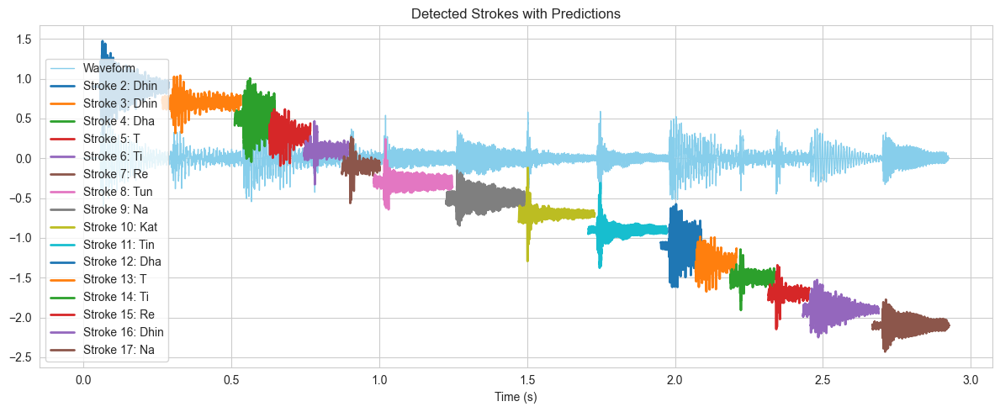

Added onset at 0s manually (initial dB: -1.17)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-50.93 dB).
Stroke 2: Predicted → Dhin (dB: -1.17)
Stroke 3: Predicted → Dhin (dB: -9.26)
Stroke 4: Predicted → Dha (dB: -3.83)
Stroke 5: Predicted → T (dB: -8.54)
Stroke 6: Predicted → Ti (dB: -7.24)
Stroke 7: Predicted → Ti (dB: -7.47)
Stroke 8: Predicted → Tun (dB: -4.23)
Stroke 9: Predicted → Na (dB: -8.21)
Stroke 10: Predicted → Kat (dB: -4.67)
Stroke 11: Predicted → Ta (dB: -5.46)
Stroke 12: Predicted → Dha (dB: -4.04)
Stroke 13: Predicted → Ghe (dB: -8.68)
Stroke 14: Predicted → Ti (dB: -7.51)
Stroke 15: Predicted → Ti (dB: -7.10)
Stroke 16: Predicted → Dhin (dB: -7.99)
Stroke 17: Predicted → Na (dB: -8.81)


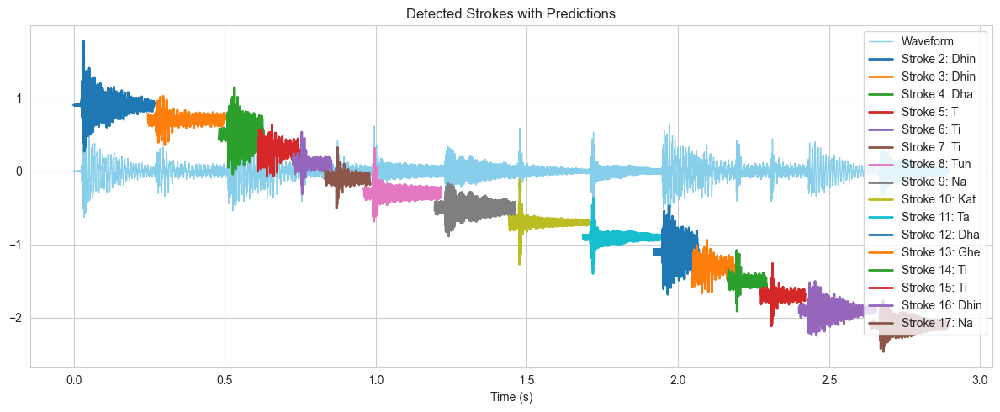

Added onset at 0s manually (initial dB: -51.77)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-51.77 dB).
Stroke 2: Predicted → Dhin (dB: -1.08)
Stroke 3: Predicted → Dhin (dB: -8.77)
Stroke 4: Predicted → Dha (dB: -4.78)
Stroke 5: Predicted → Dha (dB: -7.58)
Stroke 6: Predicted → Ti (dB: -9.38)
Stroke 7: Predicted → Ti (dB: -6.70)
Stroke 8: Predicted → Tun (dB: -5.96)
Stroke 9: Predicted → Na (dB: -9.19)
Stroke 10: Predicted → Kat (dB: -4.68)
Stroke 11: Predicted → Ta (dB: -4.75)
Stroke 12: Predicted → Dha (dB: -4.07)
Stroke 13: Predicted → T (dB: -8.47)
Stroke 14: Predicted → Ti (dB: -7.68)
Stroke 15: Predicted → Ti (dB: -6.56)
Stroke 16: Predicted → Dhin (dB: -8.43)
Stroke 17: Predicted → Na (dB: -9.04)


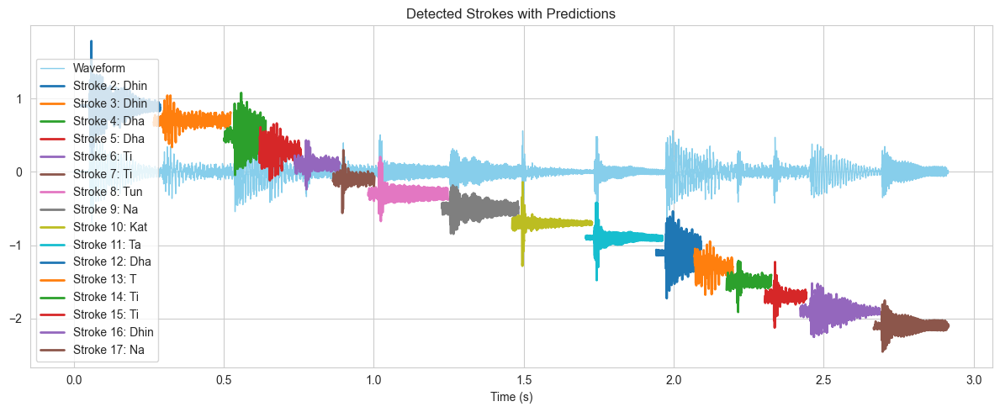

Added onset at 0s manually (initial dB: -59.72)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-49.67 dB).
Stroke 2: Predicted → Dhin (dB: -0.39)
Stroke 3: Predicted → Na (dB: -7.82)
Stroke 4: Predicted → Na (dB: -15.65)
Stroke 5: Predicted → Dhin (dB: -3.07)
Stroke 6: Predicted → Dhin (dB: -8.24)
Stroke 7: Predicted → Na (dB: -7.83)
Stroke 8: Predicted → Tin (dB: -4.25)
Stroke 9: Predicted → Na (dB: -8.50)
Stroke 10: Predicted → Na (dB: -13.95)
Stroke 11: Predicted → Dhin (dB: -2.41)
Stroke 12: Predicted → Dhin (dB: -8.40)
Stroke 13: Predicted → Na (dB: -7.10)


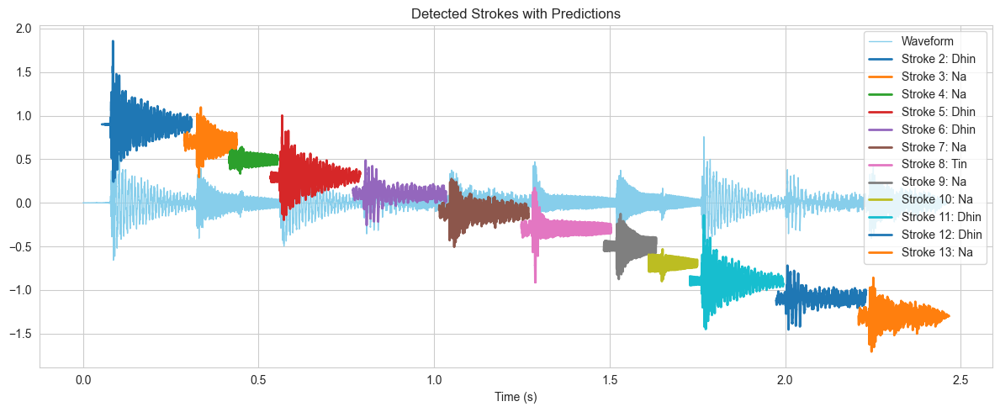

Added onset at 0s manually (initial dB: -61.69)
Detected 15 strokes
Skipping stroke 1: below dB threshold (-54.83 dB).
Stroke 2: Predicted → Dhin (dB: -0.00)
Stroke 3: Predicted → Na (dB: -8.68)
Stroke 4: Predicted → Na (dB: -15.52)
Stroke 5: Predicted → Dhin (dB: -2.62)
Stroke 6: Predicted → Dhin (dB: -8.46)
Stroke 7: Predicted → Na (dB: -7.85)
Stroke 8: Predicted → Na (dB: -13.46)
Stroke 9: Predicted → Tin (dB: -0.49)
Stroke 10: Predicted → Na (dB: -9.06)
Stroke 11: Predicted → Na (dB: -16.25)
Stroke 12: Predicted → Dhin (dB: -1.76)
Stroke 13: Predicted → Dhin (dB: -8.53)
Stroke 14: Predicted → Na (dB: -7.77)
Stroke 15: Predicted → Na (dB: -13.49)


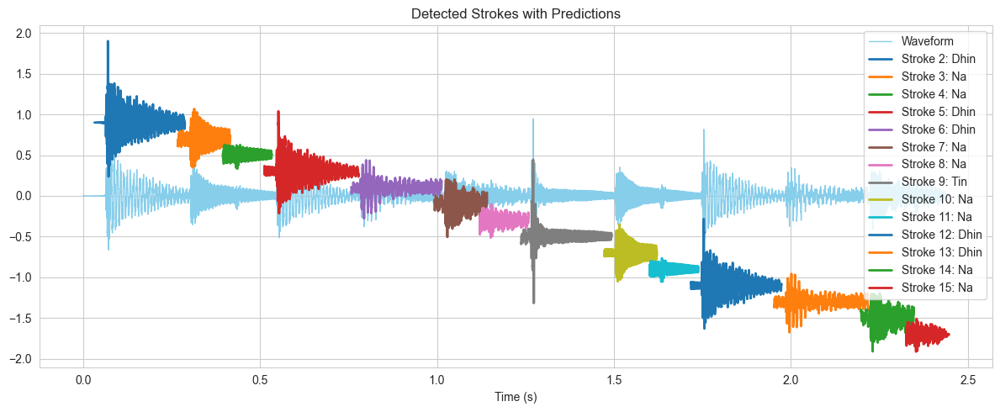

Added onset at 0s manually (initial dB: -60.69)
Detected 15 strokes
Skipping stroke 1: below dB threshold (-55.34 dB).
Stroke 2: Predicted → Dhin (dB: -1.83)
Stroke 3: Predicted → Na (dB: -8.50)
Stroke 4: Predicted → T (dB: -14.33)
Stroke 5: Predicted → Dhin (dB: -4.80)
Stroke 6: Predicted → Dhin (dB: -7.95)
Stroke 7: Predicted → Na (dB: -8.89)
Stroke 8: Predicted → Na (dB: -12.91)
Stroke 9: Predicted → Tin (dB: -1.57)
Stroke 10: Predicted → Na (dB: -8.95)
Stroke 11: Predicted → T (dB: -13.73)
Stroke 12: Predicted → Dhin (dB: -4.24)
Stroke 13: Predicted → Dhin (dB: -7.82)
Stroke 14: Predicted → Na (dB: -9.62)
Stroke 15: Predicted → Na (dB: -13.70)


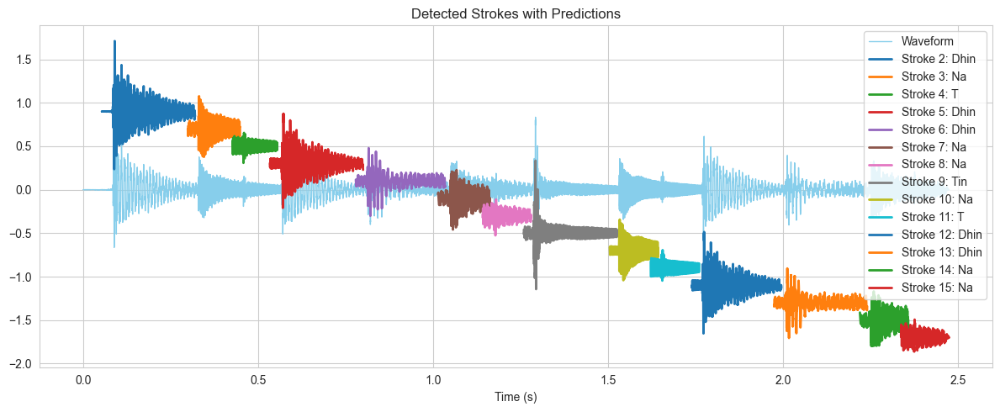

Added onset at 0s manually (initial dB: -57.65)
Detected 15 strokes
Skipping stroke 1: below dB threshold (-55.24 dB).
Stroke 2: Predicted → Dhin (dB: -3.48)
Stroke 3: Predicted → Na (dB: -9.76)
Stroke 4: Predicted → Na (dB: -15.63)
Stroke 5: Predicted → Dhin (dB: -6.41)
Stroke 6: Predicted → Dhin (dB: -8.34)
Stroke 7: Predicted → Na (dB: -9.23)
Stroke 8: Predicted → Na (dB: -15.09)
Stroke 9: Predicted → Tin (dB: -5.10)
Stroke 10: Predicted → Na (dB: -10.06)
Stroke 11: Predicted → T (dB: -15.50)
Stroke 12: Predicted → Dhin (dB: -5.14)
Stroke 13: Predicted → Dhin (dB: -8.57)
Stroke 14: Predicted → Na (dB: -8.45)
Stroke 15: Predicted → Na (dB: -15.82)


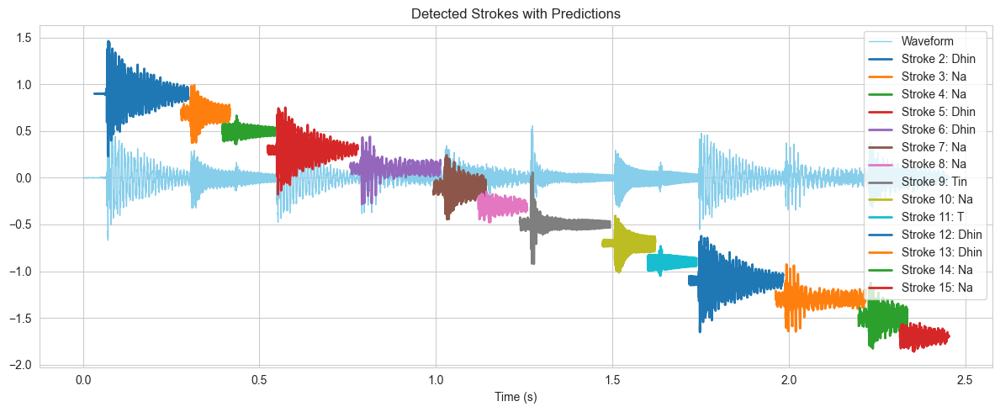

Added onset at 0s manually (initial dB: -58.95)
Detected 15 strokes
Skipping stroke 1: below dB threshold (-53.05 dB).
Stroke 2: Predicted → Dhin (dB: -3.17)
Stroke 3: Predicted → Na (dB: -8.86)
Stroke 4: Predicted → T (dB: -15.42)
Stroke 5: Predicted → Dhin (dB: -5.75)
Stroke 6: Predicted → Dhin (dB: -9.06)
Stroke 7: Predicted → Na (dB: -8.80)
Stroke 8: Predicted → Na (dB: -15.53)
Stroke 9: Predicted → Tin (dB: -4.75)
Stroke 10: Predicted → Na (dB: -9.67)
Stroke 11: Predicted → T (dB: -14.82)
Stroke 12: Predicted → Dhin (dB: -5.55)
Stroke 13: Predicted → Dhin (dB: -8.66)
Stroke 14: Predicted → Na (dB: -8.24)
Stroke 15: Predicted → Na (dB: -15.10)


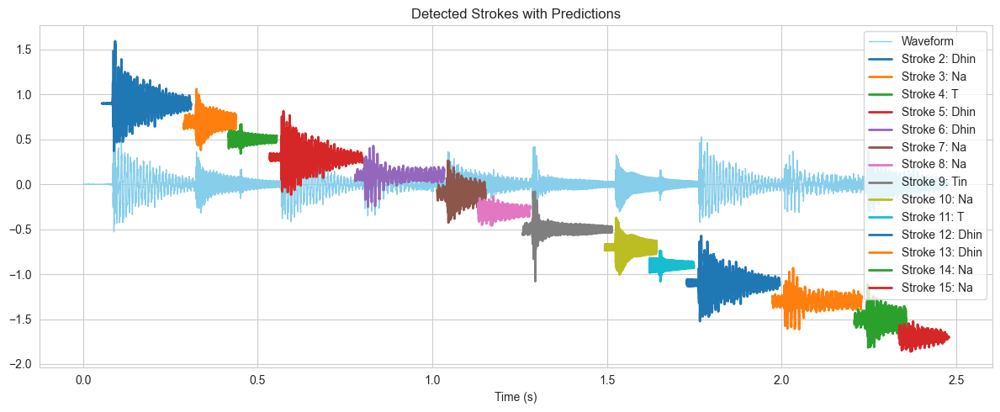

Added onset at 0s manually (initial dB: -61.05)
Detected 15 strokes
Skipping stroke 1: below dB threshold (-54.55 dB).
Stroke 2: Predicted → Dhin (dB: -3.80)
Stroke 3: Predicted → Na (dB: -9.52)
Stroke 4: Predicted → Na (dB: -15.34)
Stroke 5: Predicted → Dhin (dB: -6.43)
Stroke 6: Predicted → Dhin (dB: -8.86)
Stroke 7: Predicted → Na (dB: -7.82)
Stroke 8: Predicted → Na (dB: -16.08)
Stroke 9: Predicted → Tin (dB: -2.61)
Stroke 10: Predicted → Na (dB: -10.56)
Stroke 11: Predicted → T (dB: -15.51)
Stroke 12: Predicted → Dhin (dB: -5.95)
Stroke 13: Predicted → Dhin (dB: -8.03)
Stroke 14: Predicted → Na (dB: -8.21)
Stroke 15: Predicted → Na (dB: -16.17)


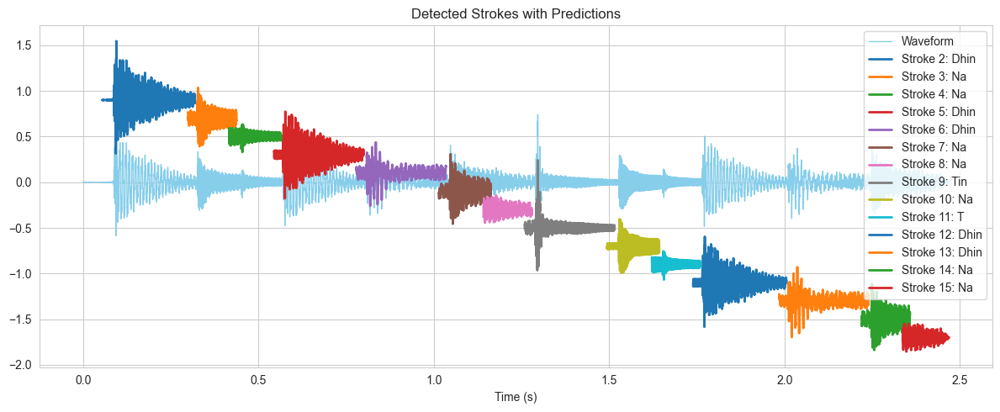

Added onset at 0s manually (initial dB: -60.29)
Detected 14 strokes
Skipping stroke 1: below dB threshold (-57.68 dB).
Stroke 2: Predicted → Dhin (dB: -3.29)
Stroke 3: Predicted → Na (dB: -9.28)
Stroke 4: Predicted → T (dB: -12.05)
Stroke 5: Predicted → Dhin (dB: -4.53)
Stroke 6: Predicted → Dhin (dB: -6.88)
Stroke 7: Predicted → Na (dB: -8.27)
Stroke 8: Predicted → Tin (dB: -4.30)
Stroke 9: Predicted → Na (dB: -9.03)
Stroke 10: Predicted → T (dB: -11.38)
Stroke 11: Predicted → Dhin (dB: -4.48)
Stroke 12: Predicted → Dhin (dB: -5.74)
Stroke 13: Predicted → Na (dB: -8.56)
Stroke 14: Predicted → Dha (dB: -11.15)


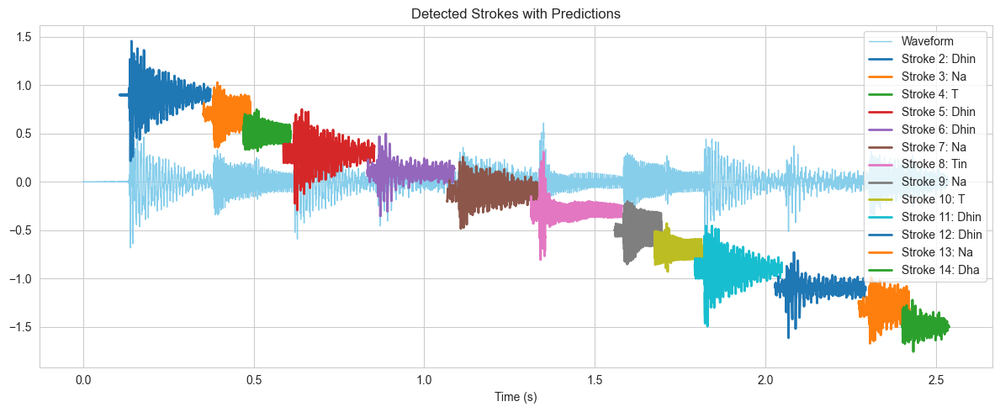

Added onset at 0s manually (initial dB: -58.63)
Detected 14 strokes
Skipping stroke 1: below dB threshold (-53.85 dB).
Stroke 2: Predicted → Dhin (dB: -4.30)
Stroke 3: Predicted → Na (dB: -9.10)
Stroke 4: Predicted → T (dB: -15.19)
Stroke 5: Predicted → Dhin (dB: -5.62)
Stroke 6: Predicted → Dhin (dB: -5.84)
Stroke 7: Predicted → Na (dB: -8.59)
Stroke 8: Predicted → Tin (dB: -1.41)
Stroke 9: Predicted → Na (dB: -9.34)
Stroke 10: Predicted → T (dB: -14.88)
Stroke 11: Predicted → Dhin (dB: -5.84)
Stroke 12: Predicted → Dhin (dB: -5.51)
Stroke 13: Predicted → Dha (dB: -8.04)
Stroke 14: Predicted → T (dB: -17.13)


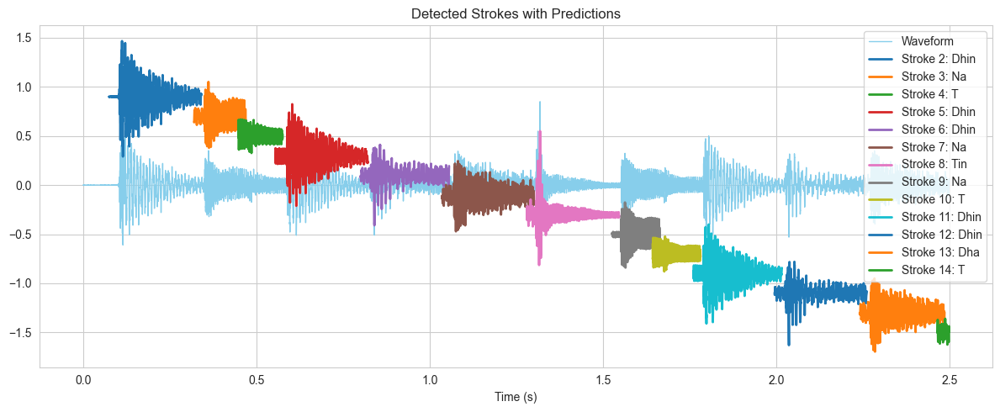

Added onset at 0s manually (initial dB: -54.81)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-53.68 dB).
Stroke 2: Predicted → Dhin (dB: -1.12)
Stroke 3: Predicted → Na (dB: -9.18)
Stroke 4: Predicted → T (dB: -13.76)
Stroke 5: Predicted → Dhin (dB: -4.88)
Stroke 6: Predicted → Dhin (dB: -8.60)
Stroke 7: Predicted → Na (dB: -8.44)
Stroke 8: Predicted → Tin (dB: -3.40)
Stroke 9: Predicted → Na (dB: -8.69)
Stroke 10: Predicted → Na (dB: -13.70)
Stroke 11: Predicted → Dhin (dB: -2.40)
Stroke 12: Predicted → Dhin (dB: -8.69)
Stroke 13: Predicted → Na (dB: -8.96)


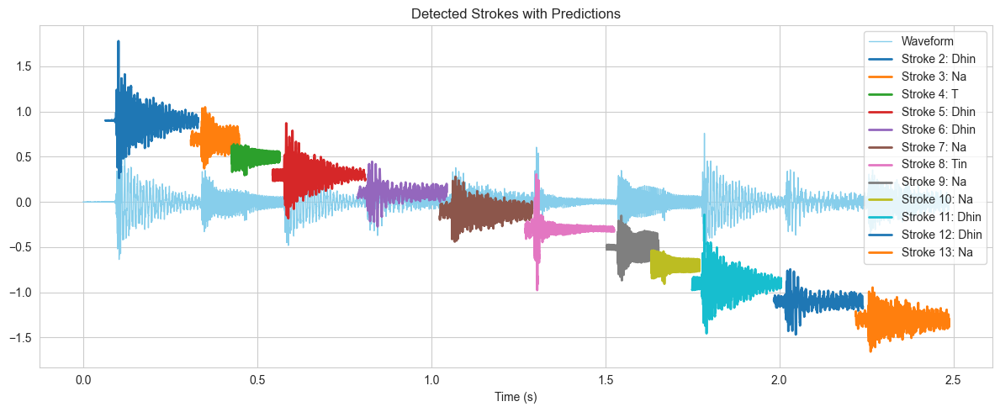

Added onset at 0s manually (initial dB: -59.47)
Detected 15 strokes
Skipping stroke 1: below dB threshold (-57.03 dB).
Stroke 2: Predicted → Dhin (dB: -1.05)
Stroke 3: Predicted → Na (dB: -8.89)
Stroke 4: Predicted → T (dB: -12.68)
Stroke 5: Predicted → Dhin (dB: -3.70)
Stroke 6: Predicted → Dhin (dB: -9.13)
Stroke 7: Predicted → Na (dB: -7.50)
Stroke 8: Predicted → Na (dB: -14.28)
Stroke 9: Predicted → Tin (dB: -0.71)
Stroke 10: Predicted → Na (dB: -8.44)
Stroke 11: Predicted → T (dB: -11.96)
Stroke 12: Predicted → Dhin (dB: -2.86)
Stroke 13: Predicted → Dhin (dB: -9.37)
Stroke 14: Predicted → Na (dB: -9.38)
Stroke 15: Predicted → Na (dB: -12.36)


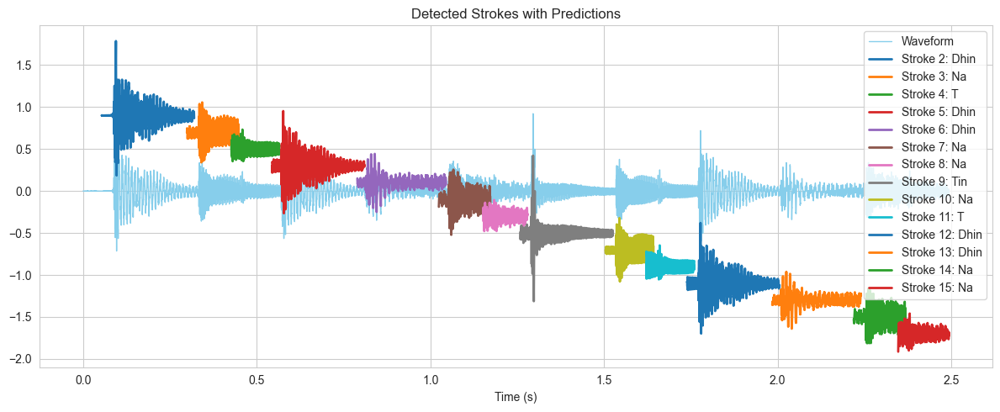

Added onset at 0s manually (initial dB: -58.47)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-49.85 dB).
Stroke 2: Predicted → Tin (dB: -0.90)
Stroke 3: Predicted → Tin (dB: -2.87)
Stroke 4: Predicted → Na (dB: -11.39)
Stroke 5: Predicted → Dhin (dB: -2.60)
Stroke 6: Predicted → Na (dB: -10.02)
Stroke 7: Predicted → Dhin (dB: -2.40)
Stroke 8: Predicted → Na (dB: -10.84)
Stroke 9: Predicted → T (dB: -16.64)


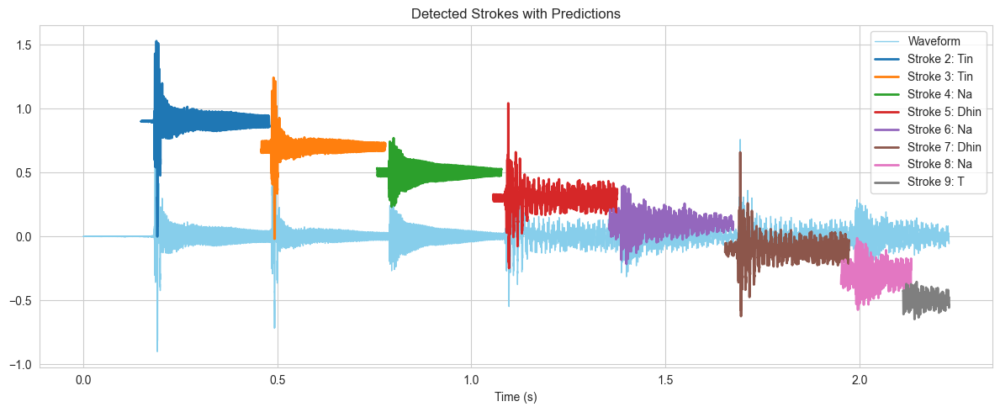

Added onset at 0s manually (initial dB: -57.71)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-47.83 dB).
Stroke 2: Predicted → Tin (dB: 0.00)
Stroke 3: Predicted → Tin (dB: -0.35)
Stroke 4: Predicted → Na (dB: -10.77)
Stroke 5: Predicted → Dhin (dB: -3.35)
Stroke 6: Predicted → Na (dB: -9.81)
Stroke 7: Predicted → T (dB: -14.08)
Stroke 8: Predicted → Dhin (dB: -3.89)
Stroke 9: Predicted → Na (dB: -10.19)


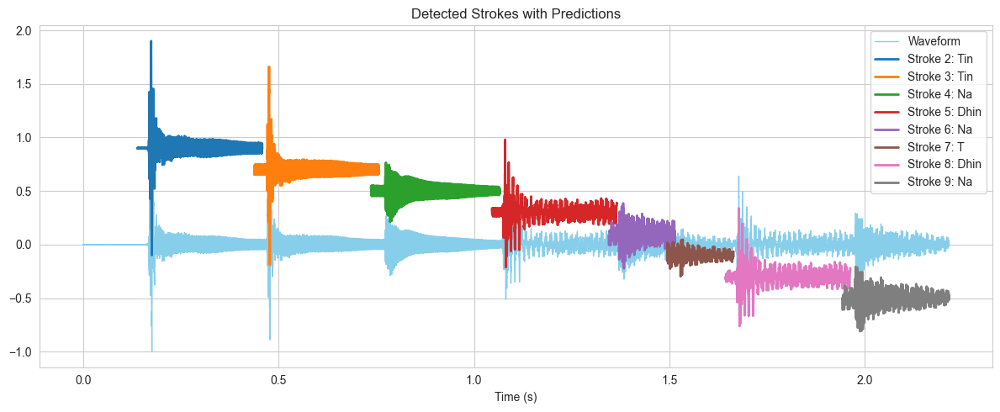

Added onset at 0s manually (initial dB: -60.38)
Detected 10 strokes
Skipping stroke 1: below dB threshold (-45.93 dB).
Stroke 2: Predicted → Tin (dB: -0.00)
Stroke 3: Predicted → Tin (dB: -0.00)
Stroke 4: Predicted → Na (dB: -11.59)
Stroke 5: Predicted → Dhin (dB: -2.00)
Stroke 6: Predicted → Na (dB: -9.40)
Stroke 7: Predicted → Na (dB: -16.39)
Stroke 8: Predicted → Dhin (dB: -3.18)
Stroke 9: Predicted → Na (dB: -11.36)
Stroke 10: Predicted → T (dB: -14.30)


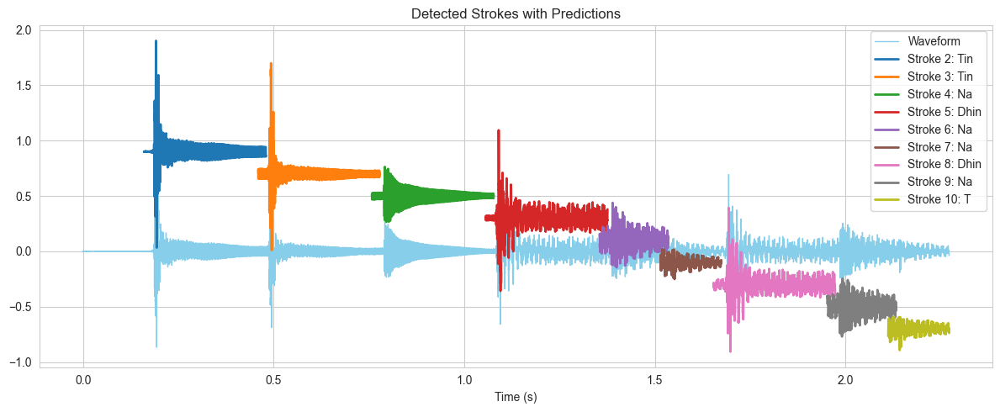

Added onset at 0s manually (initial dB: -57.38)
Detected 10 strokes
Skipping stroke 1: below dB threshold (-51.64 dB).
Stroke 2: Predicted → Tin (dB: -2.37)
Stroke 3: Predicted → Tin (dB: -3.32)
Stroke 4: Predicted → Na (dB: -11.43)
Stroke 5: Predicted → Dhin (dB: -3.37)
Stroke 6: Predicted → Na (dB: -10.27)
Stroke 7: Predicted → T (dB: -13.22)
Stroke 8: Predicted → Dhin (dB: -3.37)
Stroke 9: Predicted → Na (dB: -9.69)
Stroke 10: Predicted → T (dB: -14.77)


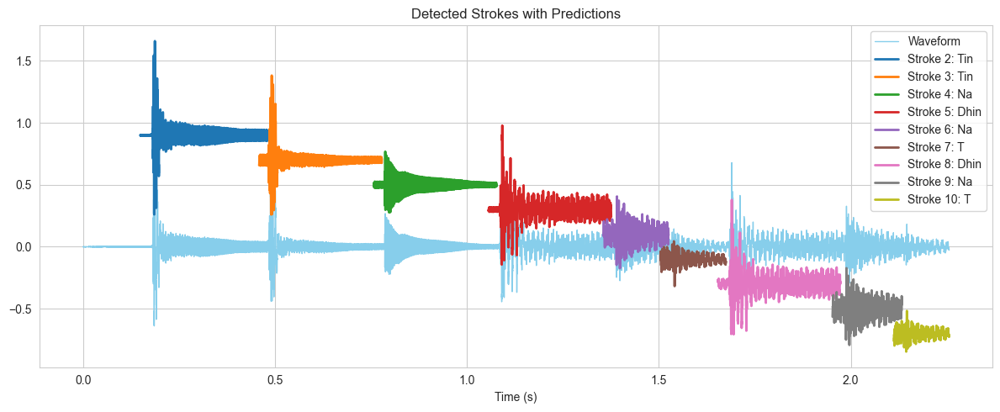

Added onset at 0s manually (initial dB: -5.93)
Detected 10 strokes
Skipping stroke 1: below dB threshold (-46.74 dB).
Stroke 2: Predicted → Tin (dB: -1.79)
Stroke 3: Predicted → Tin (dB: -3.78)
Stroke 4: Predicted → Na (dB: -12.00)
Stroke 5: Predicted → Dhin (dB: -5.95)
Stroke 6: Predicted → Na (dB: -10.84)
Stroke 7: Predicted → T (dB: -14.06)
Stroke 8: Predicted → Dhin (dB: -7.51)
Stroke 9: Predicted → Na (dB: -10.86)
Stroke 10: Predicted → T (dB: -15.80)


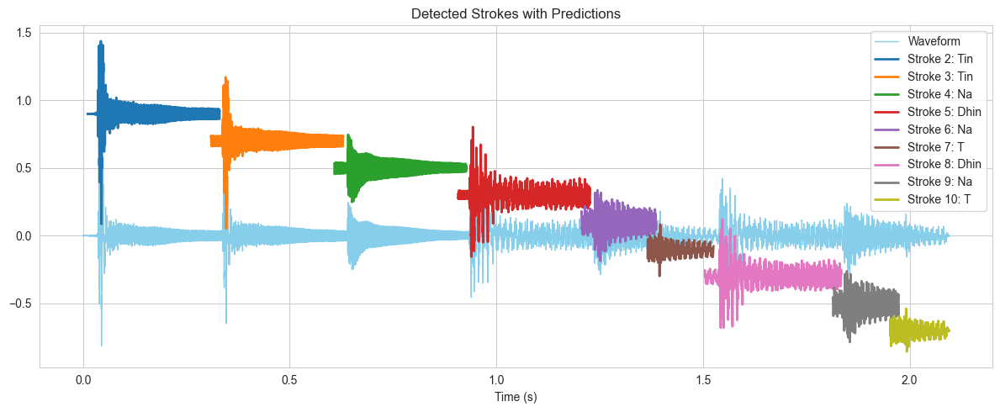

Added onset at 0s manually (initial dB: -0.19)
Detected 10 strokes
Skipping stroke 1: below dB threshold (-45.43 dB).
Stroke 2: Predicted → Tin (dB: -0.19)
Stroke 3: Predicted → Tin (dB: -2.09)
Stroke 4: Predicted → Na (dB: -11.87)
Stroke 5: Predicted → Dhin (dB: -4.51)
Stroke 6: Predicted → Na (dB: -10.81)
Stroke 7: Predicted → T (dB: -16.76)
Stroke 8: Predicted → Dhin (dB: -4.54)
Stroke 9: Predicted → Na (dB: -10.17)
Stroke 10: Predicted → T (dB: -15.49)


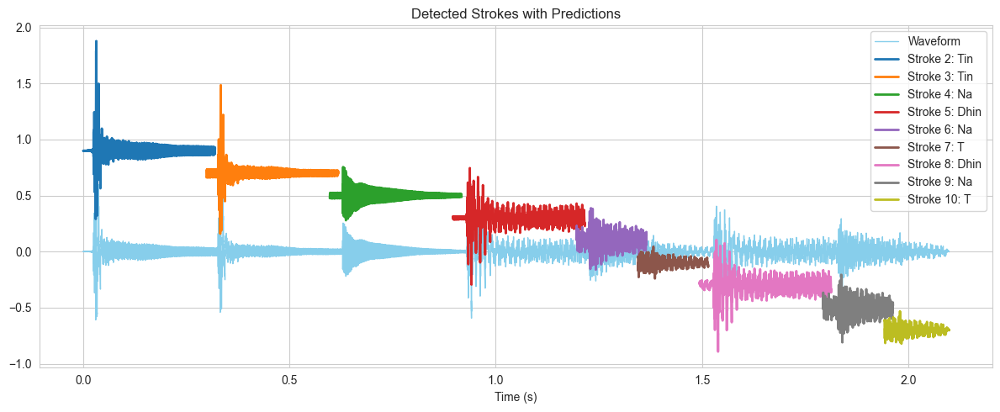

Added onset at 0s manually (initial dB: -1.79)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-49.14 dB).
Stroke 2: Predicted → Tin (dB: -1.79)
Stroke 3: Predicted → Tin (dB: -3.63)
Stroke 4: Predicted → Na (dB: -11.57)
Stroke 5: Predicted → Dhin (dB: -3.19)
Stroke 6: Predicted → Na (dB: -10.88)
Stroke 7: Predicted → T (dB: -15.43)
Stroke 8: Predicted → Dhin (dB: -3.18)
Stroke 9: Predicted → Na (dB: -10.98)


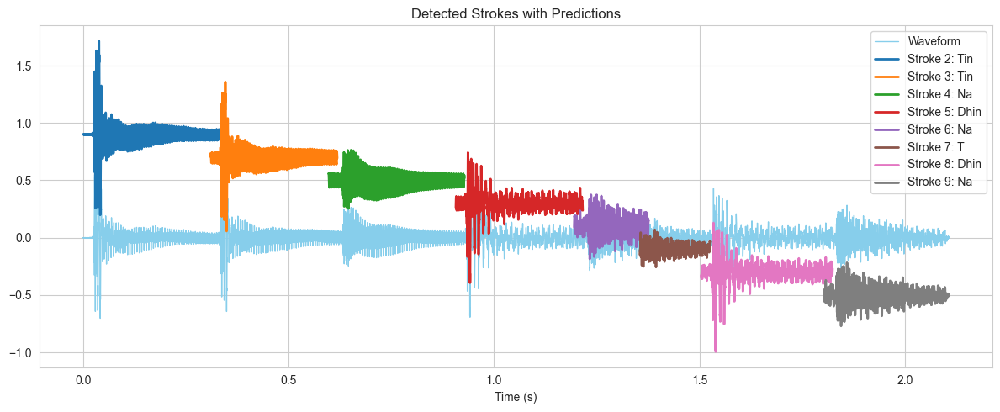

Added onset at 0s manually (initial dB: -0.13)
Detected 8 strokes
Skipping stroke 1: below dB threshold (-56.45 dB).
Stroke 2: Predicted → Tin (dB: -0.13)
Stroke 3: Predicted → Tin (dB: -1.35)
Stroke 4: Predicted → Na (dB: -11.81)
Stroke 5: Predicted → Dhin (dB: -3.01)
Stroke 6: Predicted → Na (dB: -10.17)
Stroke 7: Predicted → Dhin (dB: -2.74)
Stroke 8: Predicted → Na (dB: -11.08)


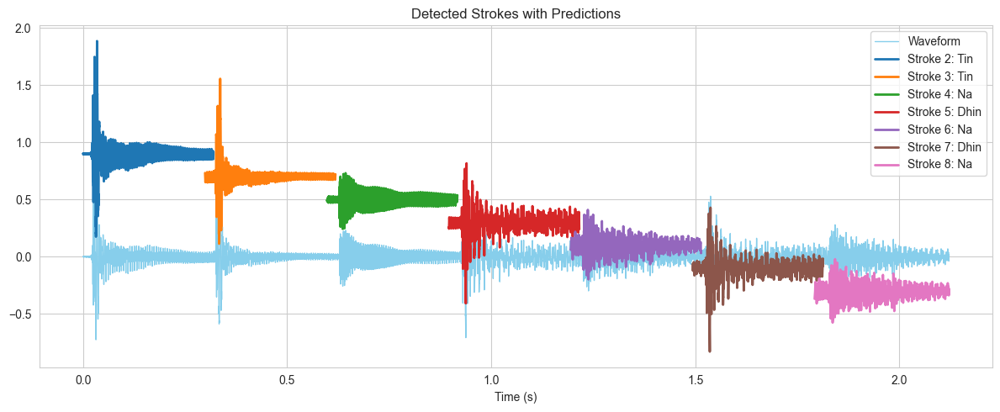

Added onset at 0s manually (initial dB: -53.99)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-53.99 dB).
Stroke 2: Predicted → Tin (dB: -1.43)
Stroke 3: Predicted → Tin (dB: -2.64)
Stroke 4: Predicted → Na (dB: -9.94)
Stroke 5: Predicted → Dhin (dB: -4.51)
Stroke 6: Predicted → Na (dB: -9.39)
Stroke 7: Predicted → T (dB: -14.47)
Stroke 8: Predicted → Dhin (dB: -5.13)
Stroke 9: Predicted → Na (dB: -10.07)


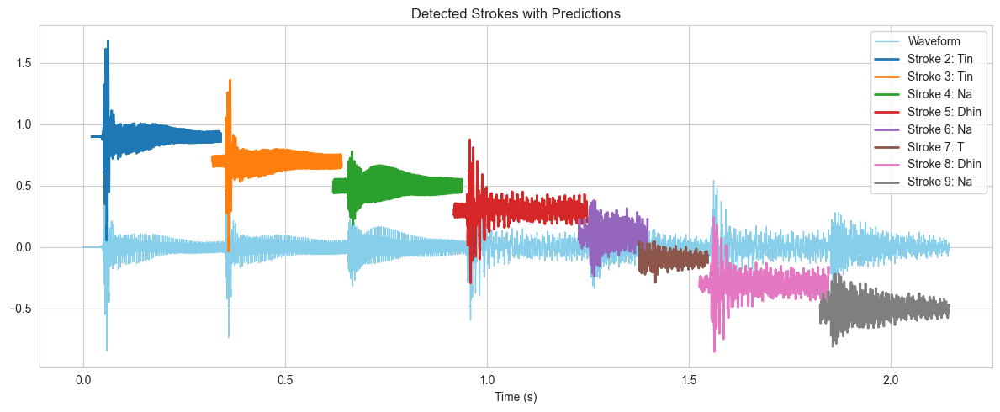

Added onset at 0s manually (initial dB: 0.00)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-53.26 dB).
Stroke 2: Predicted → Tin (dB: 0.00)
Stroke 3: Predicted → Tin (dB: -0.00)
Stroke 4: Predicted → Na (dB: -10.03)
Stroke 5: Predicted → Dhin (dB: -4.22)
Stroke 6: Predicted → Na (dB: -10.55)
Stroke 7: Predicted → Dhin (dB: -5.58)
Stroke 8: Predicted → Na (dB: -11.96)
Stroke 9: Predicted → T (dB: -18.02)


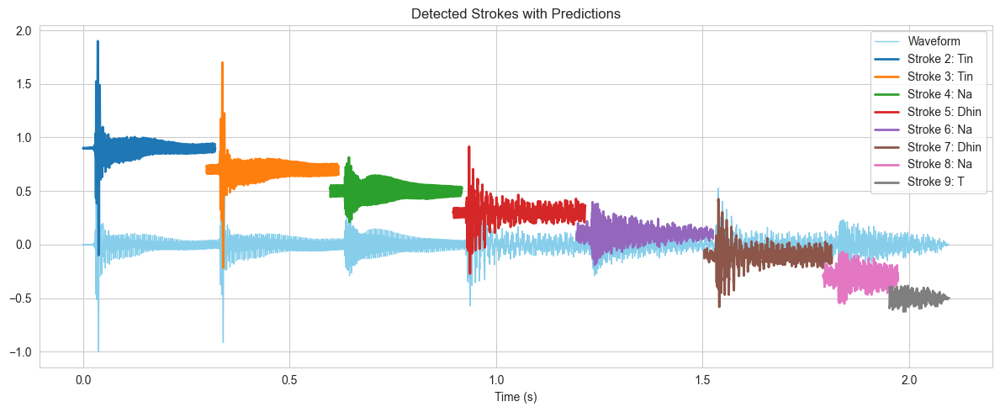

Added onset at 0s manually (initial dB: -56.75)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-55.40 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: 0.00)
Stroke 4: Predicted → Dhin (dB: 0.00)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: 0.00)
Stroke 7: Predicted → Dhin (dB: -0.24)
Stroke 8: Predicted → Dhin (dB: 0.00)
Stroke 9: Predicted → Dha (dB: 0.00)
Stroke 10: Predicted → Dha (dB: 0.00)
Stroke 11: Predicted → Tin (dB: 0.00)
Stroke 12: Predicted → Tin (dB: 0.00)
Stroke 13: Predicted → Ta (dB: -0.01)
Stroke 14: Predicted → Ta (dB: 0.00)
Stroke 15: Predicted → Dhin (dB: -0.00)
Stroke 16: Predicted → Dhin (dB: 0.00)
Stroke 17: Predicted → Dha (dB: 0.00)
Stroke 18: Predicted → T (dB: -7.68)


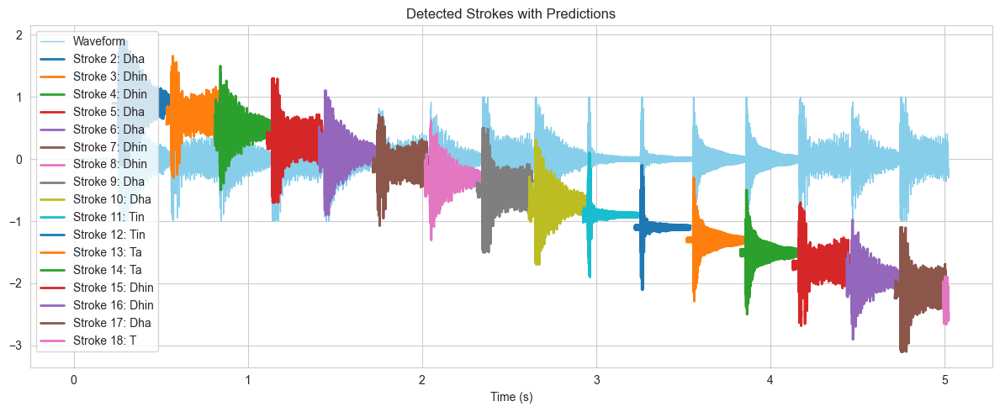

Added onset at 0s manually (initial dB: -54.34)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-54.34 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -4.39)
Stroke 4: Predicted → Dhin (dB: -2.40)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: -0.01)
Stroke 7: Predicted → Dhin (dB: -4.22)
Stroke 8: Predicted → Dhin (dB: -2.32)
Stroke 9: Predicted → Dha (dB: 0.00)
Stroke 10: Predicted → Dha (dB: 0.00)
Stroke 11: Predicted → Tin (dB: -0.46)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.33)
Stroke 14: Predicted → Ta (dB: -0.13)
Stroke 15: Predicted → Dhin (dB: -3.81)
Stroke 16: Predicted → Dhin (dB: -2.18)
Stroke 17: Predicted → Dha (dB: 0.00)


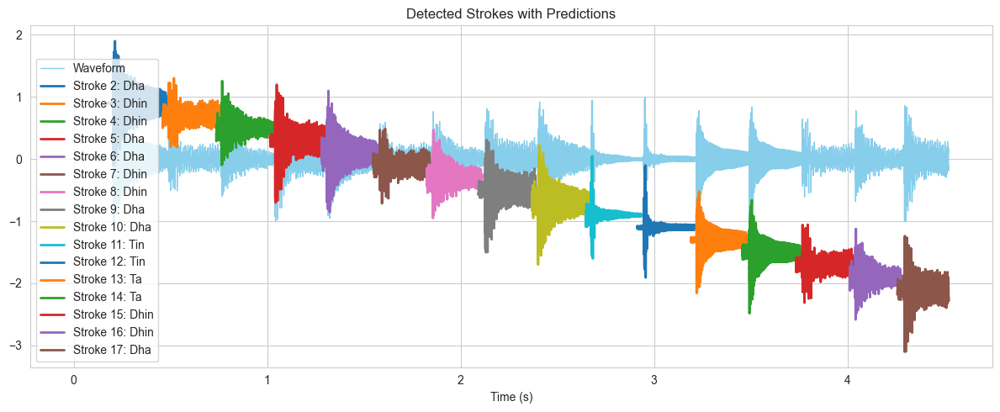

Added onset at 0s manually (initial dB: -57.08)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-54.41 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -1.96)
Stroke 4: Predicted → Dhin (dB: -3.27)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: -0.05)
Stroke 7: Predicted → Dhin (dB: -0.98)
Stroke 8: Predicted → Dhin (dB: -3.12)
Stroke 9: Predicted → Dha (dB: 0.00)
Stroke 10: Predicted → Dha (dB: -0.19)
Stroke 11: Predicted → Tin (dB: -0.60)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.29)
Stroke 14: Predicted → Ta (dB: -0.91)
Stroke 15: Predicted → Dhin (dB: -0.76)
Stroke 16: Predicted → Dhin (dB: -2.65)
Stroke 17: Predicted → Dha (dB: 0.00)
Stroke 18: Predicted → T (dB: -10.96)


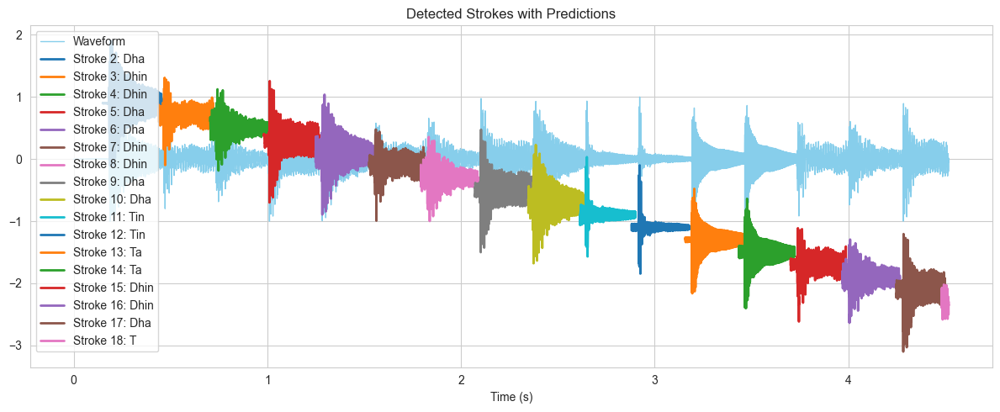

Added onset at 0s manually (initial dB: -58.05)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-55.66 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -3.52)
Stroke 4: Predicted → Dhin (dB: -1.26)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: -0.53)
Stroke 7: Predicted → Dhin (dB: -2.70)
Stroke 8: Predicted → Dhin (dB: -0.81)
Stroke 9: Predicted → Dha (dB: 0.00)
Stroke 10: Predicted → Dha (dB: -0.53)
Stroke 11: Predicted → Tin (dB: -0.93)
Stroke 12: Predicted → Tin (dB: -0.26)
Stroke 13: Predicted → Ta (dB: -1.49)
Stroke 14: Predicted → Ta (dB: -1.14)
Stroke 15: Predicted → Dhin (dB: -3.43)
Stroke 16: Predicted → Dhin (dB: -0.68)
Stroke 17: Predicted → Dha (dB: 0.00)
Stroke 18: Predicted → T (dB: -10.49)


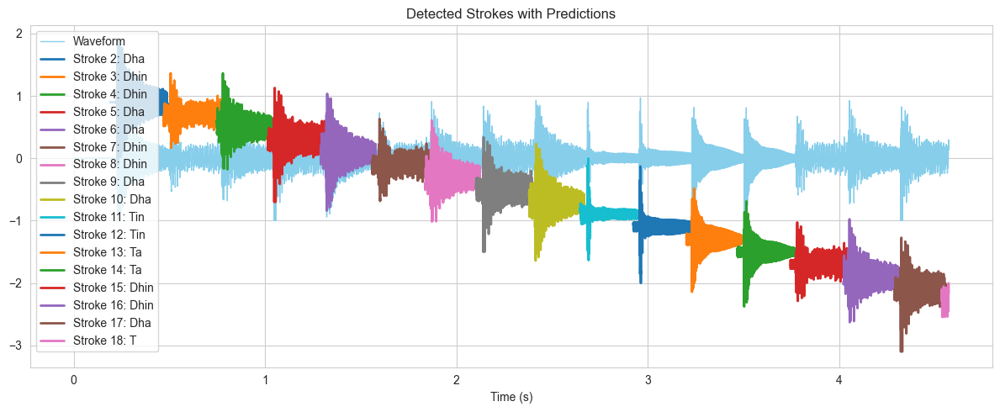

Added onset at 0s manually (initial dB: -57.30)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-50.39 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -3.37)
Stroke 4: Predicted → Dhin (dB: -0.92)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: -1.47)
Stroke 7: Predicted → Dhin (dB: -2.93)
Stroke 8: Predicted → Dhin (dB: -0.65)
Stroke 9: Predicted → Dha (dB: 0.00)
Stroke 10: Predicted → Dha (dB: -1.37)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.57)
Stroke 14: Predicted → Ta (dB: -1.35)
Stroke 15: Predicted → Dhin (dB: -2.17)
Stroke 16: Predicted → Dhin (dB: -0.55)
Stroke 17: Predicted → Dha (dB: 0.00)


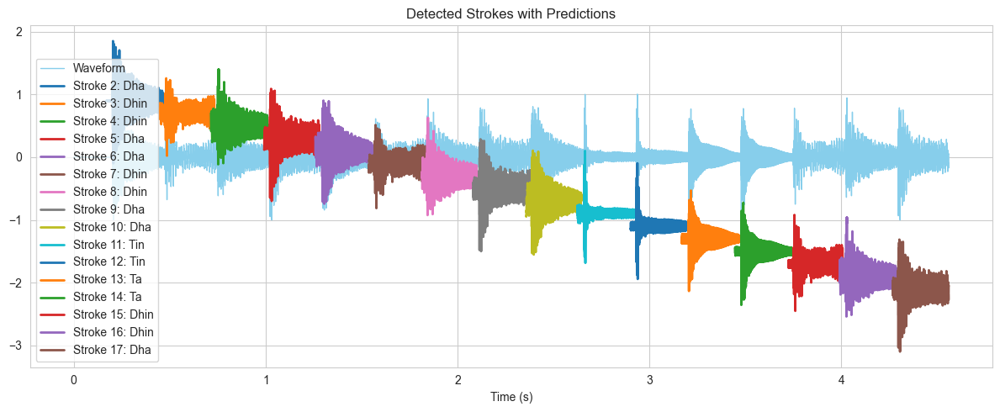

Added onset at 0s manually (initial dB: -48.45)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-47.45 dB).
Stroke 2: Predicted → Dha (dB: -0.00)
Stroke 3: Predicted → Dhin (dB: -2.01)
Stroke 4: Predicted → Dhin (dB: -1.97)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: -0.41)
Stroke 7: Predicted → Dhin (dB: -1.83)
Stroke 8: Predicted → Dhin (dB: -2.10)
Stroke 9: Predicted → Dha (dB: -0.24)
Stroke 10: Predicted → Dha (dB: -0.12)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.24)
Stroke 14: Predicted → Ta (dB: -0.35)
Stroke 15: Predicted → Dhin (dB: -0.02)
Stroke 16: Predicted → Dhin (dB: -1.97)
Stroke 17: Predicted → Dha (dB: -0.21)
Stroke 18: Predicted → T (dB: -11.67)


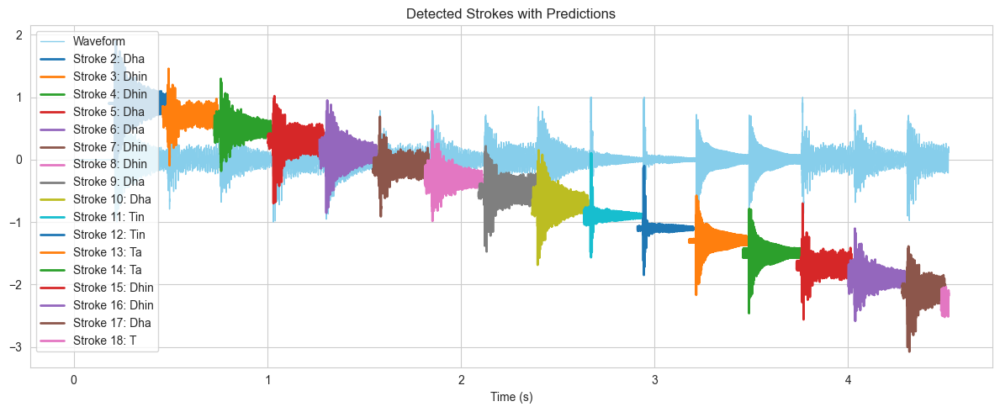

Added onset at 0s manually (initial dB: -56.59)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-51.76 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -3.62)
Stroke 4: Predicted → Dhin (dB: -3.61)
Stroke 5: Predicted → Dha (dB: -0.58)
Stroke 6: Predicted → Dha (dB: -0.61)
Stroke 7: Predicted → Dhin (dB: -2.99)
Stroke 8: Predicted → Dhin (dB: -3.65)
Stroke 9: Predicted → Dha (dB: -0.61)
Stroke 10: Predicted → Dha (dB: -0.81)
Stroke 11: Predicted → Tin (dB: -0.34)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.84)
Stroke 14: Predicted → Ta (dB: -0.93)
Stroke 15: Predicted → Dhin (dB: -2.72)
Stroke 16: Predicted → Dhin (dB: -3.21)
Stroke 17: Predicted → Dha (dB: -0.50)
Stroke 18: Predicted → T (dB: -11.82)


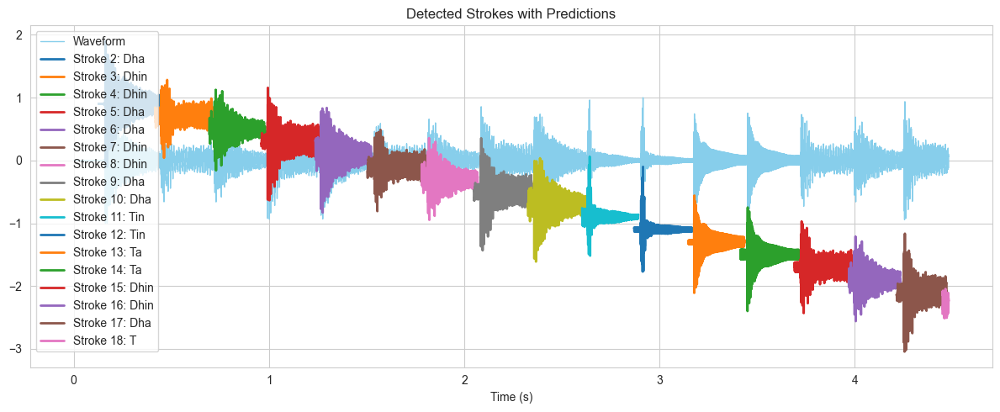

Added onset at 0s manually (initial dB: -58.85)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-50.69 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -4.20)
Stroke 4: Predicted → Dhin (dB: -3.56)
Stroke 5: Predicted → Dha (dB: 0.00)
Stroke 6: Predicted → Dha (dB: -0.46)
Stroke 7: Predicted → Dhin (dB: -4.03)
Stroke 8: Predicted → Dhin (dB: -3.49)
Stroke 9: Predicted → Na (dB: -0.00)
Stroke 10: Predicted → Dha (dB: -0.56)
Stroke 11: Predicted → Tin (dB: -0.58)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.32)
Stroke 14: Predicted → Ta (dB: -1.18)
Stroke 15: Predicted → Dhin (dB: -3.39)
Stroke 16: Predicted → Dhin (dB: -3.03)
Stroke 17: Predicted → Dha (dB: 0.00)
Stroke 18: Predicted → T (dB: -11.63)


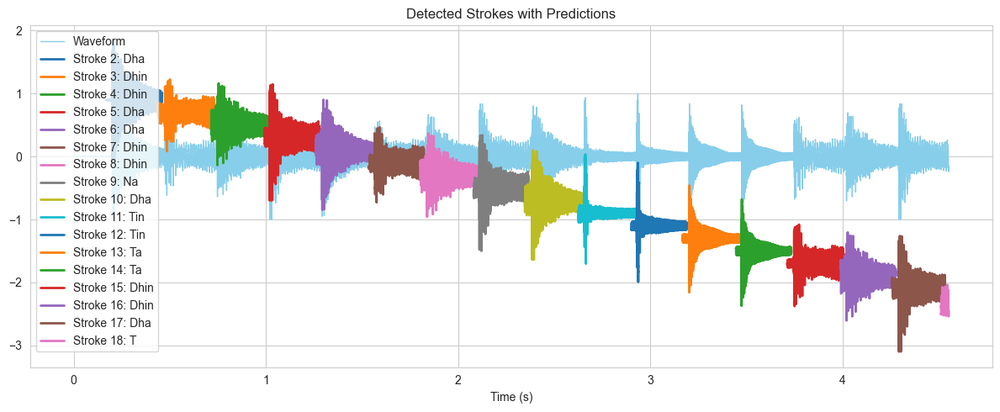

Added onset at 0s manually (initial dB: -57.79)
Detected 17 strokes
Skipping stroke 1: below dB threshold (-50.72 dB).
Stroke 2: Predicted → Na (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -2.84)
Stroke 4: Predicted → Dhin (dB: -3.29)
Stroke 5: Predicted → Dha (dB: -0.39)
Stroke 6: Predicted → Dha (dB: -0.67)
Stroke 7: Predicted → Dhin (dB: -2.46)
Stroke 8: Predicted → Dhin (dB: -3.11)
Stroke 9: Predicted → Dha (dB: -0.49)
Stroke 10: Predicted → Dha (dB: -0.49)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -1.57)
Stroke 14: Predicted → Ta (dB: -1.08)
Stroke 15: Predicted → Dhin (dB: -2.40)
Stroke 16: Predicted → Dhin (dB: -2.97)
Stroke 17: Predicted → Dha (dB: -0.60)


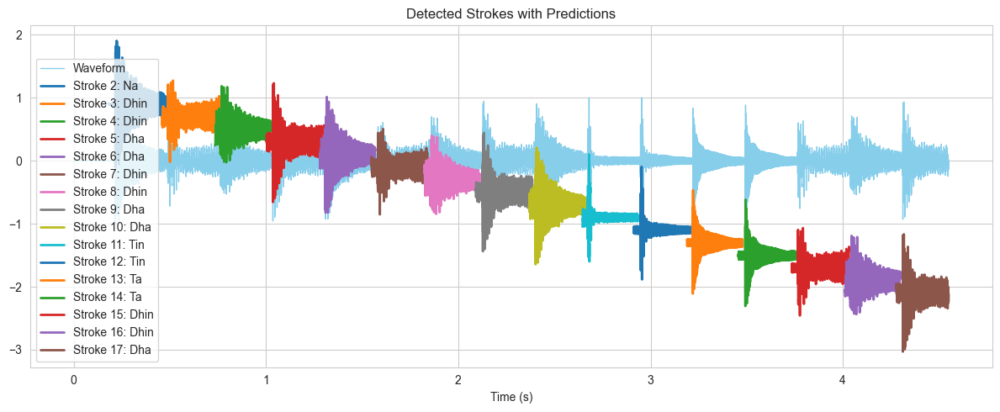

Added onset at 0s manually (initial dB: -60.21)
Detected 18 strokes
Skipping stroke 1: below dB threshold (-49.65 dB).
Stroke 2: Predicted → Dha (dB: 0.00)
Stroke 3: Predicted → Dhin (dB: -0.89)
Stroke 4: Predicted → Dhin (dB: -2.64)
Stroke 5: Predicted → Dha (dB: -0.31)
Stroke 6: Predicted → Dha (dB: -0.33)
Stroke 7: Predicted → Dhin (dB: -0.71)
Stroke 8: Predicted → Dhin (dB: -2.30)
Stroke 9: Predicted → Dha (dB: -0.22)
Stroke 10: Predicted → Dha (dB: -0.41)
Stroke 11: Predicted → Tin (dB: -0.00)
Stroke 12: Predicted → Tin (dB: -0.00)
Stroke 13: Predicted → Ta (dB: -2.27)
Stroke 14: Predicted → Ta (dB: -0.16)
Stroke 15: Predicted → Dhin (dB: -0.45)
Stroke 16: Predicted → Dhin (dB: -1.92)
Stroke 17: Predicted → Dha (dB: -0.23)
Stroke 18: Predicted → T (dB: -9.70)


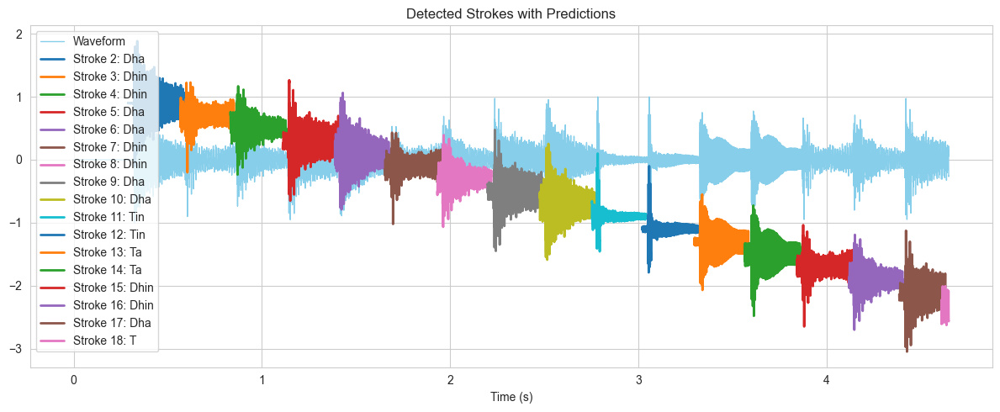

CSV saved at: tabla_predictions_kaggle_unlabelled_combined.csv


In [39]:
import os
import csv

# Path to the folder containing the .wav files
folder_path = "DataSet/Kaggle_Unlabelled"

# Get the first 80 .wav files (sorted alphabetically)
file_list = sorted([f for f in os.listdir(folder_path) if f.endswith(".wav")])[:80]

# Output CSV path
csv_output_path = "tabla_predictions_kaggle_unlabelled_combined.csv"

# Create or overwrite the CSV file
with open(csv_output_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Filename', 'Stroke_Index', 'Bol', 'Duration'])

    # Loop through each file
    for file_name in file_list:
        file_path = os.path.join(folder_path, file_name)

        # Predict the bols and durations using your model
        predicted_bols, durations = predict_tabla_bols(file_path=file_path, model=model,adjust_length_fn=Adjust_Length,
    target_length=78592)

        # Write each (bol, duration) with its index into the CSV
        for idx, (bol, dur) in enumerate(zip(predicted_bols, durations)):
            writer.writerow([file_name, idx, bol, round(float(dur), 5)])

print(f"CSV saved at: {csv_output_path}")

Added onset at 0s manually (initial dB: -60.29)
Detected 14 strokes
Skipping stroke 1: below dB threshold (-57.68 dB).
Stroke 2: Predicted → Dha (dB: -3.29)
Stroke 3: Predicted → Na (dB: -9.28)
Stroke 4: Predicted → T (dB: -12.05)
Stroke 5: Predicted → Dhin (dB: -4.53)
Stroke 6: Predicted → Dhin (dB: -6.88)
Stroke 7: Predicted → Na (dB: -8.27)
Stroke 8: Predicted → Tin (dB: -4.30)
Stroke 9: Predicted → Na (dB: -9.03)
Stroke 10: Predicted → T (dB: -11.38)
Stroke 11: Predicted → Dha (dB: -4.48)
Stroke 12: Predicted → Dhin (dB: -5.74)
Stroke 13: Predicted → Na (dB: -8.56)
Stroke 14: Predicted → T (dB: -11.15)


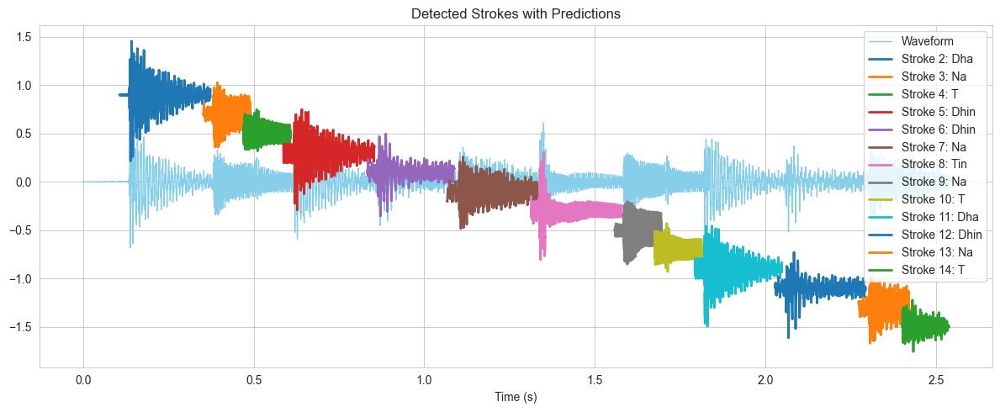

13
['Dha', 'Na', 'T', 'Dhin', 'Dhin', 'Na', 'Tin', 'Na', 'T', 'Dha', 'Dhin', 'Na', 'T'] [np.float64(0.128), np.float64(0.26616666666666666), np.float64(0.13816666666666666), np.float64(0.13816666666666666), np.float64(0.26616666666666666), np.float64(0.2555), np.float64(0.26616666666666666), np.float64(0.26616666666666666), np.float64(0.13816666666666666), np.float64(0.13816666666666666), np.float64(0.2555), np.float64(0.26616666666666666), np.float64(0.14883333333333335), np.float64(0.13733333333333334)]


In [42]:
predicted_normalised, durations = predict_tabla_bols(file_path="DataSet/Kaggle_Dataset/Jhaptaal/Jhaptaal-057.wav",model=model,adjust_length_fn=Adjust_Length,
    target_length=53608)  # match your model's input

print(len(predicted_normalised))  # ['Dha', 'Tin', 'Na', ...]
print(predicted_normalised, durations)

In [ ]:
import os
import csv

# Path to the folder containing the .wav files
folder_path = "DataSet/Kaggle_Unlabelled"

# Get the first 80 .wav files (sorted alphabetically)
file_list = sorted([f for f in os.listdir(folder_path) if f.endswith(".wav")])[:80]

# Output CSV path
csv_output_path = "tabla_predictions_kaggle_unlabelled_combined.csv"

# Create or overwrite the CSV file
with open(csv_output_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Filename', 'Stroke_Index', 'Bol', 'Duration'])

    # Loop through each file
    for file_name in file_list:
        file_path = os.path.join(folder_path, file_name)

        # Predict the bols and durations using your model
        predicted_bols, durations = predict_tabla_bols(file_path=file_path, model=model,adjust_length_fn=Adjust_Length,
    target_length=78592)

        # Write each (bol, duration) with its index into the CSV
        for idx, (bol, dur) in enumerate(zip(predicted_bols, durations)):
            writer.writerow([file_name, idx, bol, round(float(dur), 5)])

print(f"CSV saved at: {csv_output_path}")

### Dataset for Tabla Live data

Processing: Rupak_03.wav
Added onset at 0s manually (initial dB: -14.41)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-37.37 dB).
Stroke 2: Predicted → Tin (dB: -14.41)
Stroke 3: Predicted → Tin (dB: -16.16)
Stroke 4: Predicted → Ta (dB: -15.08)
Stroke 5: Predicted → Dhin (dB: -12.14)
Stroke 6: Predicted → Na (dB: -15.03)
Stroke 7: Predicted → Dhin (dB: -13.45)
Stroke 8: Predicted → Dha (dB: -15.75)
Skipping stroke 9: below dB threshold (-38.22 dB).


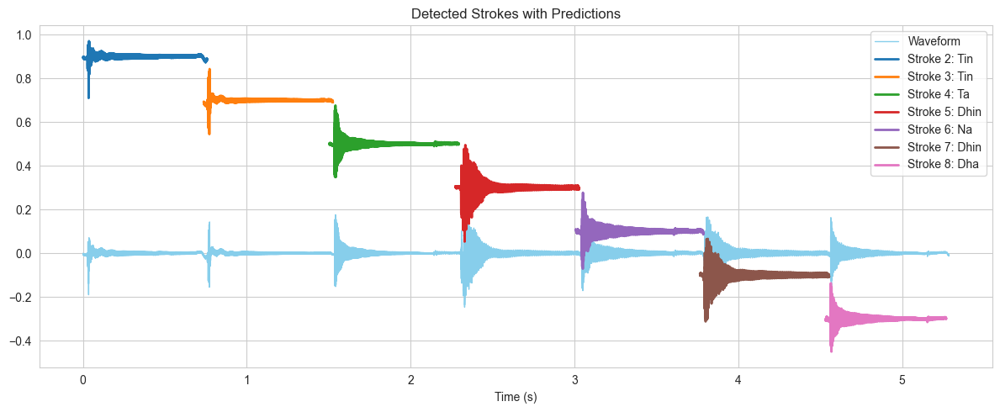

Processing: Rupak_02.wav
Added onset at 0s manually (initial dB: -13.43)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-37.97 dB).
Stroke 2: Predicted → Tin (dB: -13.43)
Stroke 3: Predicted → Tin (dB: -9.61)
Stroke 4: Predicted → Ta (dB: -14.98)
Stroke 5: Predicted → Dhin (dB: -12.76)
Stroke 6: Predicted → Na (dB: -16.68)
Skipping stroke 7: below dB threshold (-31.38 dB).
Stroke 8: Predicted → Dhin (dB: -10.77)
Stroke 9: Predicted → Na (dB: -16.41)


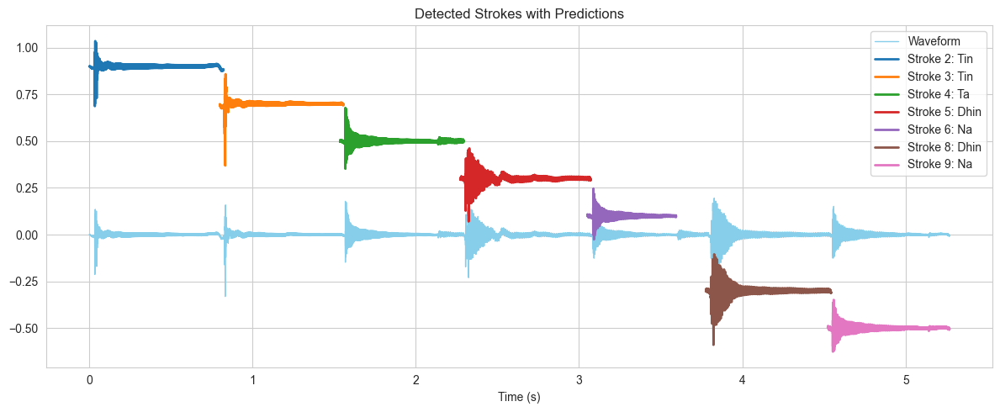

Processing: Rupak_01.wav
Added onset at 0s manually (initial dB: -35.69)
Detected 8 strokes
Skipping stroke 1: below dB threshold (-35.69 dB).
Stroke 2: Predicted → Tin (dB: -14.34)
Stroke 3: Predicted → Tin (dB: -14.21)
Stroke 4: Predicted → Ta (dB: -17.54)
Stroke 5: Predicted → Dhin (dB: -13.28)
Stroke 6: Predicted → Dha (dB: -19.35)
Stroke 7: Predicted → Dhin (dB: -14.02)
Stroke 8: Predicted → Na (dB: -15.91)


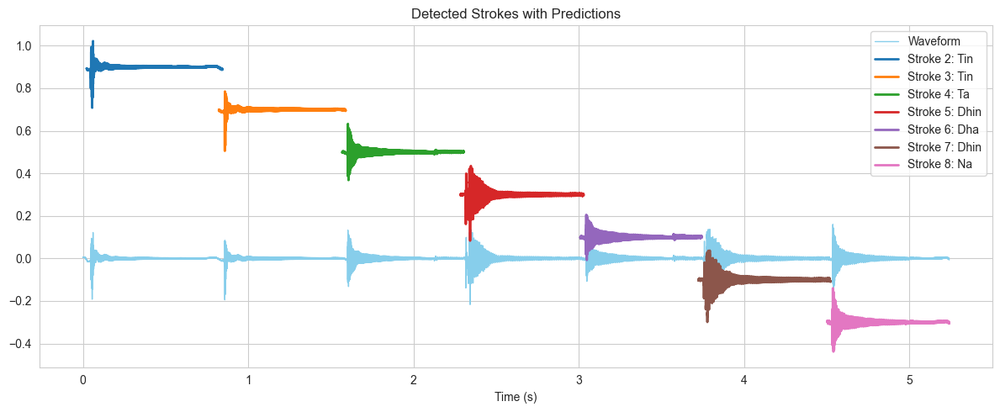

Processing: Rupak_05.wav
Added onset at 0s manually (initial dB: -16.37)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-33.12 dB).
Stroke 2: Predicted → Tin (dB: -16.37)
Stroke 3: Predicted → Tin (dB: -16.61)
Stroke 4: Predicted → Ta (dB: -17.04)
Skipping stroke 5: below dB threshold (-34.96 dB).
Stroke 6: Predicted → Dhin (dB: -9.15)
Stroke 7: Predicted → Na (dB: -16.40)
Stroke 8: Predicted → Dhin (dB: -11.96)
Stroke 9: Predicted → Na (dB: -14.39)


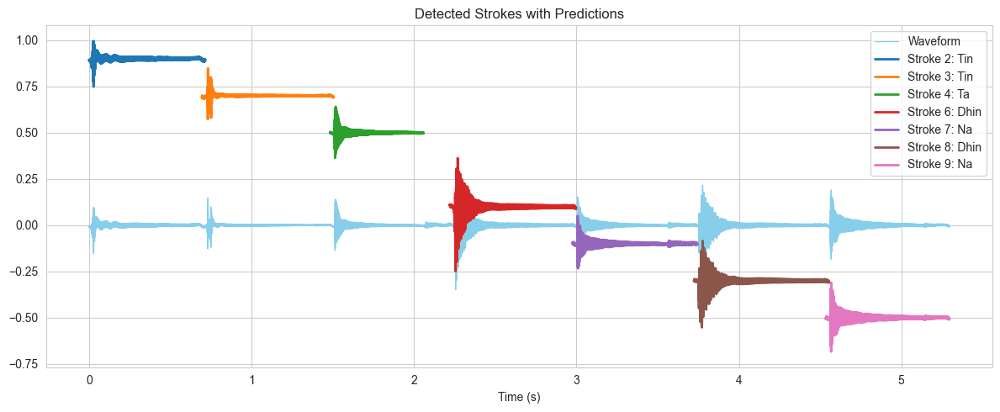

Processing: Rupak_04.wav
Added onset at 0s manually (initial dB: -12.23)
Detected 8 strokes
Skipping stroke 1: below dB threshold (-34.75 dB).
Stroke 2: Predicted → Tin (dB: -12.23)
Stroke 3: Predicted → Tin (dB: -12.23)
Stroke 4: Predicted → Ta (dB: -16.28)
Stroke 5: Predicted → Dhin (dB: -10.77)
Stroke 6: Predicted → Na (dB: -14.97)
Stroke 7: Predicted → Dhin (dB: -11.83)
Stroke 8: Predicted → Na (dB: -15.45)


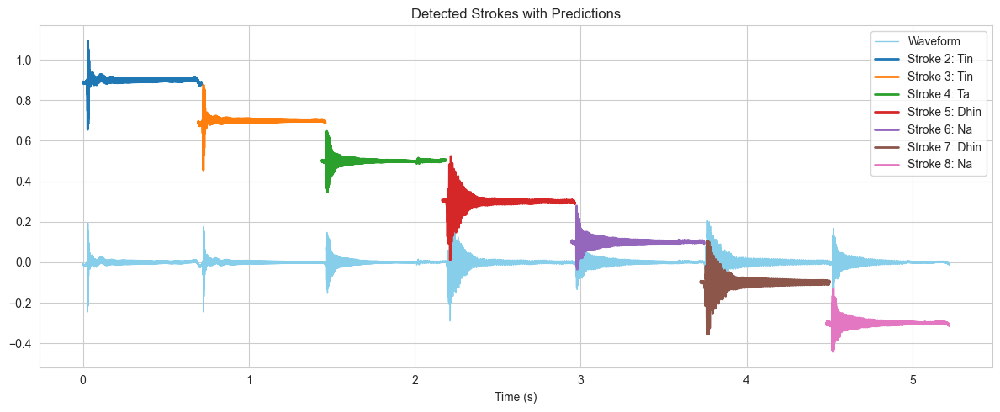

Processing: Rupak_10.wav
Added onset at 0s manually (initial dB: -33.73)
Detected 10 strokes
Skipping stroke 1: below dB threshold (-33.73 dB).
Stroke 2: Predicted → Tin (dB: -15.79)
Stroke 3: Predicted → Tin (dB: -10.64)
Stroke 4: Predicted → Ta (dB: -13.97)
Skipping stroke 5: below dB threshold (-31.82 dB).
Stroke 6: Predicted → Dhin (dB: -11.09)
Stroke 7: Predicted → Na (dB: -15.05)
Stroke 8: Predicted → Dhin (dB: -11.52)
Stroke 9: Predicted → Na (dB: -15.61)
Stroke 10: Predicted → Tin (dB: -6.87)


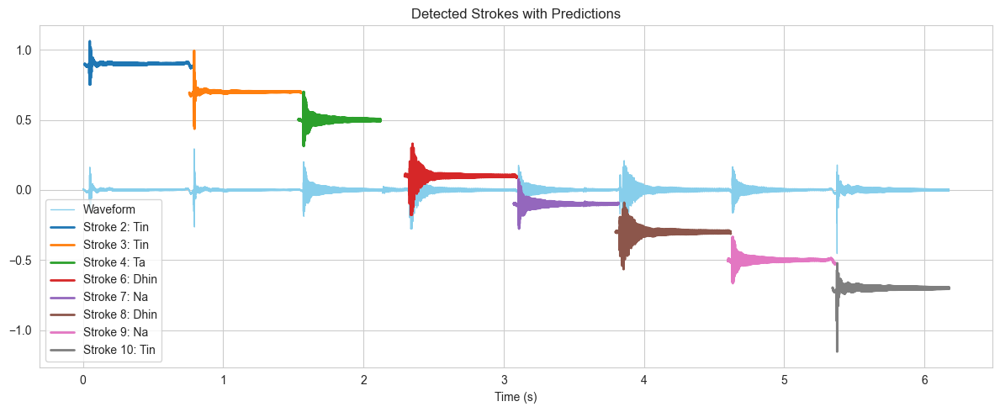

Processing: Rupak_06.wav
Added onset at 0s manually (initial dB: -14.59)
Detected 8 strokes
Skipping stroke 1: below dB threshold (-36.45 dB).
Stroke 2: Predicted → Tin (dB: -14.59)
Stroke 3: Predicted → Tin (dB: -16.47)
Stroke 4: Predicted → Ta (dB: -14.26)
Stroke 5: Predicted → Dhin (dB: -11.46)
Stroke 6: Predicted → Na (dB: -15.97)
Stroke 7: Predicted → Dhin (dB: -12.54)
Stroke 8: Predicted → Na (dB: -16.84)


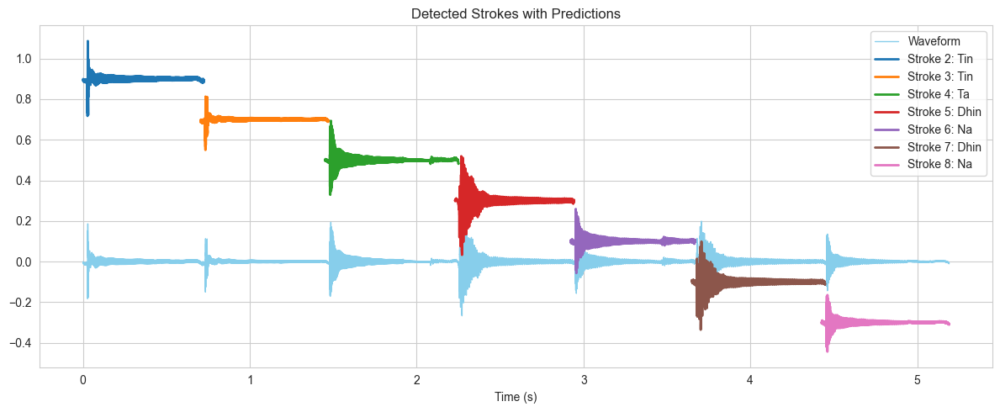

Processing: Rupak_07.wav
Added onset at 0s manually (initial dB: -16.59)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-35.63 dB).
Stroke 2: Predicted → Tin (dB: -16.59)
Stroke 3: Predicted → Tin (dB: -14.61)
Stroke 4: Predicted → Ta (dB: -12.29)
Stroke 5: Predicted → Dhin (dB: -11.77)
Stroke 6: Predicted → Na (dB: -14.20)
Stroke 7: Predicted → Ghe (dB: -18.04)
Stroke 8: Predicted → Dhin (dB: -12.17)
Stroke 9: Predicted → Na (dB: -14.07)


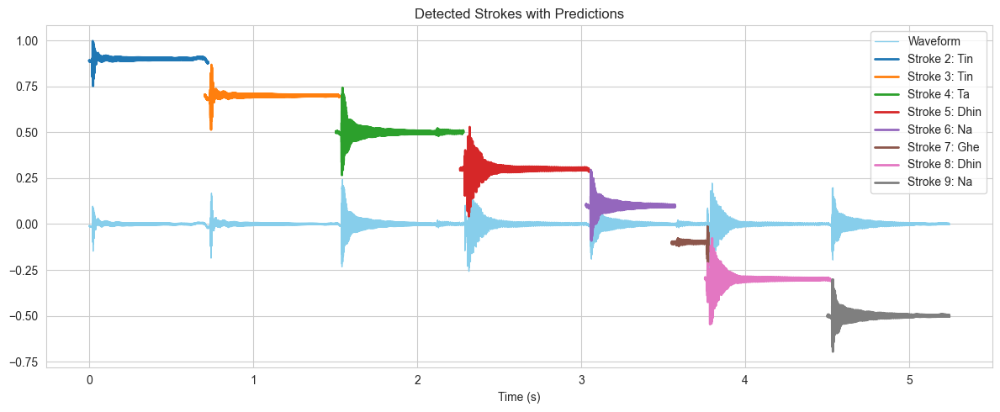

Processing: Jhaptaal_8.wav
Added onset at 0s manually (initial dB: -12.84)
Detected 12 strokes
Skipping stroke 1: below dB threshold (-51.82 dB).
Stroke 2: Predicted → Dhin (dB: -12.84)
Stroke 3: Predicted → Na (dB: -17.02)
Stroke 4: Predicted → Dhin (dB: -12.66)
Stroke 5: Predicted → Dhin (dB: -13.06)
Stroke 6: Predicted → Na (dB: -16.40)
Stroke 7: Predicted → Tin (dB: -15.74)
Stroke 8: Predicted → Ta (dB: -19.33)
Stroke 9: Predicted → Dhin (dB: -11.65)
Stroke 10: Predicted → Dhin (dB: -12.04)
Stroke 11: Predicted → Na (dB: -14.48)
Stroke 12: Predicted → Dhin (dB: -12.92)


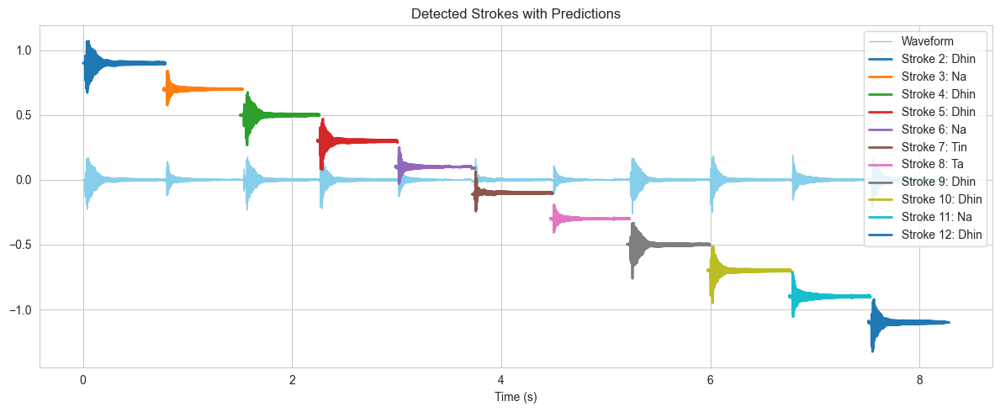

Processing: Jhaptaal_2.wav
Detected 13 strokes
Stroke 1: Predicted → Dhin (dB: -12.68)
Stroke 2: Predicted → Na (dB: -15.37)
Stroke 3: Predicted → Dhin (dB: -13.31)
Stroke 4: Predicted → Dhin (dB: -13.16)
Stroke 5: Predicted → Na (dB: -13.27)
Stroke 6: Predicted → Tin (dB: -11.94)
Stroke 7: Predicted → Ta (dB: -16.90)
Skipping stroke 8: below dB threshold (-33.90 dB).
Stroke 9: Predicted → Dhin (dB: -12.12)
Skipping stroke 10: below dB threshold (-30.29 dB).
Stroke 11: Predicted → Dhin (dB: -15.10)
Stroke 12: Predicted → Na (dB: -16.05)
Skipping stroke 13: below dB threshold (-34.44 dB).


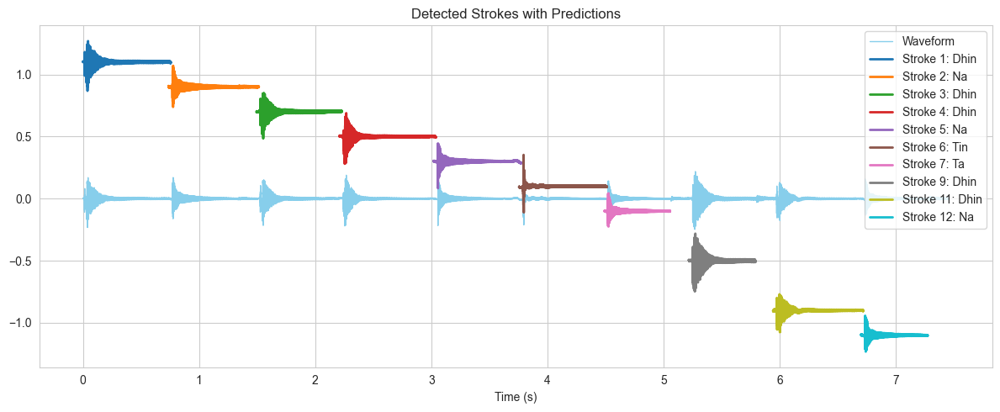

Processing: Jhaptaal_3.wav
Added onset at 0s manually (initial dB: -14.00)
Detected 13 strokes
Skipping stroke 1: below dB threshold (-41.75 dB).
Stroke 2: Predicted → Dhin (dB: -13.30)
Stroke 3: Predicted → Na (dB: -18.49)
Stroke 4: Predicted → Dhin (dB: -12.84)
Stroke 5: Predicted → Dhin (dB: -12.92)
Stroke 6: Predicted → Na (dB: -16.16)
Stroke 7: Predicted → Tin (dB: -15.50)
Stroke 8: Predicted → Ta (dB: -19.14)
Skipping stroke 9: below dB threshold (-35.33 dB).
Stroke 10: Predicted → Dhin (dB: -14.03)
Stroke 11: Predicted → Dhin (dB: -13.93)
Stroke 12: Predicted → Dhin (dB: -23.01)
Stroke 13: Predicted → Na (dB: -17.16)


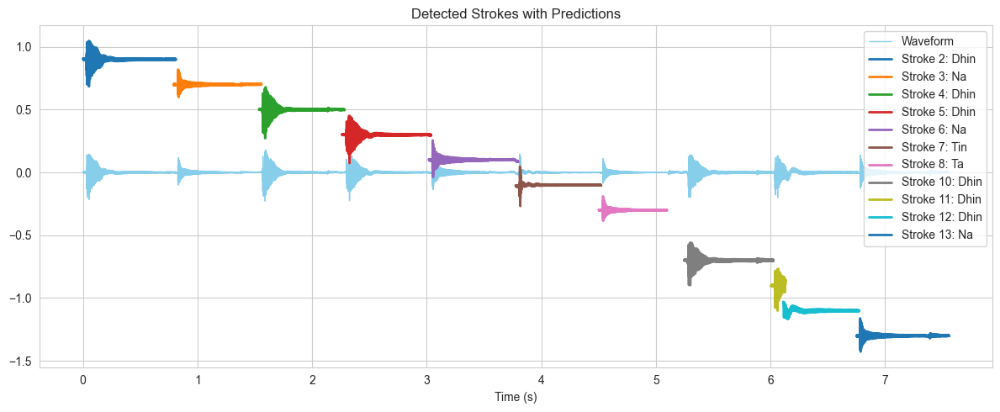

Processing: Jhaptaal_1.wav
Detected 10 strokes
Stroke 1: Predicted → Dhin (dB: -14.56)
Stroke 2: Predicted → Na (dB: -14.99)
Stroke 3: Predicted → Dhin (dB: -12.64)
Stroke 4: Predicted → Dhin (dB: -14.60)
Stroke 5: Predicted → Na (dB: -12.89)
Stroke 6: Predicted → Tin (dB: -12.08)
Stroke 7: Predicted → Ta (dB: -16.26)
Stroke 8: Predicted → Dhin (dB: -12.27)
Stroke 9: Predicted → Dhin (dB: -14.05)
Stroke 10: Predicted → Na (dB: -15.84)


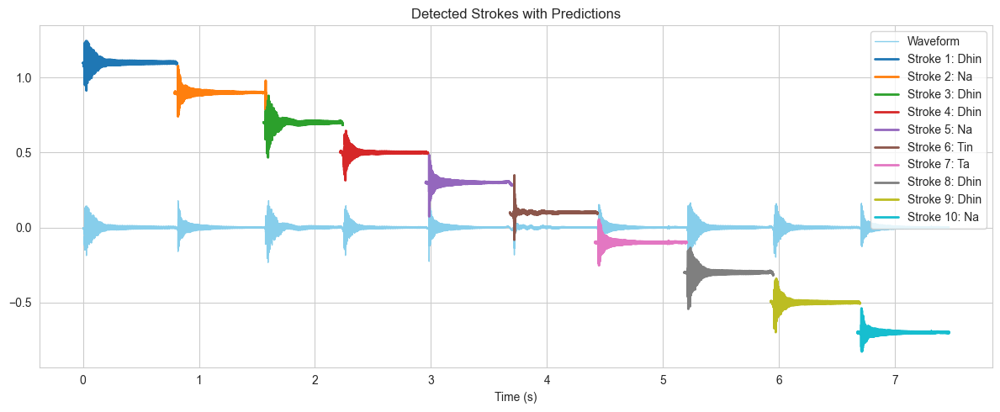

Processing: Jhaptaal_4.wav
Detected 13 strokes
Stroke 1: Predicted → Dhin (dB: -13.35)
Stroke 2: Predicted → Na (dB: -17.72)
Skipping stroke 3: below dB threshold (-35.05 dB).
Stroke 4: Predicted → Dhin (dB: -10.63)
Skipping stroke 5: below dB threshold (-33.16 dB).
Stroke 6: Predicted → Dhin (dB: -12.09)
Stroke 7: Predicted → Na (dB: -15.18)
Stroke 8: Predicted → Tin (dB: -17.51)
Stroke 9: Predicted → Ta (dB: -17.87)
Skipping stroke 10: below dB threshold (-35.70 dB).
Stroke 11: Predicted → Dhin (dB: -13.06)
Stroke 12: Predicted → Dhin (dB: -13.05)
Stroke 13: Predicted → Na (dB: -15.61)


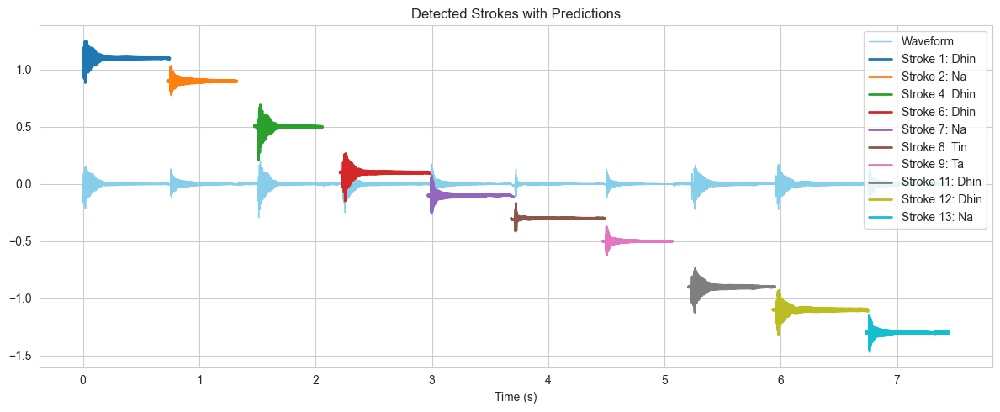

Processing: Jhaptaal_5.wav
Detected 11 strokes
Stroke 1: Predicted → Dhin (dB: -11.61)
Stroke 2: Predicted → Na (dB: -15.72)
Stroke 3: Predicted → Dhin (dB: -13.20)
Stroke 4: Predicted → Dhin (dB: -12.24)
Stroke 5: Predicted → Na (dB: -16.89)
Stroke 6: Predicted → Tin (dB: -17.98)
Stroke 7: Predicted → Ta (dB: -14.74)
Skipping stroke 8: below dB threshold (-31.38 dB).
Stroke 9: Predicted → Dhin (dB: -10.90)
Stroke 10: Predicted → Dhin (dB: -13.54)
Stroke 11: Predicted → Na (dB: -17.05)


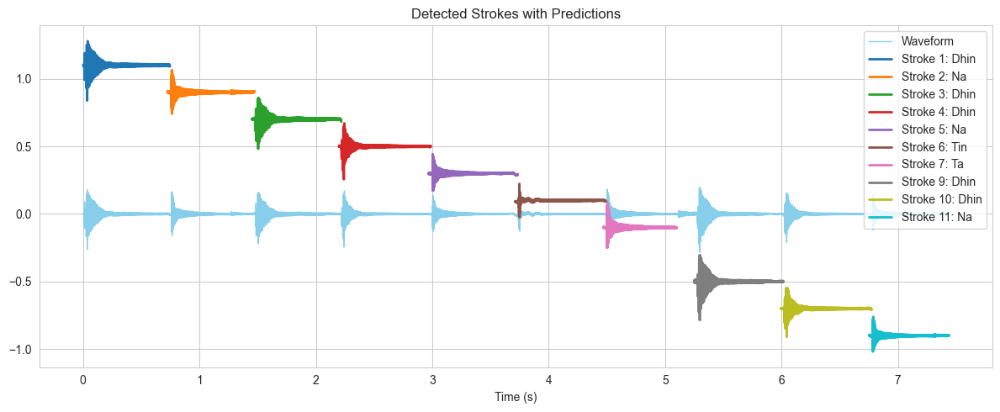

Processing: Jhaptaal_7.wav
Added onset at 0s manually (initial dB: -48.04)
Detected 12 strokes
Skipping stroke 1: below dB threshold (-43.10 dB).
Stroke 2: Predicted → Dhin (dB: -12.65)
Stroke 3: Predicted → Na (dB: -13.90)
Stroke 4: Predicted → Dhin (dB: -11.26)
Stroke 5: Predicted → Dhin (dB: -14.04)
Stroke 6: Predicted → Na (dB: -17.10)
Stroke 7: Predicted → Tin (dB: -15.03)
Stroke 8: Predicted → Ta (dB: -18.93)
Stroke 9: Predicted → Dhin (dB: -11.50)
Stroke 10: Predicted → Dhin (dB: -12.55)
Stroke 11: Predicted → Na (dB: -15.93)
Skipping stroke 12: below dB threshold (-34.53 dB).


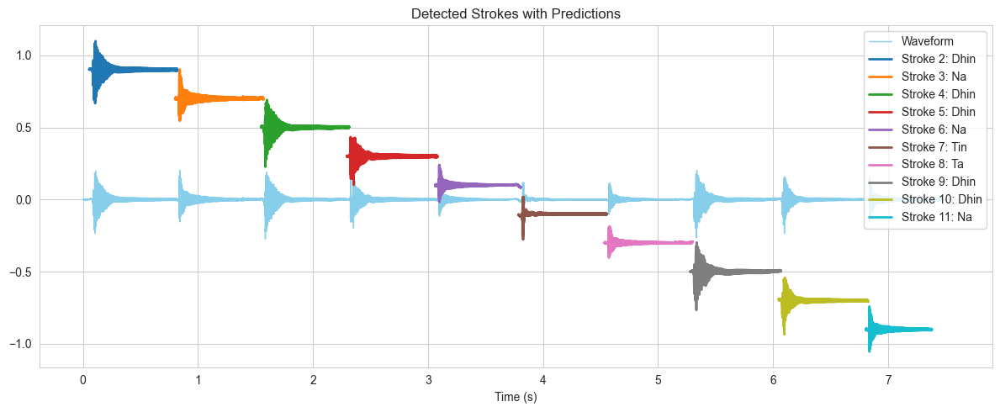

Processing: Jhaptaal_6.wav
Added onset at 0s manually (initial dB: -16.72)
Detected 11 strokes
Skipping stroke 1: below dB threshold (-55.79 dB).
Stroke 2: Predicted → Dhin (dB: -12.97)
Stroke 3: Predicted → Na (dB: -16.61)
Stroke 4: Predicted → Dhin (dB: -12.35)
Stroke 5: Predicted → Dhin (dB: -13.41)
Stroke 6: Predicted → Na (dB: -16.13)
Stroke 7: Predicted → Tin (dB: -9.16)
Stroke 8: Predicted → Ta (dB: -16.65)
Stroke 9: Predicted → Dhin (dB: -10.85)
Stroke 10: Predicted → Dhin (dB: -13.03)
Stroke 11: Predicted → Na (dB: -16.69)


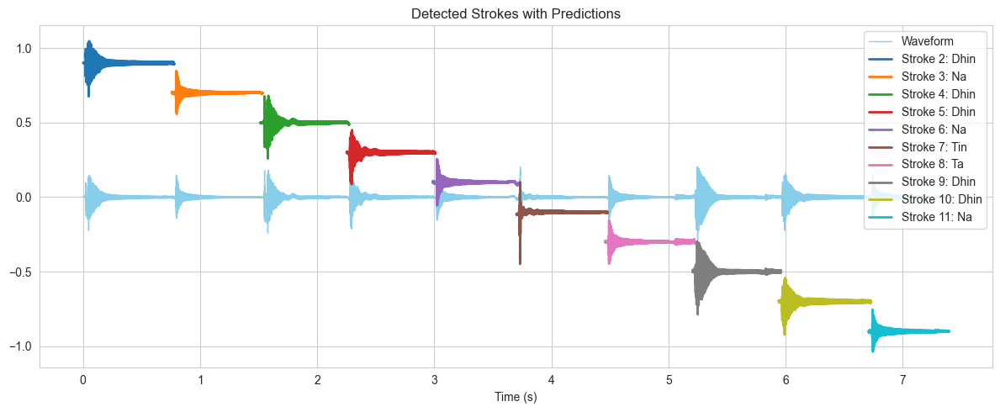

Processing: Ektaal_03.wav
Detected 20 strokes
Stroke 1: Predicted → Dhin (dB: -11.56)
Stroke 2: Predicted → Dhin (dB: -13.46)
Stroke 3: Predicted → Dha (dB: -11.22)
Stroke 4: Predicted → Ghe (dB: -20.39)
Stroke 5: Predicted → Re (dB: -12.03)
Stroke 6: Predicted → Re (dB: -12.11)
Stroke 7: Predicted → Kat (dB: -15.64)
Stroke 8: Predicted → T (dB: -20.67)
Stroke 9: Predicted → Tin (dB: -14.62)
Stroke 10: Predicted → Ta (dB: -16.60)
Stroke 11: Predicted → T (dB: -15.24)
Stroke 12: Predicted → Tun (dB: -16.17)
Stroke 13: Predicted → Dha (dB: -11.52)
Stroke 14: Predicted → Dhin (dB: -15.23)
Stroke 15: Predicted → Re (dB: -12.32)
Stroke 16: Predicted → Re (dB: -12.62)
Stroke 17: Predicted → Ki (dB: -21.06)
Stroke 18: Predicted → T (dB: -21.28)
Stroke 19: Predicted → Dhin (dB: -9.04)
Stroke 20: Predicted → Na (dB: -17.60)


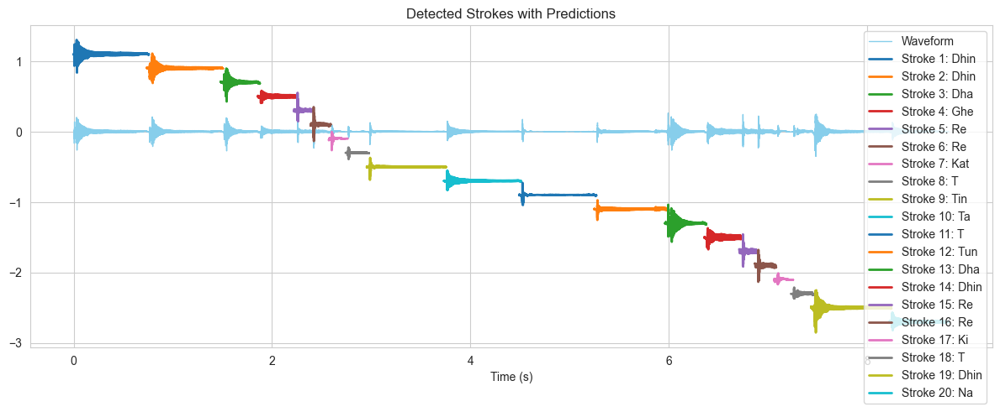

Processing: Ektaal_02.wav
Added onset at 0s manually (initial dB: -38.70)
Detected 21 strokes
Skipping stroke 1: below dB threshold (-35.01 dB).
Stroke 2: Predicted → Dhin (dB: -11.86)
Stroke 3: Predicted → Dhin (dB: -15.20)
Stroke 4: Predicted → Dha (dB: -8.88)
Stroke 5: Predicted → Ghe (dB: -19.41)
Stroke 6: Predicted → Re (dB: -13.05)
Stroke 7: Predicted → Re (dB: -11.19)
Stroke 8: Predicted → Kat (dB: -14.38)
Stroke 9: Predicted → T (dB: -20.03)
Stroke 10: Predicted → Tin (dB: -18.17)
Stroke 11: Predicted → Ta (dB: -14.69)
Stroke 12: Predicted → T (dB: -15.97)
Stroke 13: Predicted → Tun (dB: -15.33)
Stroke 14: Predicted → Dha (dB: -9.39)
Stroke 15: Predicted → Ghe (dB: -18.52)
Stroke 16: Predicted → Re (dB: -12.67)
Stroke 17: Predicted → Re (dB: -11.76)
Stroke 18: Predicted → Ki (dB: -18.26)
Stroke 19: Predicted → T (dB: -22.04)
Stroke 20: Predicted → Dhin (dB: -8.36)
Stroke 21: Predicted → Na (dB: -16.82)


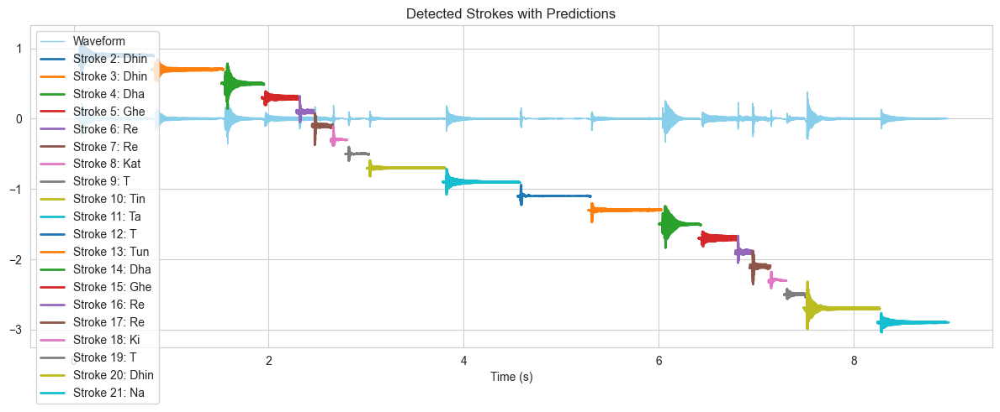

Processing: Rupak_09.wav
Added onset at 0s manually (initial dB: -14.98)
Detected 8 strokes
Skipping stroke 1: below dB threshold (-32.86 dB).
Stroke 2: Predicted → Tin (dB: -14.98)
Stroke 3: Predicted → Tin (dB: -9.18)
Stroke 4: Predicted → Ta (dB: -14.79)
Stroke 5: Predicted → Dhin (dB: -11.25)
Stroke 6: Predicted → Na (dB: -15.26)
Stroke 7: Predicted → Dhin (dB: -12.73)
Stroke 8: Predicted → Na (dB: -15.84)


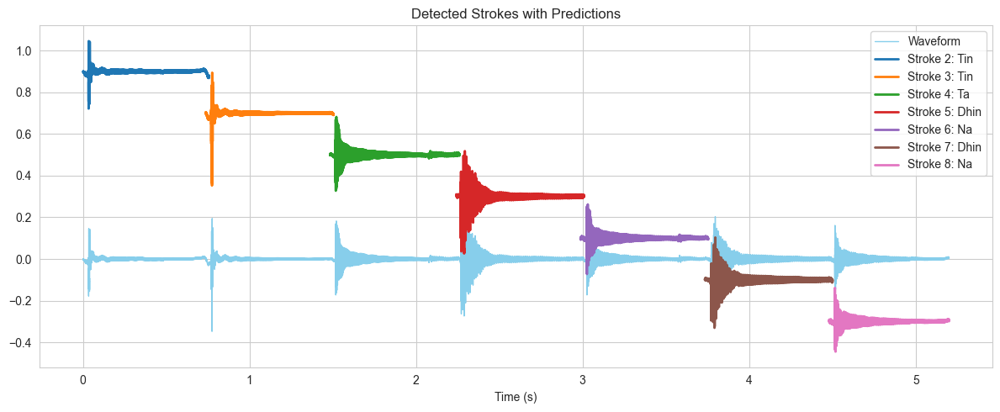

Processing: Rupak_08.wav
Added onset at 0s manually (initial dB: -13.99)
Detected 8 strokes
Skipping stroke 1: below dB threshold (-34.13 dB).
Stroke 2: Predicted → Tin (dB: -13.99)
Stroke 3: Predicted → Tin (dB: -8.48)
Stroke 4: Predicted → Ta (dB: -14.31)
Stroke 5: Predicted → Dhin (dB: -11.86)
Stroke 6: Predicted → Na (dB: -15.08)
Stroke 7: Predicted → Dhin (dB: -11.37)
Stroke 8: Predicted → Na (dB: -15.51)


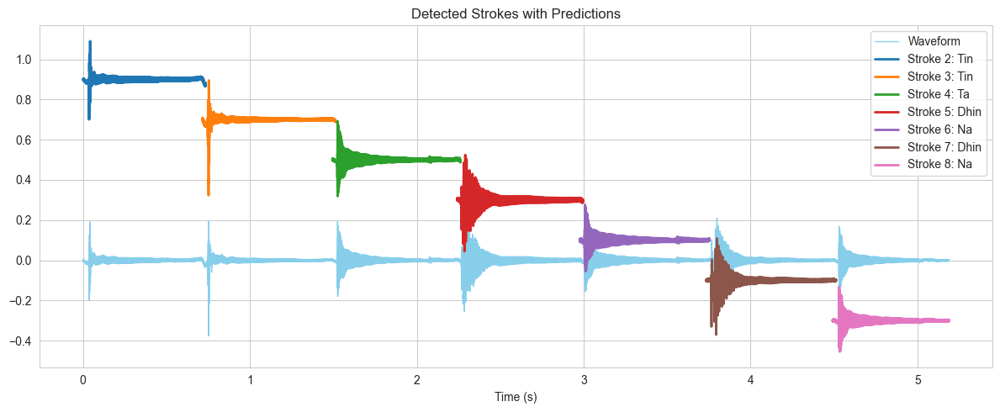

Processing: Ektaal_01.wav
Detected 21 strokes
Stroke 1: Predicted → Dhin (dB: -10.36)
Stroke 2: Predicted → Dhin (dB: -14.63)
Stroke 3: Predicted → Dha (dB: -9.16)
Stroke 4: Predicted → Ghe (dB: -18.94)
Stroke 5: Predicted → Re (dB: -11.05)
Stroke 6: Predicted → Re (dB: -12.05)
Stroke 7: Predicted → Kat (dB: -17.78)
Stroke 8: Predicted → T (dB: -20.33)
Stroke 9: Predicted → Tin (dB: -17.04)
Stroke 10: Predicted → Ta (dB: -14.80)
Stroke 11: Predicted → Kat (dB: -13.42)
Stroke 12: Predicted → Tin (dB: -13.73)
Stroke 13: Predicted → Ghe (dB: -26.40)
Stroke 14: Predicted → Dha (dB: -9.21)
Stroke 15: Predicted → Ghe (dB: -14.72)
Stroke 16: Predicted → Re (dB: -11.55)
Stroke 17: Predicted → Re (dB: -12.57)
Stroke 18: Predicted → T (dB: -20.15)
Stroke 19: Predicted → T (dB: -18.64)
Stroke 20: Predicted → Dhin (dB: -10.64)
Stroke 21: Predicted → Na (dB: -8.49)


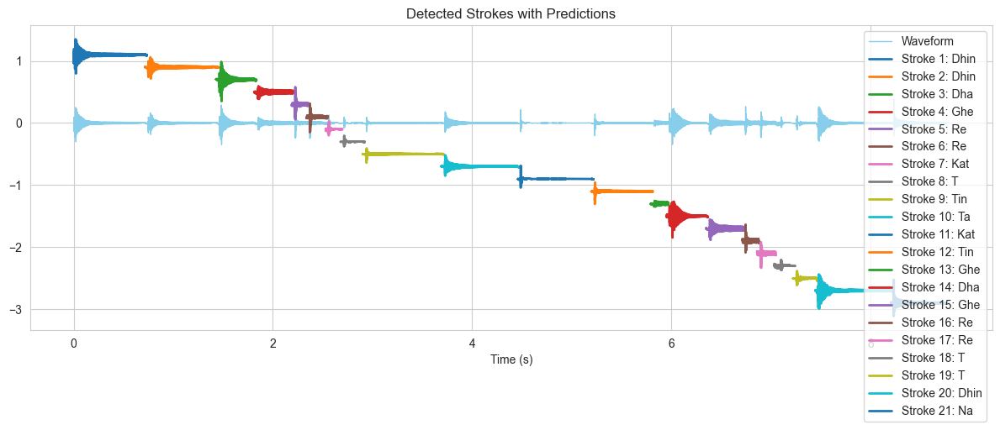

Processing: Ektaal_05.wav
Detected 21 strokes
Stroke 1: Predicted → Dhin (dB: -10.72)
Stroke 2: Predicted → Dhin (dB: -13.95)
Stroke 3: Predicted → Dha (dB: -11.52)
Stroke 4: Predicted → Ghe (dB: -21.50)
Stroke 5: Predicted → Re (dB: -10.95)
Stroke 6: Predicted → Re (dB: -10.69)
Stroke 7: Predicted → Ki (dB: -18.64)
Stroke 8: Predicted → T (dB: -16.56)
Stroke 9: Predicted → Tin (dB: -16.11)
Stroke 10: Predicted → Na (dB: -11.01)
Stroke 11: Predicted → T (dB: -17.18)
Stroke 12: Predicted → Tin (dB: -11.16)
Skipping stroke 13: below dB threshold (-31.12 dB).
Stroke 14: Predicted → Dha (dB: -8.25)
Stroke 15: Predicted → Ghe (dB: -9.48)
Stroke 16: Predicted → Re (dB: -11.03)
Stroke 17: Predicted → Re (dB: -9.24)
Stroke 18: Predicted → Ki (dB: -18.44)
Stroke 19: Predicted → Dhin (dB: -17.43)
Stroke 20: Predicted → Dhin (dB: -9.90)
Stroke 21: Predicted → Na (dB: -17.48)


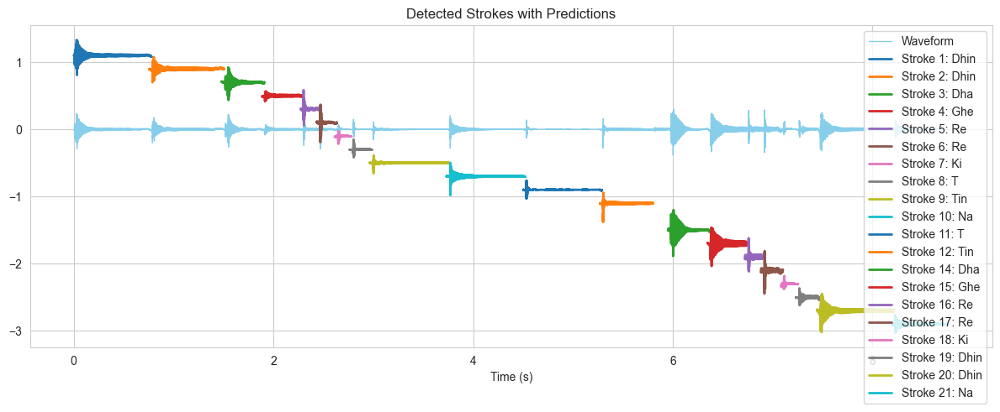

Processing: Ektaal_04.wav
Added onset at 0s manually (initial dB: -9.74)
Detected 22 strokes
Skipping stroke 1: below dB threshold (-43.62 dB).
Stroke 2: Predicted → Dhin (dB: -9.74)
Stroke 3: Predicted → Dhin (dB: -10.97)
Stroke 4: Predicted → Dha (dB: -12.04)
Stroke 5: Predicted → Ghe (dB: -16.71)
Stroke 6: Predicted → Re (dB: -11.50)
Stroke 7: Predicted → Re (dB: -12.85)
Stroke 8: Predicted → Kat (dB: -17.76)
Stroke 9: Predicted → T (dB: -19.58)
Stroke 10: Predicted → Tin (dB: -14.93)
Stroke 11: Predicted → Ta (dB: -15.14)
Stroke 12: Predicted → T (dB: -13.88)
Stroke 13: Predicted → Tin (dB: -14.81)
Skipping stroke 14: below dB threshold (-30.38 dB).
Stroke 15: Predicted → Dha (dB: -10.24)
Stroke 16: Predicted → Ghe (dB: -14.90)
Stroke 17: Predicted → Ti (dB: -17.33)
Stroke 18: Predicted → Re (dB: -10.53)
Stroke 19: Predicted → Ki (dB: -16.14)
Stroke 20: Predicted → T (dB: -14.32)
Stroke 21: Predicted → Dhin (dB: -11.37)
Stroke 22: Predicted → Na (dB: -16.59)


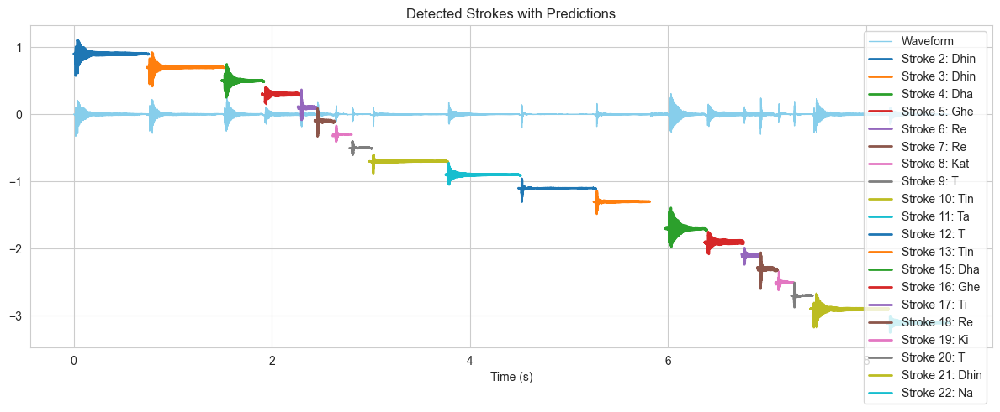

Processing: Ektaal_06.wav
Detected 21 strokes
Stroke 1: Predicted → Dhin (dB: -11.87)
Stroke 2: Predicted → Dhin (dB: -12.28)
Stroke 3: Predicted → Dha (dB: -10.20)
Stroke 4: Predicted → Ghe (dB: -18.25)
Stroke 5: Predicted → Re (dB: -12.39)
Stroke 6: Predicted → Re (dB: -12.71)
Stroke 7: Predicted → Kat (dB: -12.01)
Stroke 8: Predicted → T (dB: -23.27)
Stroke 9: Predicted → Tin (dB: -14.32)
Stroke 10: Predicted → Ta (dB: -14.26)
Stroke 11: Predicted → Kat (dB: -17.71)
Stroke 12: Predicted → Tin (dB: -14.88)
Skipping stroke 13: below dB threshold (-30.27 dB).
Stroke 14: Predicted → Dha (dB: -10.90)
Stroke 15: Predicted → Ghe (dB: -14.28)
Stroke 16: Predicted → Re (dB: -15.14)
Stroke 17: Predicted → Re (dB: -11.73)
Stroke 18: Predicted → Kat (dB: -16.07)
Stroke 19: Predicted → T (dB: -20.50)
Stroke 20: Predicted → Dhin (dB: -8.76)
Stroke 21: Predicted → Na (dB: -16.11)


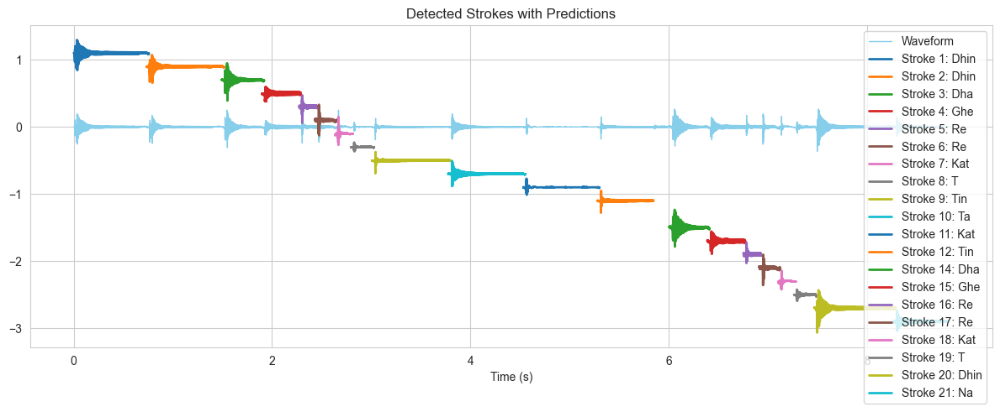

Processing: Ektaal_07.wav
Detected 22 strokes
Stroke 1: Predicted → Dhin (dB: -10.33)
Stroke 2: Predicted → Dhin (dB: -14.48)
Stroke 3: Predicted → Dha (dB: -10.84)
Stroke 4: Predicted → Ghe (dB: -17.98)
Stroke 5: Predicted → Re (dB: -17.70)
Stroke 6: Predicted → Re (dB: -12.09)
Stroke 7: Predicted → Ki (dB: -16.09)
Stroke 8: Predicted → T (dB: -22.71)
Stroke 9: Predicted → Tin (dB: -19.31)
Stroke 10: Predicted → Ta (dB: -14.67)
Stroke 11: Predicted → Kat (dB: -10.35)
Stroke 12: Predicted → Tun (dB: -14.72)
Stroke 13: Predicted → Dhin (dB: -30.00)
Stroke 14: Predicted → Dha (dB: -7.82)
Stroke 15: Predicted → Ghe (dB: -12.16)
Stroke 16: Predicted → Re (dB: -14.16)
Stroke 17: Predicted → Re (dB: -11.70)
Stroke 18: Predicted → Ki (dB: -19.99)
Stroke 19: Predicted → T (dB: -23.46)
Stroke 20: Predicted → Dhin (dB: -10.31)
Stroke 21: Predicted → Na (dB: -14.83)
Stroke 22: Predicted → Dhin (dB: -11.00)


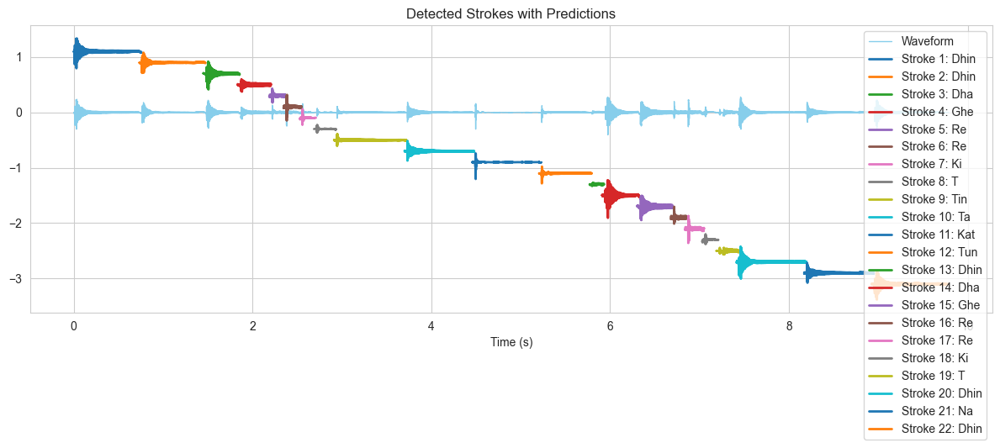

✅ Stroke predictions saved to 'tabla_stroke_predictions_Tabla_Live'


In [45]:
taal_list = "DataSet/Kaggle_Unlabelled/"
all_predictions = []

for taal in os.listdir(taal_list):
    if ".wav" in taal:
        print(f"Processing: {taal}")

        # Run your model
        predicted_final, duration_note = predict_tabla_bols(
            file_path=taal_list + taal,
            model=model,
            adjust_length_fn=Adjust_Length,
            target_length=53608
        )

        filename = taal
        predicted_strokes = predicted_final
        durations = duration_note

        # Store strokes and durations with metadata
        for stroke_idx, (stroke, duration) in enumerate(zip(predicted_strokes, durations), start=1):
            all_predictions.append({
                "filename": filename,
                "stroke_index": stroke_idx,
                "stroke": stroke,
                "duration_sec": float(duration)  # make sure duration is float not np.float64
            })

# Convert all predictions to DataFrame
final_df = pd.DataFrame(all_predictions)


final_df.to_csv("tabla_stroke_predictions_live_model1_Tabla_Live.csv", index=False)

print("✅ Stroke predictions saved to 'tabla_stroke_predictions_Tabla_Live'")

### Dataset for Eletronic dataset (TablaPU)

Processing: Jhaptaal (10).wav
Detected 19 strokes
Stroke 1: Predicted → Dhin (dB: -5.38)
Stroke 2: Predicted → Re (dB: -16.74)
Stroke 3: Predicted → Na (dB: -10.95)
Stroke 4: Predicted → T (dB: -19.37)
Stroke 5: Predicted → Dhin (dB: -8.80)
Stroke 6: Predicted → Re (dB: -19.35)
Stroke 7: Predicted → Dhin (dB: -8.66)
Stroke 8: Predicted → Ta (dB: -13.27)
Stroke 9: Predicted → Ta (dB: -13.64)
Stroke 10: Predicted → Tin (dB: -5.16)
Stroke 11: Predicted → T (dB: -19.41)
Stroke 12: Predicted → Ta (dB: -10.61)
Stroke 13: Predicted → Tin (dB: -19.16)
Stroke 14: Predicted → Dhin (dB: -8.76)
Stroke 15: Predicted → Re (dB: -19.31)
Stroke 16: Predicted → Dhin (dB: -8.69)
Stroke 17: Predicted → Ta (dB: -10.78)
Stroke 18: Predicted → Ta (dB: -13.33)
Stroke 19: Predicted → Tin (dB: -19.16)


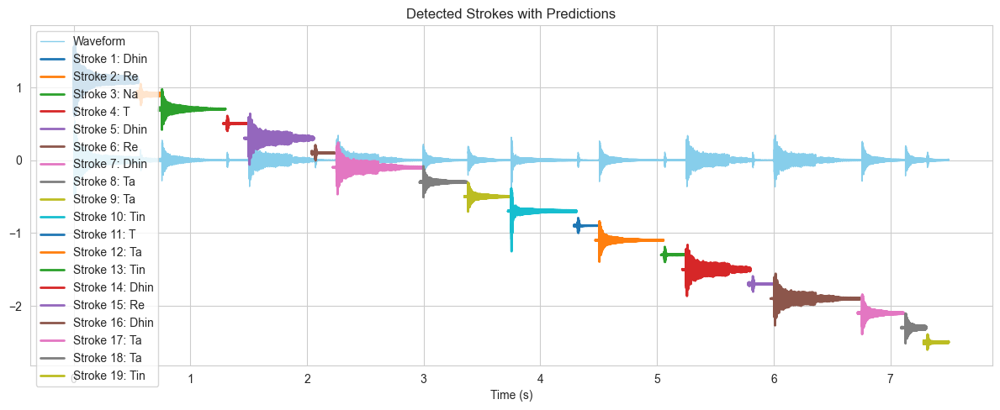

Processing: Jai Taal (13).wav
Detected 21 strokes
Stroke 1: Predicted → Dhin (dB: -6.76)
Stroke 2: Predicted → Kat (dB: -9.80)
Stroke 3: Predicted → Kat (dB: -10.03)
Stroke 4: Predicted → Ki (dB: -10.43)
Stroke 5: Predicted → Kat (dB: -10.28)
Stroke 6: Predicted → Dhin (dB: -8.66)
Stroke 7: Predicted → Ta (dB: -10.63)
Stroke 8: Predicted → Kat (dB: -10.37)
Stroke 9: Predicted → Kat (dB: -10.32)
Stroke 10: Predicted → Ki (dB: -10.29)
Stroke 11: Predicted → Kat (dB: -10.30)
Stroke 12: Predicted → Dhin (dB: -8.67)
Stroke 13: Predicted → Ta (dB: -11.18)
Stroke 14: Predicted → Tun (dB: -8.07)
Stroke 15: Predicted → Ta (dB: -11.27)
Stroke 16: Predicted → Ta (dB: -10.57)
Stroke 17: Predicted → Dhin (dB: -8.82)
Stroke 18: Predicted → Dhin (dB: -8.63)
Stroke 19: Predicted → Dha (dB: -7.05)
Stroke 20: Predicted → Dha (dB: -6.92)
Stroke 21: Predicted → Ki (dB: -9.04)


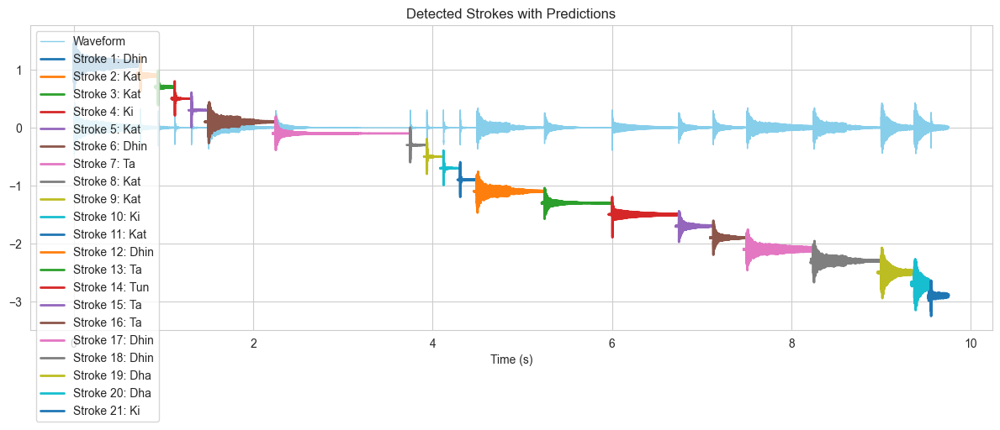

Processing: Ashta Jhaptaal (8.5).wav
Detected 17 strokes
Stroke 1: Predicted → Dhin (dB: -5.37)
Stroke 2: Predicted → T (dB: -17.50)
Stroke 3: Predicted → Ta (dB: -10.74)
Stroke 4: Predicted → Tin (dB: -19.18)
Stroke 5: Predicted → Dhin (dB: -8.78)
Stroke 6: Predicted → Re (dB: -19.66)
Stroke 7: Predicted → Dhin (dB: -8.66)
Stroke 8: Predicted → Re (dB: -19.14)
Stroke 9: Predicted → Ta (dB: -11.07)
Stroke 10: Predicted → T (dB: -19.31)
Stroke 11: Predicted → Tin (dB: -5.22)
Stroke 12: Predicted → T (dB: -19.46)
Stroke 13: Predicted → Ta (dB: -10.67)
Stroke 14: Predicted → Tin (dB: -19.19)
Stroke 15: Predicted → Dhin (dB: -7.24)
Stroke 16: Predicted → Dhin (dB: -10.82)
Stroke 17: Predicted → Na (dB: -10.04)


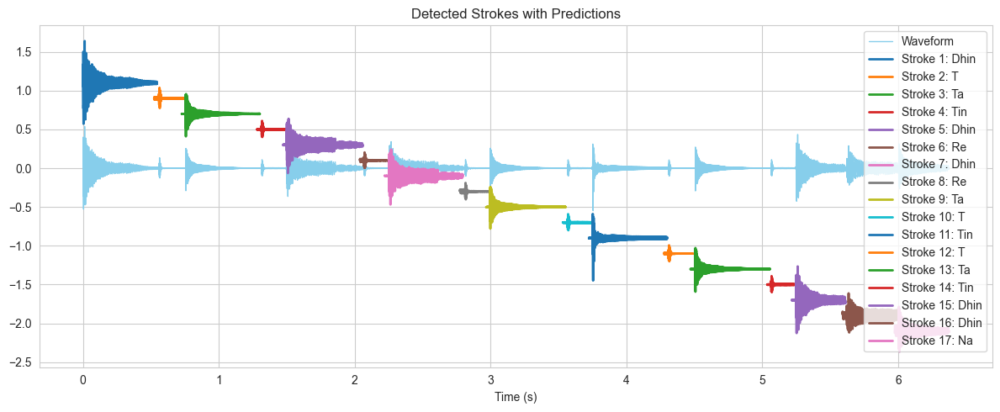

Processing: Saatva (7).wav
Detected 7 strokes
Stroke 1: Predicted → Dha (dB: -5.06)
Stroke 2: Predicted → Ghe (dB: -19.38)
Stroke 3: Predicted → T (dB: -19.35)
Stroke 4: Predicted → Dha (dB: -6.96)
Stroke 5: Predicted → Dhin (dB: -17.79)
Stroke 6: Predicted → Tin (dB: -8.68)
Stroke 7: Predicted → T (dB: -25.60)


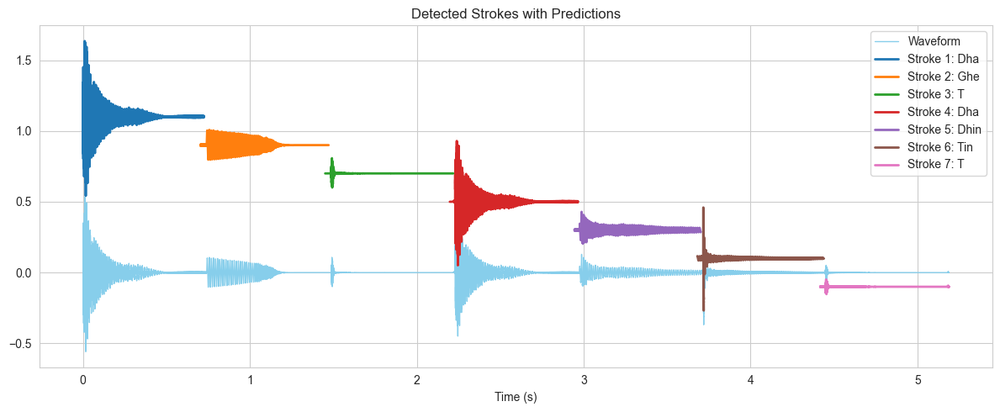

Processing: Jat Taal (8).wav
Detected 24 strokes
Stroke 1: Predicted → Dha (dB: -5.04)
Stroke 2: Predicted → Tin (dB: -17.25)
Stroke 3: Predicted → Dhin (dB: -8.79)
Stroke 4: Predicted → Re (dB: -19.17)
Stroke 5: Predicted → Dha (dB: -7.00)
Stroke 6: Predicted → T (dB: -19.89)
Stroke 7: Predicted → Dhin (dB: -7.93)
Stroke 8: Predicted → Dhin (dB: -10.61)
Stroke 9: Predicted → Dha (dB: -14.04)
Stroke 10: Predicted → Tin (dB: -5.21)
Stroke 11: Predicted → T (dB: -19.49)
Stroke 12: Predicted → Ta (dB: -10.82)
Stroke 13: Predicted → Tin (dB: -19.30)
Stroke 14: Predicted → Tin (dB: -5.07)
Stroke 15: Predicted → T (dB: -19.45)
Stroke 16: Predicted → Dha (dB: -6.98)
Stroke 17: Predicted → T (dB: -19.95)
Stroke 18: Predicted → Dha (dB: -7.92)
Stroke 19: Predicted → Dhin (dB: -10.60)
Stroke 20: Predicted → Dha (dB: -13.76)
Stroke 21: Predicted → Dhin (dB: -8.98)
Stroke 22: Predicted → Re (dB: -9.03)
Stroke 23: Predicted → Dhin (dB: -13.59)
Stroke 24: Predicted → Re (dB: -17.08)


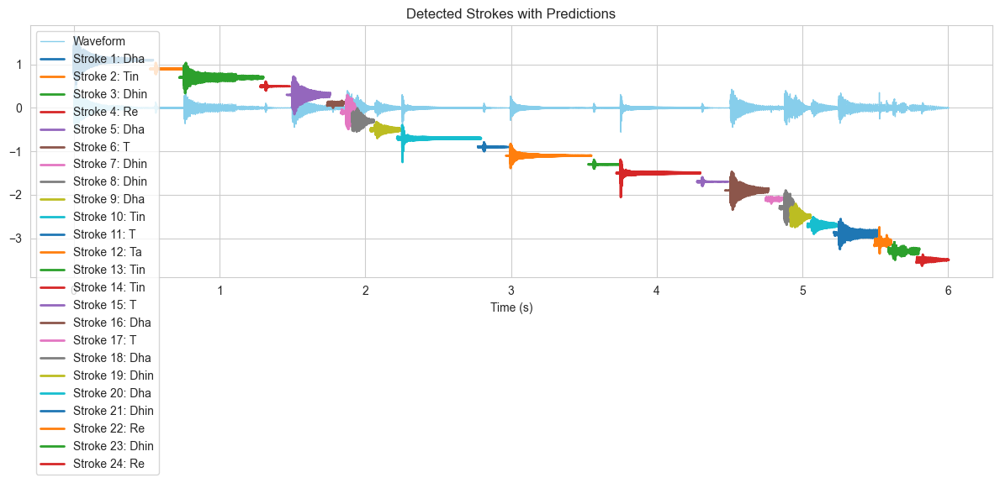

Processing: Pancham Sawari Taal (15).wav
Detected 29 strokes
Stroke 1: Predicted → Dhin (dB: -6.77)
Stroke 2: Predicted → Na (dB: -10.88)
Stroke 3: Predicted → Dhin (dB: -7.24)
Stroke 4: Predicted → Dhin (dB: -10.83)
Stroke 5: Predicted → Kat (dB: -10.33)
Stroke 6: Predicted → Dhin (dB: -7.35)
Stroke 7: Predicted → Dhin (dB: -10.79)
Stroke 8: Predicted → Na (dB: -11.11)
Stroke 9: Predicted → Dhin (dB: -7.46)
Stroke 10: Predicted → Dhin (dB: -10.89)
Stroke 11: Predicted → Na (dB: -10.45)
Stroke 12: Predicted → Tin (dB: -5.12)
Stroke 13: Predicted → Kat (dB: -10.43)
Stroke 14: Predicted → Tin (dB: -8.68)
Stroke 15: Predicted → Ta (dB: -11.37)
Stroke 16: Predicted → T (dB: -10.41)
Stroke 17: Predicted → Kat (dB: -10.39)
Stroke 18: Predicted → Ki (dB: -10.52)
Stroke 19: Predicted → Kat (dB: -10.30)
Stroke 20: Predicted → Tin (dB: -8.19)
Stroke 21: Predicted → Ta (dB: -10.69)
Stroke 22: Predicted → T (dB: -10.09)
Stroke 23: Predicted → Ta (dB: -10.35)
Stroke 24: Predicted → Dhin (dB: -7.30)

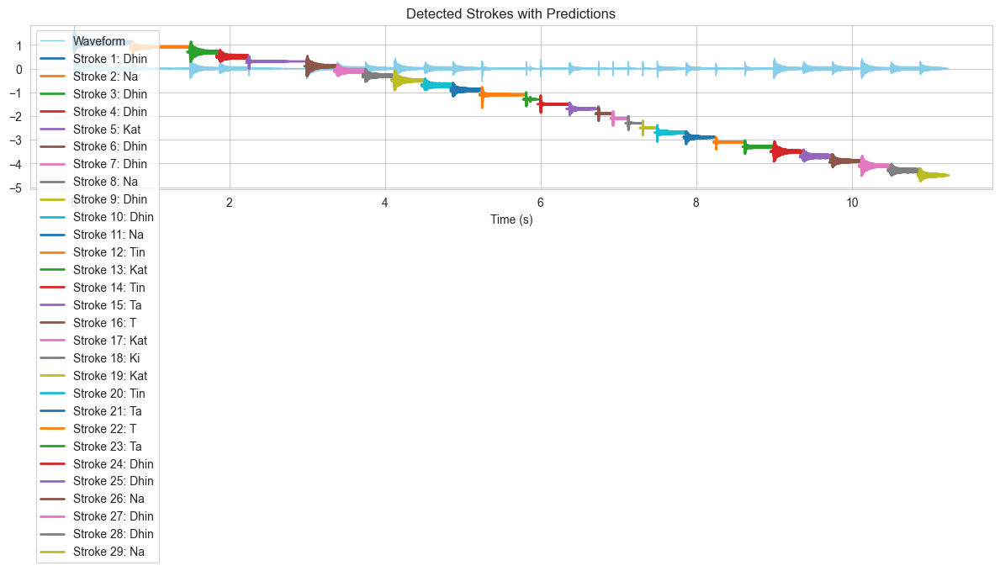

Processing: Jhoomra (14).wav
Detected 40 strokes
Stroke 1: Predicted → Dhin (dB: -5.35)
Stroke 2: Predicted → Re (dB: -15.98)
Stroke 3: Predicted → Dhin (dB: -19.18)
Stroke 4: Predicted → Dha (dB: -6.92)
Stroke 5: Predicted → T (dB: -10.06)
Stroke 6: Predicted → Kat (dB: -10.43)
Stroke 7: Predicted → Tin (dB: -10.47)
Stroke 8: Predicted → Kat (dB: -10.40)
Stroke 9: Predicted → Dhin (dB: -8.69)
Stroke 10: Predicted → Re (dB: -19.17)
Stroke 11: Predicted → Dhin (dB: -8.65)
Stroke 12: Predicted → Re (dB: -19.28)
Stroke 13: Predicted → Dha (dB: -7.02)
Stroke 14: Predicted → Re (dB: -9.92)
Stroke 15: Predicted → Dha (dB: -6.58)
Stroke 16: Predicted → Ghe (dB: -16.45)
Stroke 17: Predicted → Re (dB: -9.43)
Stroke 18: Predicted → Re (dB: -9.81)
Stroke 19: Predicted → Ki (dB: -10.47)
Stroke 20: Predicted → Kat (dB: -10.33)
Stroke 21: Predicted → Tin (dB: -5.30)
Stroke 22: Predicted → T (dB: -19.45)
Stroke 23: Predicted → Ta (dB: -29.77)
Stroke 24: Predicted → Ta (dB: -10.50)
Stroke 25: Predicte

/opt/anaconda3/envs/ML312/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


Stroke 28: Predicted → Kat (dB: -10.27)
Stroke 29: Predicted → Dhin (dB: -8.69)
Stroke 30: Predicted → Re (dB: -19.17)
Stroke 31: Predicted → Dhin (dB: -8.66)
Stroke 32: Predicted → Re (dB: -19.13)
Stroke 33: Predicted → Dha (dB: -7.03)
Stroke 34: Predicted → Re (dB: -9.93)
Stroke 35: Predicted → Dha (dB: -6.57)
Stroke 36: Predicted → Ghe (dB: -16.60)
Stroke 37: Predicted → Re (dB: -9.58)
Stroke 38: Predicted → Re (dB: -10.01)
Stroke 39: Predicted → Ki (dB: -10.45)
Stroke 40: Predicted → Kat (dB: -10.24)


/var/folders/ty/jtb0r7z947v1rwjplpwl4t540000gn/T/ipykernel_77355/2884391601.py:68: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


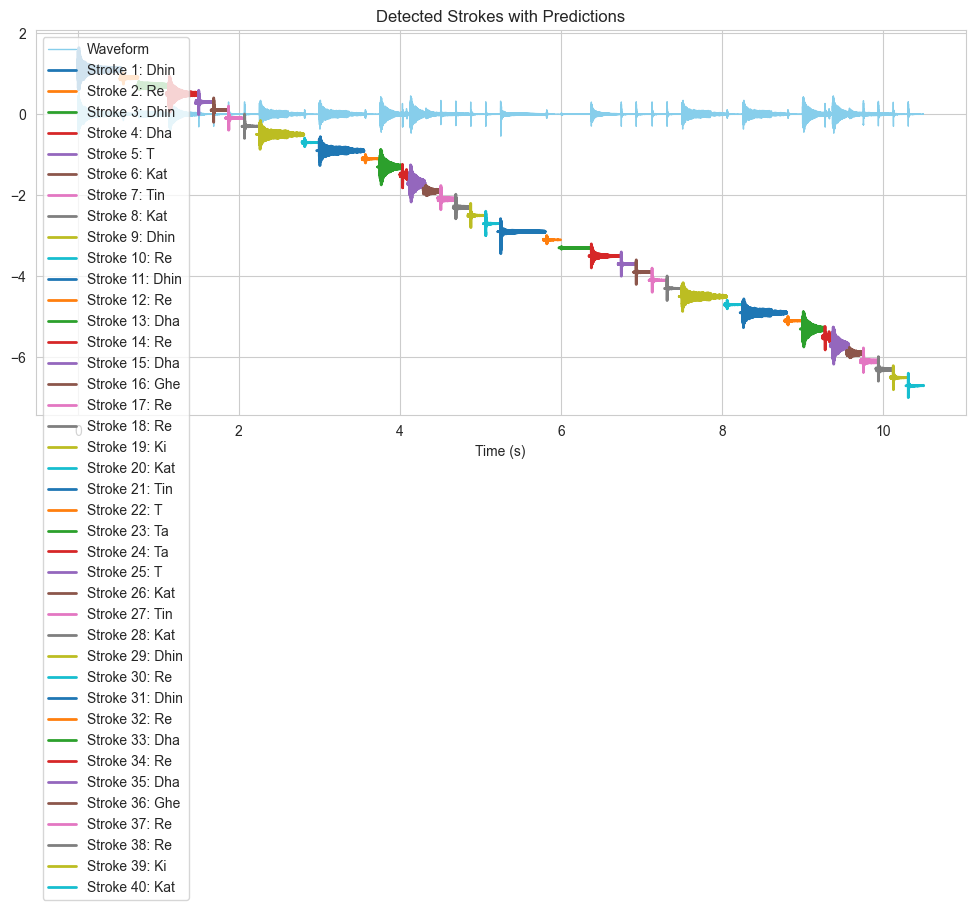

Processing: Kalawati (9.5).wav
Detected 17 strokes
Stroke 1: Predicted → Dhin (dB: -6.75)
Stroke 2: Predicted → Kat (dB: -10.23)
Stroke 3: Predicted → Kat (dB: -10.39)
Stroke 4: Predicted → Ki (dB: -10.36)
Stroke 5: Predicted → Kat (dB: -10.39)
Stroke 6: Predicted → Dhin (dB: -8.70)
Stroke 7: Predicted → Ta (dB: -10.81)
Stroke 8: Predicted → T (dB: -19.13)
Stroke 9: Predicted → Tun (dB: -8.06)
Stroke 10: Predicted → Ta (dB: -10.75)
Stroke 11: Predicted → Ta (dB: -11.48)
Stroke 12: Predicted → T (dB: -10.30)
Stroke 13: Predicted → Tun (dB: -10.38)
Stroke 14: Predicted → T (dB: -8.15)
Stroke 15: Predicted → Dhin (dB: -11.02)
Stroke 16: Predicted → Dhin (dB: -12.78)
Stroke 17: Predicted → Ta (dB: -9.75)


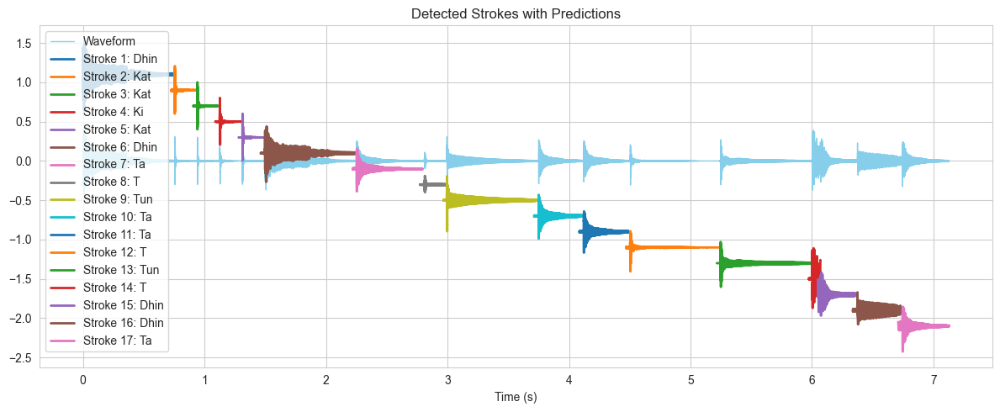

Processing: Chartal-ki-Sawari (11).wav
Detected 21 strokes
Stroke 1: Predicted → Dhin (dB: -8.41)
Stroke 2: Predicted → Kat (dB: -10.32)
Stroke 3: Predicted → Kat (dB: -10.36)
Stroke 4: Predicted → Ki (dB: -10.29)
Stroke 5: Predicted → Kat (dB: -10.29)
Stroke 6: Predicted → Dhin (dB: -10.35)
Stroke 7: Predicted → Ta (dB: -10.74)
Stroke 8: Predicted → T (dB: -19.32)
Stroke 9: Predicted → Tun (dB: -8.64)
Stroke 10: Predicted → Ta (dB: -10.70)
Stroke 11: Predicted → Ta (dB: -10.95)
Stroke 12: Predicted → T (dB: -10.35)
Stroke 13: Predicted → Tun (dB: -10.37)
Stroke 14: Predicted → T (dB: -10.02)
Stroke 15: Predicted → Dhin (dB: -11.10)
Stroke 16: Predicted → Dhin (dB: -17.08)
Stroke 17: Predicted → Ta (dB: -10.31)
Stroke 18: Predicted → T (dB: -10.00)
Stroke 19: Predicted → Dhin (dB: -11.14)
Stroke 20: Predicted → Dhin (dB: -13.56)
Stroke 21: Predicted → Ta (dB: -10.77)


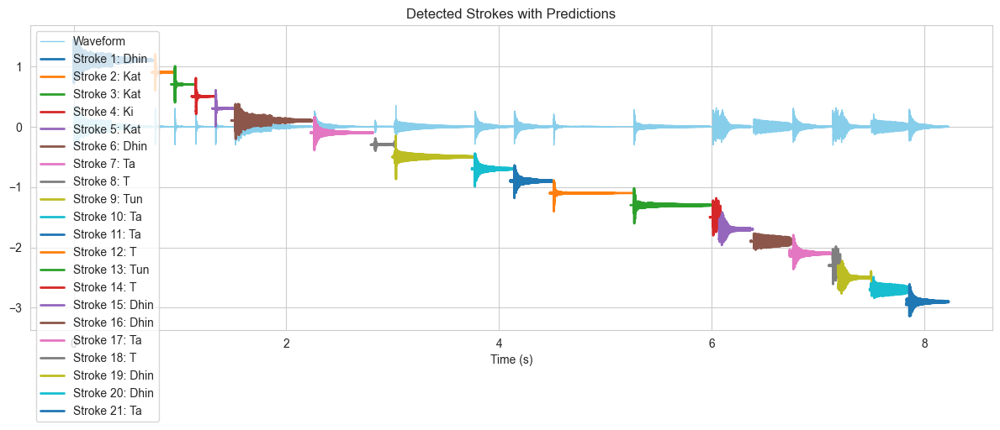

Processing: Rudra Taal (11).wav
Detected 18 strokes
Stroke 1: Predicted → Dha (dB: -5.03)
Stroke 2: Predicted → Kat (dB: -10.10)
Stroke 3: Predicted → Dha (dB: -6.97)
Stroke 4: Predicted → T (dB: -10.11)
Stroke 5: Predicted → Kat (dB: -10.34)
Stroke 6: Predicted → Ki (dB: -10.37)
Stroke 7: Predicted → Kat (dB: -10.29)
Stroke 8: Predicted → Dhin (dB: -8.67)
Stroke 9: Predicted → Ta (dB: -10.82)
Stroke 10: Predicted → T (dB: -10.29)
Stroke 11: Predicted → Kat (dB: -10.39)
Stroke 12: Predicted → Ki (dB: -10.34)
Stroke 13: Predicted → Kat (dB: -10.30)
Stroke 14: Predicted → Tun (dB: -8.22)
Stroke 15: Predicted → Ta (dB: -11.17)
Stroke 16: Predicted → Ta (dB: -10.70)
Stroke 17: Predicted → T (dB: -10.30)
Stroke 18: Predicted → Tun (dB: -10.39)


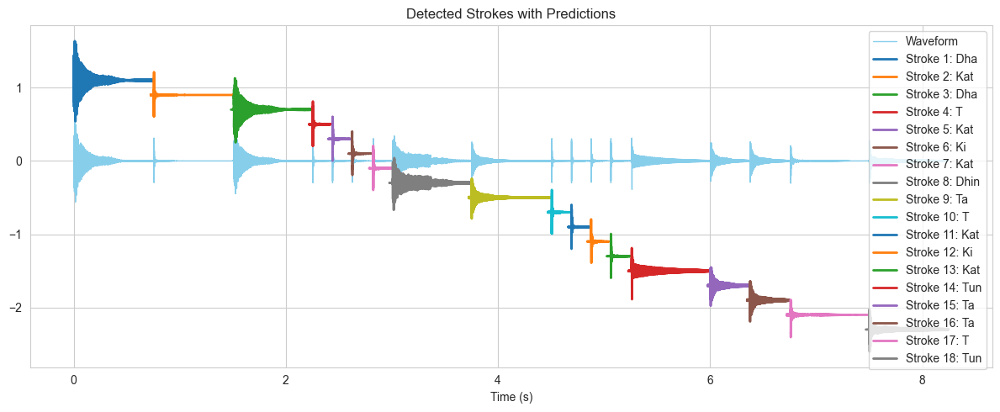

Processing: Addha Taal (16).wav
Detected 20 strokes
Stroke 1: Predicted → Dha (dB: -4.65)
Stroke 2: Predicted → Dhin (dB: -10.08)
Stroke 3: Predicted → Dhin (dB: -22.17)
Stroke 4: Predicted → Dha (dB: -6.94)
Stroke 5: Predicted → T (dB: -23.06)
Stroke 6: Predicted → Dha (dB: -6.93)
Stroke 7: Predicted → Dhin (dB: -10.09)
Stroke 8: Predicted → Re (dB: -21.79)
Stroke 9: Predicted → Dha (dB: -6.96)
Stroke 10: Predicted → T (dB: -23.05)
Stroke 11: Predicted → Dha (dB: -6.93)
Stroke 12: Predicted → Tin (dB: -7.11)
Stroke 13: Predicted → T (dB: -25.32)
Stroke 14: Predicted → Ta (dB: -10.86)
Stroke 15: Predicted → Tin (dB: -25.33)
Stroke 16: Predicted → Ta (dB: -11.05)
Stroke 17: Predicted → Dhin (dB: -10.08)
Stroke 18: Predicted → Re (dB: -22.08)
Stroke 19: Predicted → Dha (dB: -6.98)
Stroke 20: Predicted → T (dB: -23.03)


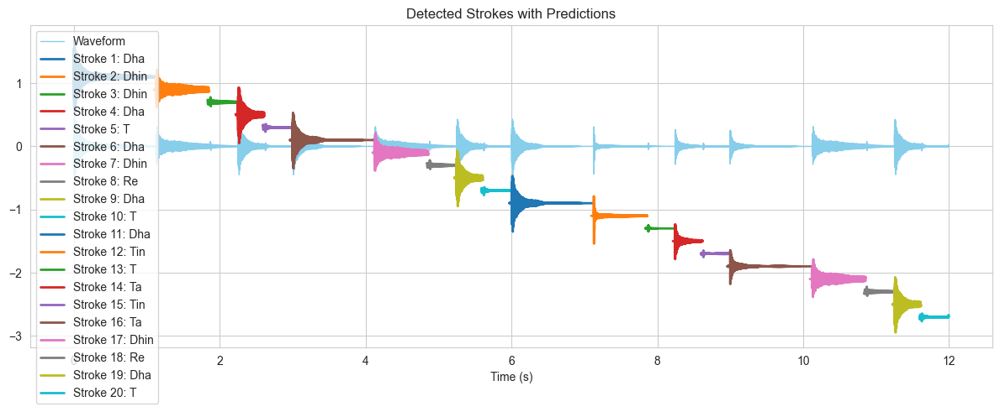

Processing: Chachar (16).wav
Detected 23 strokes
Stroke 1: Predicted → Dha (dB: -5.05)
Stroke 2: Predicted → Kat (dB: -16.44)
Stroke 3: Predicted → Dhin (dB: -10.85)
Stroke 4: Predicted → Dhin (dB: -25.41)
Stroke 5: Predicted → Dha (dB: -7.01)
Stroke 6: Predicted → Tin (dB: -19.36)
Stroke 7: Predicted → Dha (dB: -8.32)
Stroke 8: Predicted → Dha (dB: -6.96)
Stroke 9: Predicted → Tin (dB: -8.44)
Skipping stroke 10: below dB threshold (-31.42 dB).
Stroke 11: Predicted → Ta (dB: -10.87)
Stroke 12: Predicted → T (dB: -16.35)
Stroke 13: Predicted → Tin (dB: -8.61)
Skipping stroke 14: below dB threshold (-31.48 dB).
Stroke 15: Predicted → Dha (dB: -6.98)
Stroke 16: Predicted → Tin (dB: -19.20)
Stroke 17: Predicted → Dha (dB: -8.33)
Stroke 18: Predicted → Dha (dB: -6.94)
Stroke 19: Predicted → Dhin (dB: -10.88)
Stroke 20: Predicted → Re (dB: -10.23)
Stroke 21: Predicted → Kat (dB: -10.24)
Stroke 22: Predicted → Ki (dB: -10.41)
Stroke 23: Predicted → Kat (dB: -10.40)


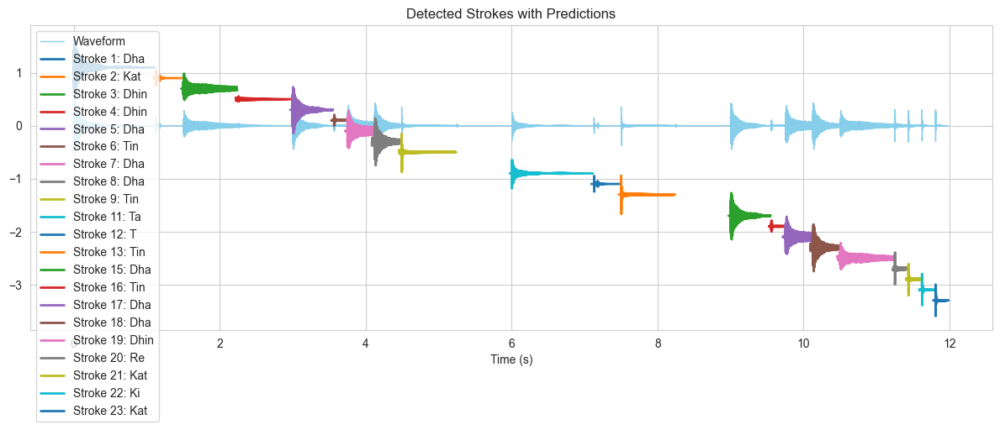

Processing: Ada Chautaal (14).wav
Detected 32 strokes
Stroke 1: Predicted → Dhin (dB: -5.30)
Stroke 2: Predicted → Kat (dB: -10.24)
Stroke 3: Predicted → Kat (dB: -10.40)
Stroke 4: Predicted → Ki (dB: -10.40)
Stroke 5: Predicted → Kat (dB: -10.25)
Stroke 6: Predicted → Dhin (dB: -8.69)
Stroke 7: Predicted → Re (dB: -19.31)
Stroke 8: Predicted → Ta (dB: -11.28)
Stroke 9: Predicted → Ta (dB: -10.58)
Stroke 10: Predicted → Tun (dB: -8.12)
Stroke 11: Predicted → Ta (dB: -10.45)
Stroke 12: Predicted → Ta (dB: -13.36)
Stroke 13: Predicted → Na (dB: -13.51)
Stroke 14: Predicted → Dha (dB: -10.05)
Stroke 15: Predicted → Tun (dB: -10.38)
Stroke 16: Predicted → Kat (dB: -6.83)
Stroke 17: Predicted → Kat (dB: -10.24)
Stroke 18: Predicted → Ki (dB: -10.43)
Stroke 19: Predicted → T (dB: -10.39)
Stroke 20: Predicted → Dhin (dB: -8.68)
Stroke 21: Predicted → Re (dB: -19.15)
Stroke 22: Predicted → Ta (dB: -10.69)
Stroke 23: Predicted → Ta (dB: -10.62)
Stroke 24: Predicted → Dhin (dB: -8.81)
Stroke 25:

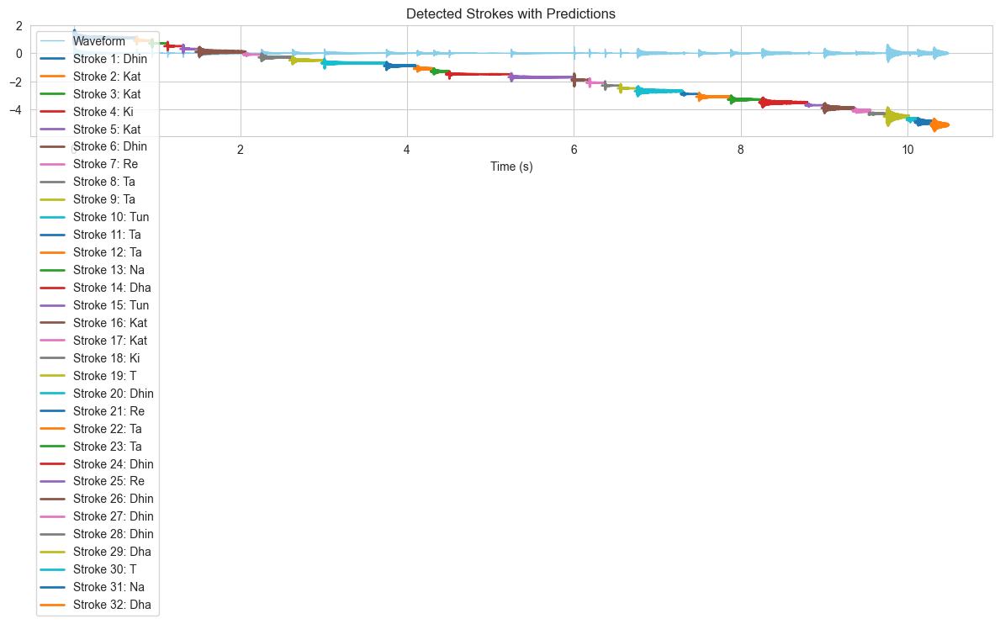

Processing: Dakshinatya Rupak (6).wav
Detected 11 strokes
Stroke 1: Predicted → Dha (dB: -5.02)
Stroke 2: Predicted → Dhin (dB: -12.90)
Stroke 3: Predicted → Re (dB: -16.39)
Stroke 4: Predicted → Dhin (dB: -8.20)
Stroke 5: Predicted → Dhin (dB: -10.74)
Stroke 6: Predicted → Dha (dB: -9.36)
Stroke 7: Predicted → Dhin (dB: -12.79)
Stroke 8: Predicted → Re (dB: -16.39)
Stroke 9: Predicted → Ta (dB: -10.38)
Stroke 10: Predicted → Ta (dB: -10.92)
Stroke 11: Predicted → Re (dB: -20.06)


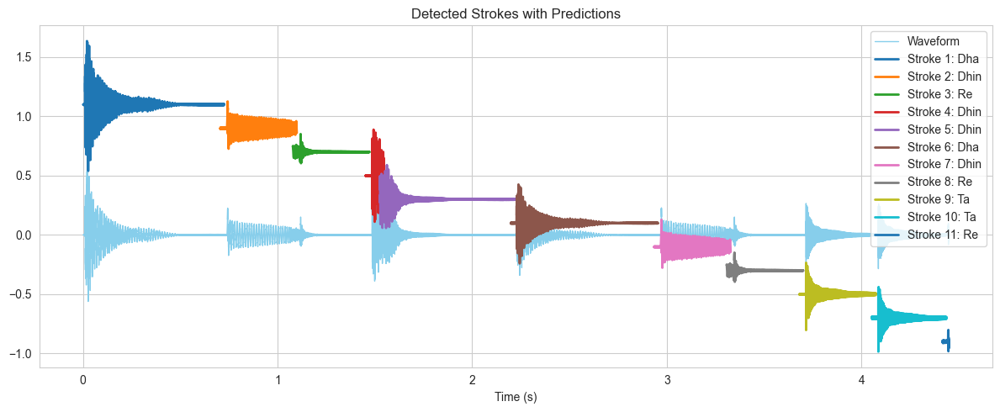

Processing: Moghuli (7).wav
Added onset at 0s manually (initial dB: -3.29)
Detected 9 strokes
Skipping stroke 1: below dB threshold (-100.00 dB).
Stroke 2: Predicted → Tin (dB: -3.29)
Stroke 3: Predicted → Ta (dB: -10.34)
Stroke 4: Predicted → Tin (dB: -25.52)
Stroke 5: Predicted → Dhin (dB: -7.27)
Stroke 6: Predicted → Dhin (dB: -12.50)
Stroke 7: Predicted → Ta (dB: -10.83)
Stroke 8: Predicted → Ta (dB: -10.45)
Stroke 9: Predicted → Tin (dB: -25.56)


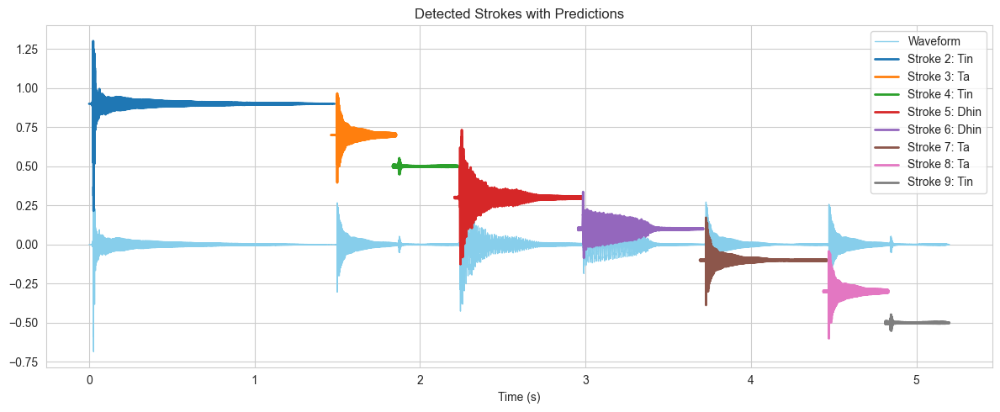

Processing: Neel Taal (7.5).wav
Detected 18 strokes
Stroke 1: Predicted → Tin (dB: -3.27)
Stroke 2: Predicted → Ki (dB: -8.48)
Stroke 3: Predicted → Ki (dB: -17.12)
Stroke 4: Predicted → Tin (dB: -5.17)
Stroke 5: Predicted → Tin (dB: -8.63)
Stroke 6: Predicted → Ta (dB: -11.23)
Stroke 7: Predicted → Tin (dB: -19.33)
Stroke 8: Predicted → Dhin (dB: -8.80)
Stroke 9: Predicted → Re (dB: -19.17)
Stroke 10: Predicted → Ta (dB: -10.70)
Stroke 11: Predicted → Tin (dB: -19.42)
Stroke 12: Predicted → Tin (dB: -19.48)
Stroke 13: Predicted → Dhin (dB: -8.77)
Stroke 14: Predicted → Na (dB: -11.47)
Stroke 15: Predicted → T (dB: -10.04)
Stroke 16: Predicted → Ghe (dB: -12.08)
Stroke 17: Predicted → Dhin (dB: -10.90)
Stroke 18: Predicted → Na (dB: -9.96)


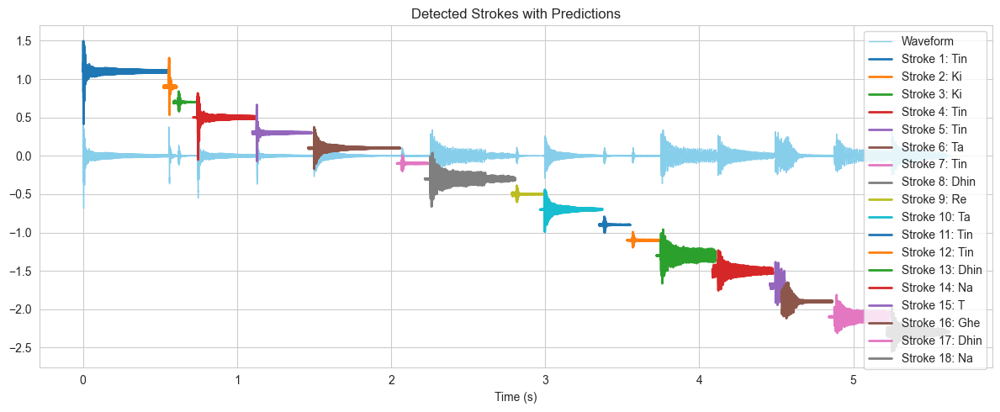

Processing: Deepchandi (14).wav
Detected 18 strokes
Stroke 1: Predicted → Dha (dB: -5.06)
Stroke 2: Predicted → Tin (dB: -23.42)
Stroke 3: Predicted → Dhin (dB: -10.91)
Stroke 4: Predicted → Dha (dB: -6.97)
Stroke 5: Predicted → Tin (dB: -25.07)
Stroke 6: Predicted → Dha (dB: -8.31)
Stroke 7: Predicted → Dha (dB: -6.94)
Stroke 8: Predicted → Tin (dB: -8.43)
Stroke 9: Predicted → Ta (dB: -11.21)
Stroke 10: Predicted → Tin (dB: -25.36)
Stroke 11: Predicted → Tin (dB: -8.53)
Stroke 12: Predicted → Dha (dB: -6.97)
Stroke 13: Predicted → Tin (dB: -25.35)
Stroke 14: Predicted → Dha (dB: -8.33)
Stroke 15: Predicted → Dha (dB: -6.94)
Stroke 16: Predicted → Dhin (dB: -10.87)
Stroke 17: Predicted → Dhin (dB: -17.42)
Stroke 18: Predicted → Dhin (dB: -18.85)


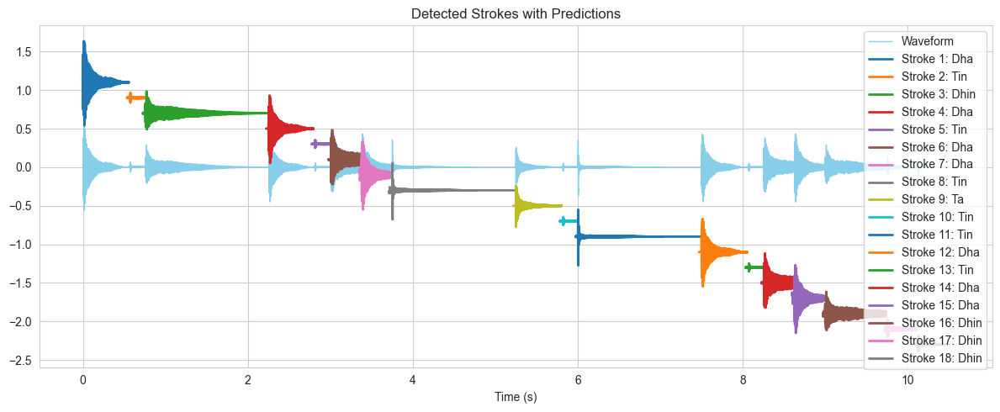

Processing: Teentaal (16).wav
Detected 16 strokes
Stroke 1: Predicted → Dha (dB: -3.11)
Stroke 2: Predicted → Dhin (dB: -10.23)
Stroke 3: Predicted → Dhin (dB: -10.06)
Stroke 4: Predicted → Dha (dB: -7.05)
Stroke 5: Predicted → Dha (dB: -6.92)
Stroke 6: Predicted → Dhin (dB: -10.16)
Stroke 7: Predicted → Dhin (dB: -10.01)
Stroke 8: Predicted → Dha (dB: -7.02)
Stroke 9: Predicted → Dha (dB: -6.93)
Stroke 10: Predicted → Tin (dB: -5.03)
Stroke 11: Predicted → Tin (dB: -5.32)
Stroke 12: Predicted → Ta (dB: -11.33)
Stroke 13: Predicted → Ta (dB: -11.02)
Stroke 14: Predicted → Dhin (dB: -10.16)
Stroke 15: Predicted → Dhin (dB: -10.03)
Stroke 16: Predicted → Dha (dB: -5.07)


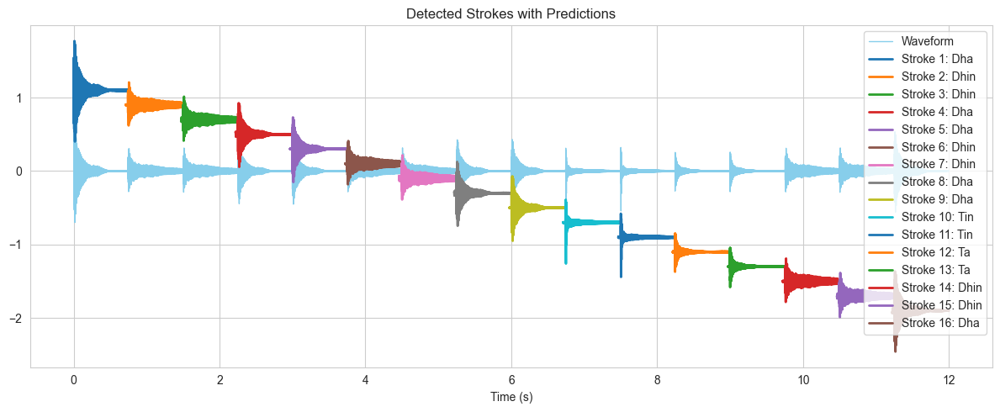

Processing: Rupak (7).wav
Detected 10 strokes
Stroke 1: Predicted → Tin (dB: -4.29)
Stroke 2: Predicted → Tin (dB: -5.39)
Stroke 3: Predicted → Ta (dB: -10.92)
Stroke 4: Predicted → Tin (dB: -25.45)
Stroke 5: Predicted → Dhin (dB: -8.78)
Stroke 6: Predicted → Na (dB: -11.01)
Stroke 7: Predicted → T (dB: -24.78)
Stroke 8: Predicted → Dhin (dB: -8.69)
Stroke 9: Predicted → Na (dB: -11.00)
Stroke 10: Predicted → T (dB: -24.50)


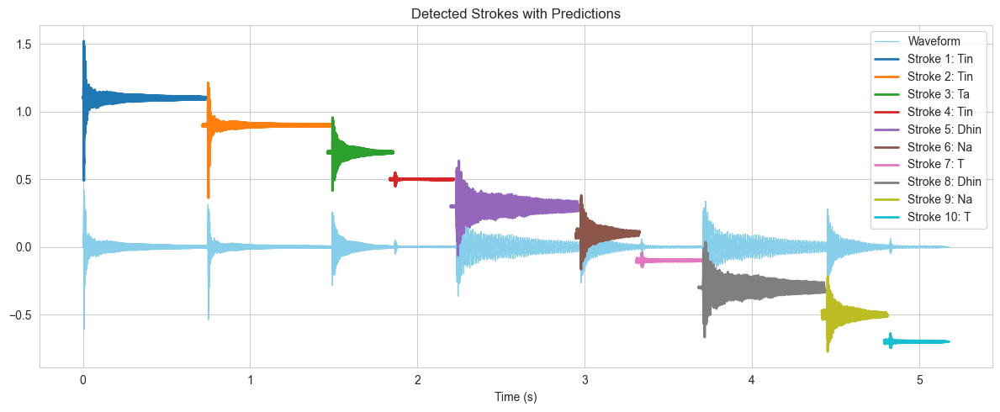

Processing: Dadra (6).wav
Detected 8 strokes
Stroke 1: Predicted → Dha (dB: -5.02)
Stroke 2: Predicted → Dhin (dB: -12.81)
Stroke 3: Predicted → Ta (dB: -11.18)
Stroke 4: Predicted → Tin (dB: -25.52)
Stroke 5: Predicted → Dha (dB: -6.92)
Stroke 6: Predicted → Tin (dB: -8.48)
Stroke 7: Predicted → Ta (dB: -10.94)
Stroke 8: Predicted → Tin (dB: -25.29)


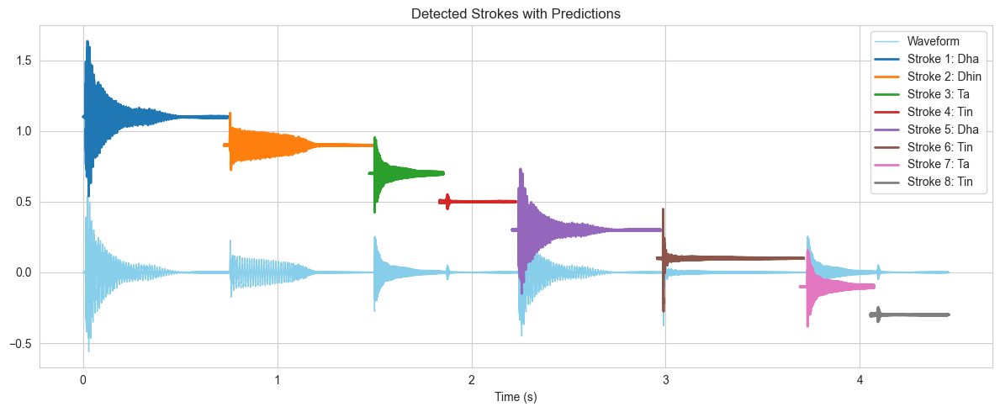

Processing: Sardha Rupak (10.5).wav
Detected 15 strokes
Stroke 1: Predicted → Tin (dB: -3.17)
Stroke 2: Predicted → Tin (dB: -5.23)
Stroke 3: Predicted → Ta (dB: -11.06)
Stroke 4: Predicted → Dhin (dB: -8.68)
Stroke 5: Predicted → Dha (dB: -7.01)
Stroke 6: Predicted → T (dB: -10.21)
Stroke 7: Predicted → Kat (dB: -10.29)
Stroke 8: Predicted → Ki (dB: -10.29)
Stroke 9: Predicted → Kat (dB: -10.42)
Stroke 10: Predicted → Dhin (dB: -8.68)
Stroke 11: Predicted → Dha (dB: -6.95)
Stroke 12: Predicted → T (dB: -10.28)
Stroke 13: Predicted → Kat (dB: -10.35)
Stroke 14: Predicted → Ki (dB: -10.49)
Stroke 15: Predicted → Kat (dB: -10.36)


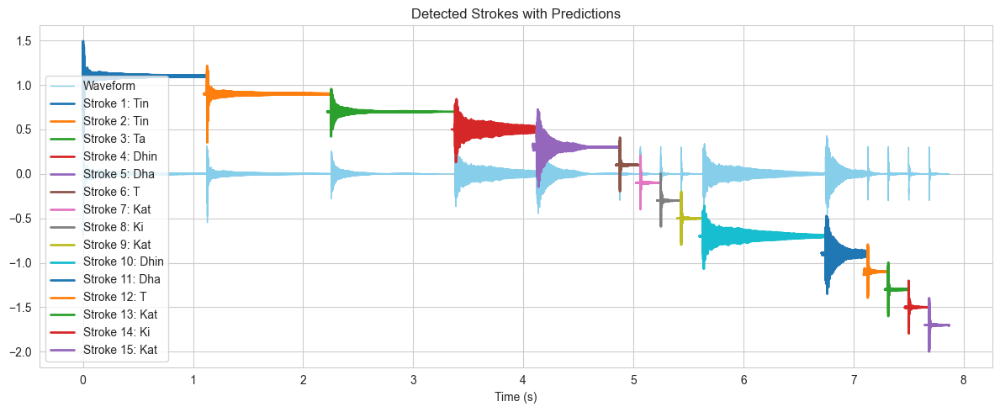

Processing: Sasthi (6).wav
Detected 11 strokes
Stroke 1: Predicted → Dhin (dB: -6.76)
Stroke 2: Predicted → Dhin (dB: -8.66)
Stroke 3: Predicted → Dha (dB: -7.03)
Stroke 4: Predicted → Ghe (dB: -17.43)
Stroke 5: Predicted → Re (dB: -9.77)
Stroke 6: Predicted → Re (dB: -10.10)
Stroke 7: Predicted → Ki (dB: -10.50)
Stroke 8: Predicted → Kat (dB: -10.34)
Stroke 9: Predicted → Dhin (dB: -8.72)
Stroke 10: Predicted → Na (dB: -10.84)
Stroke 11: Predicted → Na (dB: -10.94)


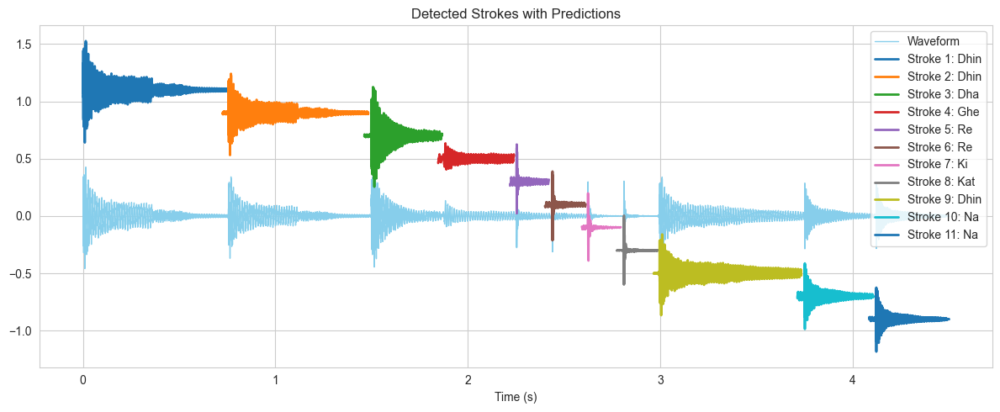

Processing: Tilwada (16).wav
Detected 24 strokes
Stroke 1: Predicted → Dha (dB: -2.72)
Stroke 2: Predicted → Re (dB: -9.45)
Stroke 3: Predicted → Re (dB: -9.99)
Stroke 4: Predicted → Ki (dB: -10.33)
Stroke 5: Predicted → Kat (dB: -10.31)
Stroke 6: Predicted → Dhin (dB: -10.09)
Stroke 7: Predicted → Dhin (dB: -10.04)
Stroke 8: Predicted → Dha (dB: -7.03)
Stroke 9: Predicted → Dha (dB: -8.32)
Stroke 10: Predicted → Dha (dB: -7.66)
Stroke 11: Predicted → Tin (dB: -4.97)
Stroke 12: Predicted → Tin (dB: -5.20)
Stroke 13: Predicted → Ta (dB: -10.59)
Stroke 14: Predicted → Kat (dB: -10.34)
Stroke 15: Predicted → Kat (dB: -10.32)
Stroke 16: Predicted → Ki (dB: -10.42)
Stroke 17: Predicted → Kat (dB: -10.32)
Stroke 18: Predicted → Dhin (dB: -10.09)
Stroke 19: Predicted → Dhin (dB: -10.01)
Stroke 20: Predicted → Dha (dB: -7.02)
Stroke 21: Predicted → Dha (dB: -8.32)
Stroke 22: Predicted → Dha (dB: -7.69)
Stroke 23: Predicted → Dhin (dB: -10.06)
Stroke 24: Predicted → Dhin (dB: -8.67)


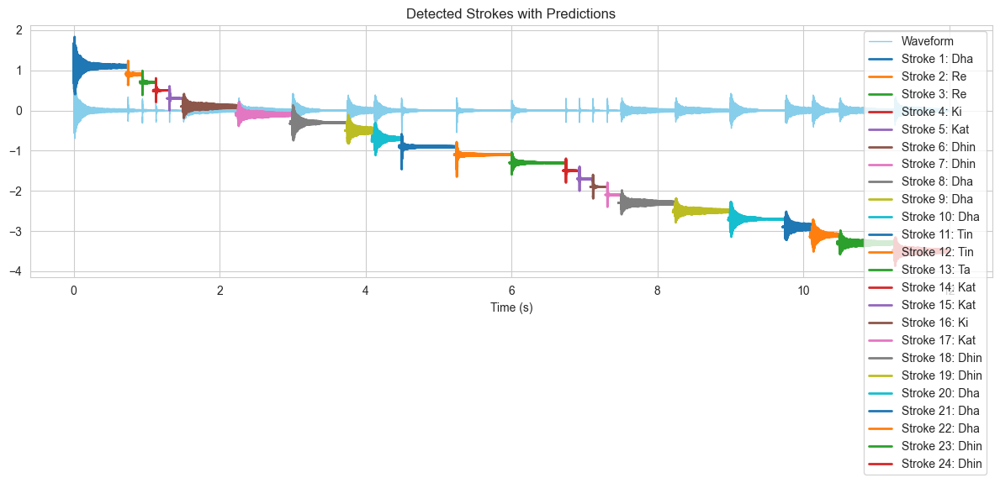

Processing: Gajamukha Taal (16).wav
Detected 22 strokes
Stroke 1: Predicted → Dhin (dB: -6.77)
Stroke 2: Predicted → Kat (dB: -10.37)
Stroke 3: Predicted → Kat (dB: -10.36)
Stroke 4: Predicted → Ki (dB: -10.37)
Stroke 5: Predicted → Kat (dB: -10.36)
Stroke 6: Predicted → Dhin (dB: -10.10)
Stroke 7: Predicted → Na (dB: -10.87)
Stroke 8: Predicted → Tun (dB: -8.10)
Stroke 9: Predicted → Ta (dB: -10.92)
Stroke 10: Predicted → Ta (dB: -11.01)
Stroke 11: Predicted → Dhin (dB: -10.27)
Stroke 12: Predicted → Tun (dB: -10.39)
Stroke 13: Predicted → Kat (dB: -10.31)
Stroke 14: Predicted → Kat (dB: -10.39)
Stroke 15: Predicted → Ki (dB: -10.29)
Stroke 16: Predicted → Kat (dB: -10.27)
Stroke 17: Predicted → Dhin (dB: -10.07)
Stroke 18: Predicted → Na (dB: -10.73)
Stroke 19: Predicted → Dhin (dB: -10.16)
Stroke 20: Predicted → Dhin (dB: -10.07)
Stroke 21: Predicted → Na (dB: -10.97)
Stroke 22: Predicted → Na (dB: -10.26)


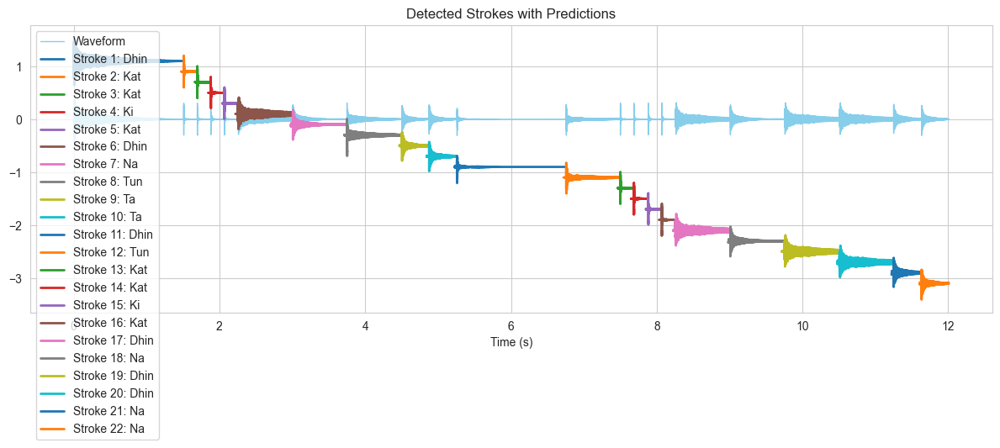

Processing: Sunand Taal (9.5).wav
Detected 19 strokes
Stroke 1: Predicted → Dhin (dB: -5.38)
Stroke 2: Predicted → T (dB: -17.50)
Stroke 3: Predicted → Ta (dB: -11.16)
Stroke 4: Predicted → Tin (dB: -19.33)
Stroke 5: Predicted → Dhin (dB: -8.80)
Stroke 6: Predicted → Re (dB: -19.17)
Stroke 7: Predicted → Dhin (dB: -8.68)
Stroke 8: Predicted → Re (dB: -19.13)
Stroke 9: Predicted → Ta (dB: -11.14)
Stroke 10: Predicted → T (dB: -19.28)
Stroke 11: Predicted → Tin (dB: -5.30)
Stroke 12: Predicted → T (dB: -19.42)
Stroke 13: Predicted → Ta (dB: -10.85)
Stroke 14: Predicted → Tin (dB: -19.33)
Stroke 15: Predicted → Dhin (dB: -8.77)
Stroke 16: Predicted → Na (dB: -11.38)
Stroke 17: Predicted → Dhin (dB: -7.40)
Stroke 18: Predicted → Dhin (dB: -10.91)
Stroke 19: Predicted → Na (dB: -9.78)


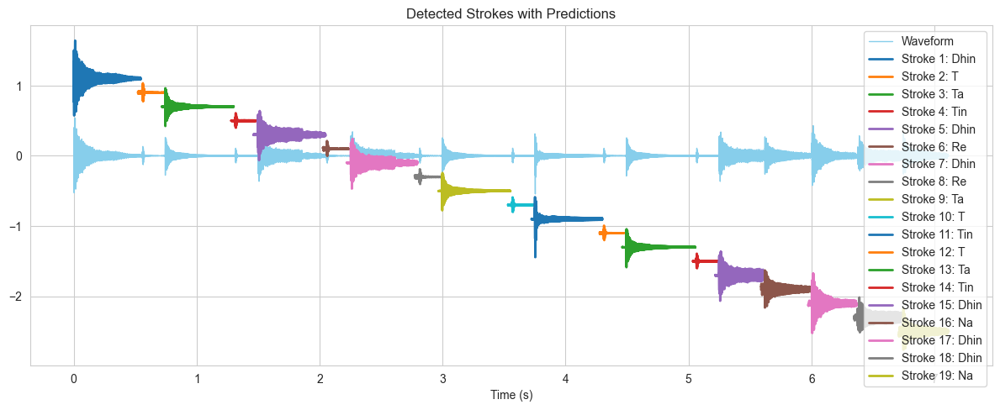

Processing: ektaal (12).wav
Detected 28 strokes
Stroke 1: Predicted → Dhin (dB: -5.34)
Stroke 2: Predicted → Re (dB: -23.74)
Stroke 3: Predicted → Dhin (dB: -10.35)
Stroke 4: Predicted → Re (dB: -25.05)
Stroke 5: Predicted → Dha (dB: -7.05)
Stroke 6: Predicted → Dha (dB: -8.26)
Stroke 7: Predicted → T (dB: -10.32)
Stroke 8: Predicted → Re (dB: -9.62)
Stroke 9: Predicted → Kat (dB: -10.08)
Stroke 10: Predicted → Ki (dB: -10.52)
Stroke 11: Predicted → Kat (dB: -10.35)
Stroke 12: Predicted → Tun (dB: -8.24)
Stroke 13: Predicted → Ta (dB: -10.81)
Stroke 14: Predicted → Na (dB: -10.73)
Stroke 15: Predicted → Na (dB: -11.11)
Stroke 16: Predicted → T (dB: -9.72)
Stroke 17: Predicted → Tun (dB: -10.38)
Stroke 18: Predicted → Dha (dB: -7.00)
Stroke 19: Predicted → Dha (dB: -8.27)
Stroke 20: Predicted → T (dB: -10.00)
Stroke 21: Predicted → Re (dB: -9.62)
Stroke 22: Predicted → Kat (dB: -10.02)
Stroke 23: Predicted → Ki (dB: -10.55)
Stroke 24: Predicted → Kat (dB: -10.28)
Stroke 25: Predicted → 

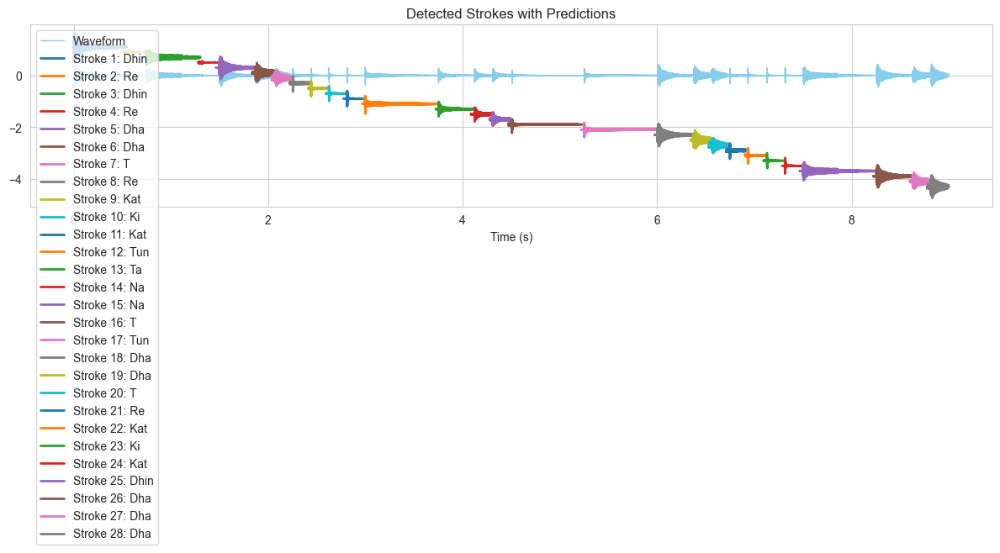

Processing: Shiva Taal (9).wav
Detected 21 strokes
Stroke 1: Predicted → Dhin (dB: -6.78)
Stroke 2: Predicted → Dhin (dB: -8.64)
Stroke 3: Predicted → Dha (dB: -7.03)
Stroke 4: Predicted → Ghe (dB: -17.46)
Stroke 5: Predicted → Re (dB: -9.94)
Stroke 6: Predicted → Re (dB: -10.02)
Stroke 7: Predicted → Ki (dB: -10.39)
Stroke 8: Predicted → Kat (dB: -10.38)
Stroke 9: Predicted → Tun (dB: -8.22)
Stroke 10: Predicted → Ta (dB: -10.87)
Stroke 11: Predicted → Na (dB: -11.02)
Stroke 12: Predicted → T (dB: -9.78)
Stroke 13: Predicted → Ta (dB: -10.31)
Stroke 14: Predicted → T (dB: -8.18)
Stroke 15: Predicted → Dhin (dB: -11.02)
Stroke 16: Predicted → Dhin (dB: -12.77)
Stroke 17: Predicted → Ta (dB: -11.07)
Stroke 18: Predicted → T (dB: -8.20)
Stroke 19: Predicted → Dhin (dB: -11.03)
Stroke 20: Predicted → Dhin (dB: -12.82)
Stroke 21: Predicted → Ta (dB: -11.22)


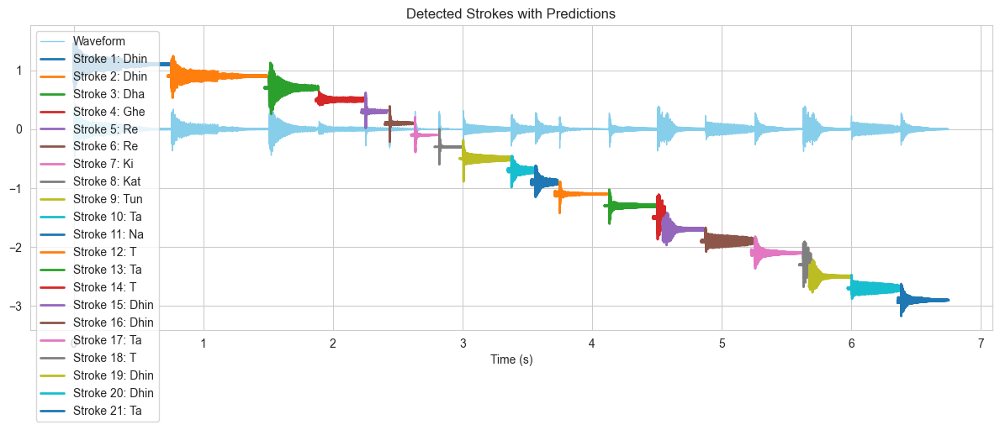

Processing: Matta Taal (9).wav
Detected 16 strokes
Stroke 1: Predicted → Dhin (dB: -6.78)
Stroke 2: Predicted → Kat (dB: -10.44)
Stroke 3: Predicted → Kat (dB: -10.39)
Stroke 4: Predicted → Ki (dB: -10.37)
Stroke 5: Predicted → Kat (dB: -10.37)
Stroke 6: Predicted → Dhin (dB: -8.67)
Stroke 7: Predicted → Ta (dB: -11.33)
Stroke 8: Predicted → Tun (dB: -8.06)
Stroke 9: Predicted → Ta (dB: -11.15)
Stroke 10: Predicted → Ta (dB: -11.52)
Stroke 11: Predicted → Dhin (dB: -7.24)
Stroke 12: Predicted → Dhin (dB: -10.89)
Stroke 13: Predicted → Na (dB: -11.52)
Stroke 14: Predicted → Dhin (dB: -7.38)
Stroke 15: Predicted → Dhin (dB: -10.90)
Stroke 16: Predicted → Na (dB: -11.07)


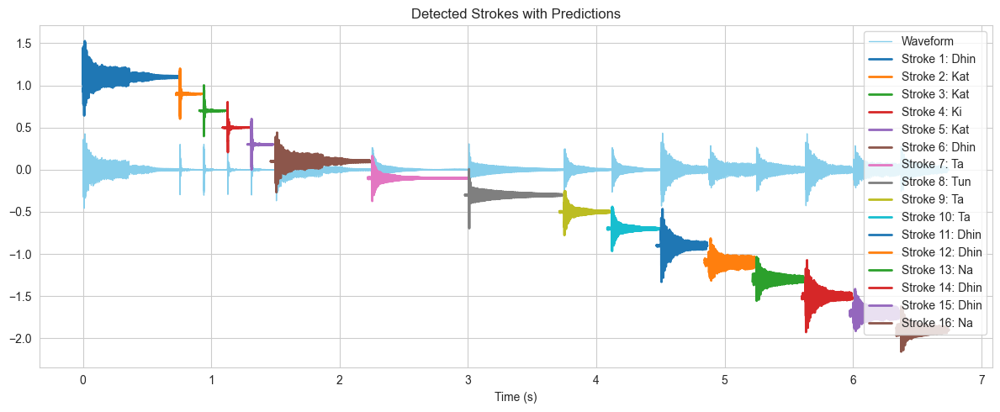

Processing: Pashto (7).wav
Detected 11 strokes
Stroke 1: Predicted → Tin (dB: -3.24)
Stroke 2: Predicted → Tin (dB: -5.30)
Stroke 3: Predicted → Ta (dB: -13.18)
Stroke 4: Predicted → Tin (dB: -10.36)
Stroke 5: Predicted → Kat (dB: -10.20)
Stroke 6: Predicted → Dhin (dB: -8.47)
Stroke 7: Predicted → Ta (dB: -12.78)
Stroke 8: Predicted → Tin (dB: -25.59)
Stroke 9: Predicted → Dhin (dB: -8.23)
Stroke 10: Predicted → Ta (dB: -13.06)
Stroke 11: Predicted → Tin (dB: -25.58)


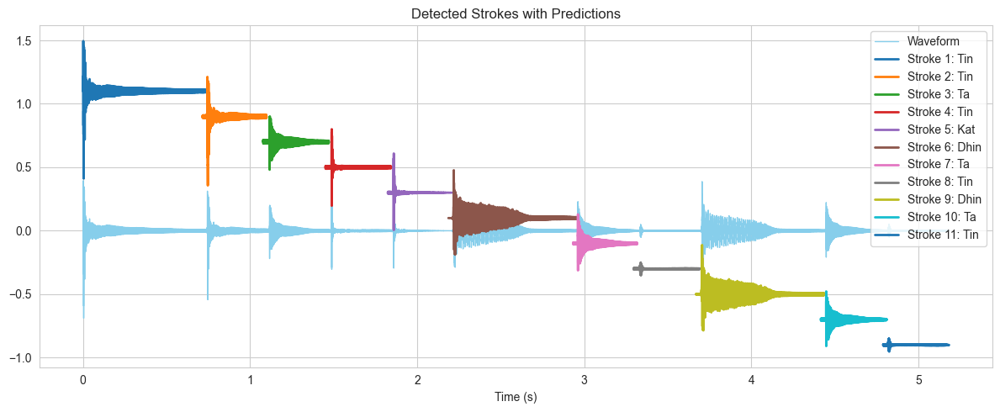

Processing: Keherva (8).wav
Detected 16 strokes
Stroke 1: Predicted → Dha (dB: -5.04)
Stroke 2: Predicted → Ghe (dB: -15.45)
Stroke 3: Predicted → Na (dB: -16.45)
Stroke 4: Predicted → Tin (dB: -9.18)
Stroke 5: Predicted → Ta (dB: -16.78)
Stroke 6: Predicted → Ghe (dB: -17.55)
Stroke 7: Predicted → Dhin (dB: -9.71)
Stroke 8: Predicted → Na (dB: -16.00)
Stroke 9: Predicted → Dha (dB: -6.95)
Stroke 10: Predicted → Ghe (dB: -17.49)
Stroke 11: Predicted → Na (dB: -16.81)
Stroke 12: Predicted → Tin (dB: -9.19)
Stroke 13: Predicted → Ta (dB: -17.28)
Stroke 14: Predicted → Ghe (dB: -17.65)
Stroke 15: Predicted → Dhin (dB: -7.19)
Stroke 16: Predicted → Na (dB: -16.45)


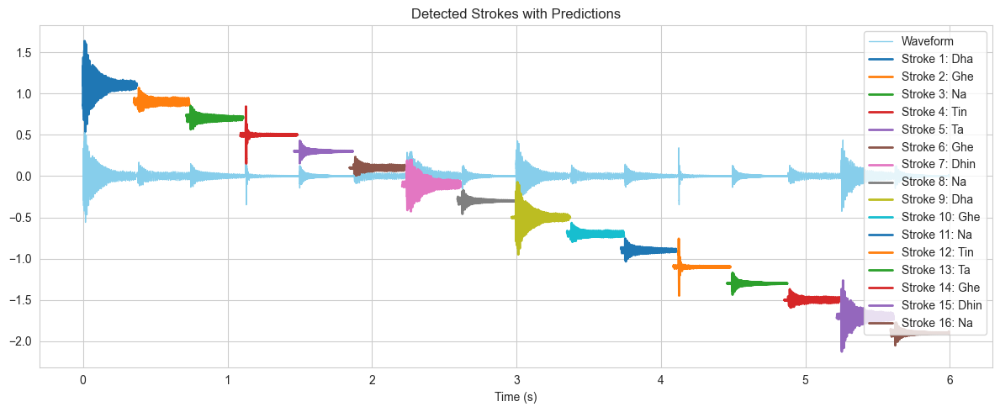

Processing: Ardha Jai Taal (6.5).wav
Detected 18 strokes
Stroke 1: Predicted → Dhin (dB: -5.52)
Stroke 2: Predicted → Dhin (dB: -8.94)
Stroke 3: Predicted → Dha (dB: -6.97)
Stroke 4: Predicted → Ghe (dB: -16.80)
Stroke 5: Predicted → Re (dB: -9.64)
Stroke 6: Predicted → Re (dB: -9.68)
Stroke 7: Predicted → Ki (dB: -10.11)
Stroke 8: Predicted → Re (dB: -10.38)
Stroke 9: Predicted → Tun (dB: -7.95)
Stroke 10: Predicted → Ta (dB: -10.79)
Stroke 11: Predicted → T (dB: -10.34)
Stroke 12: Predicted → Ta (dB: -10.35)
Stroke 13: Predicted → Dhin (dB: -9.85)
Stroke 14: Predicted → Na (dB: -10.58)
Stroke 15: Predicted → Dhin (dB: -9.79)
Stroke 16: Predicted → Dhin (dB: -10.86)
Stroke 17: Predicted → Na (dB: -10.62)
Stroke 18: Predicted → Dha (dB: -17.02)


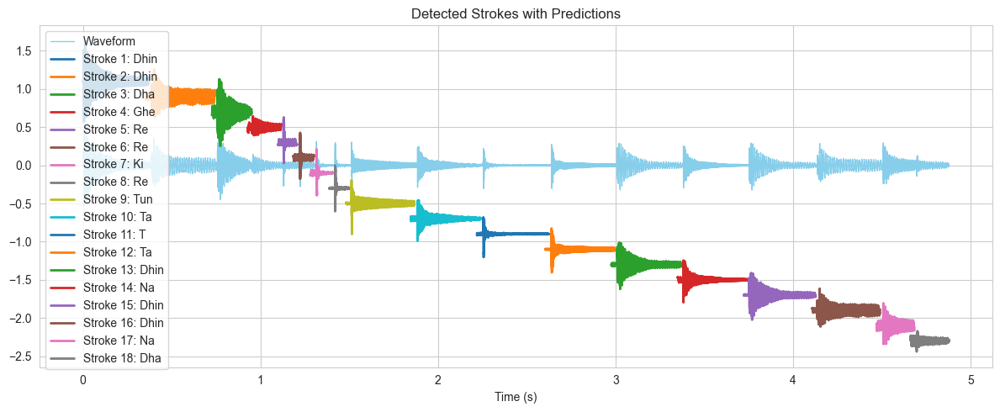

Processing: Firdost (14).wav
Detected 28 strokes
Stroke 1: Predicted → Dhin (dB: -8.40)
Stroke 2: Predicted → Dhin (dB: -10.46)
Stroke 3: Predicted → Dha (dB: -8.55)
Stroke 4: Predicted → Ghe (dB: -17.52)
Stroke 5: Predicted → Re (dB: -9.92)
Stroke 6: Predicted → Kat (dB: -10.11)
Stroke 7: Predicted → Ki (dB: -10.37)
Stroke 8: Predicted → Kat (dB: -10.43)
Stroke 9: Predicted → Tun (dB: -8.65)
Stroke 10: Predicted → Ta (dB: -10.22)
Stroke 11: Predicted → T (dB: -10.49)
Stroke 12: Predicted → Tun (dB: -10.36)
Stroke 13: Predicted → Dhin (dB: -11.04)
Stroke 14: Predicted → Na (dB: -11.27)
Stroke 15: Predicted → T (dB: -10.31)
Stroke 16: Predicted → Tin (dB: -10.34)
Stroke 17: Predicted → Kat (dB: -10.48)
Stroke 18: Predicted → Kat (dB: -10.35)
Stroke 19: Predicted → Ki (dB: -10.39)
Stroke 20: Predicted → Kat (dB: -10.29)
Stroke 21: Predicted → Dhin (dB: -10.87)
Stroke 22: Predicted → Dha (dB: -10.74)
Stroke 23: Predicted → Tin (dB: -10.44)
Stroke 24: Predicted → Dha (dB: -6.90)
Stroke 25:

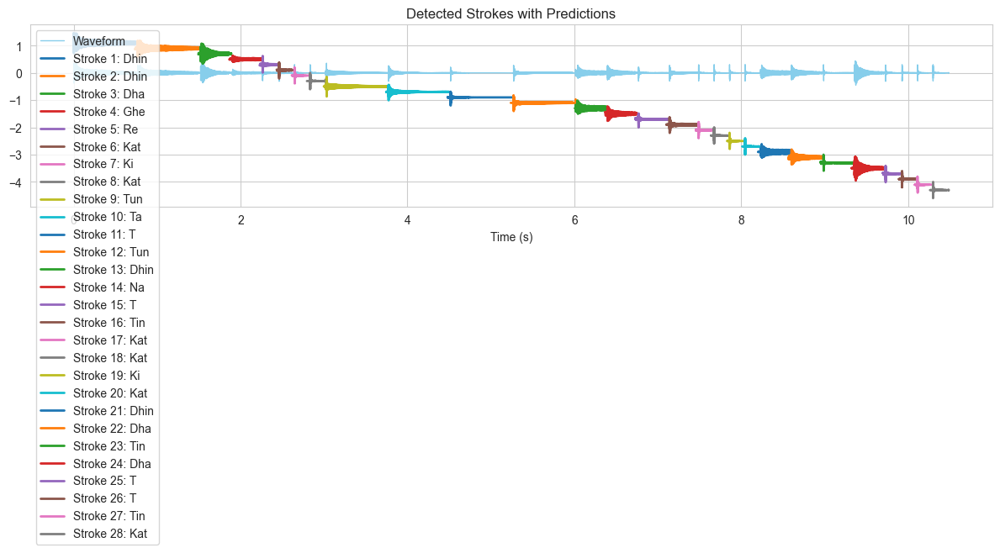

Processing: Ardha Shikhar taal (8.5).wav
Detected 15 strokes
Stroke 1: Predicted → Dhin (dB: -6.76)
Stroke 2: Predicted → Kat (dB: -10.29)
Stroke 3: Predicted → Kat (dB: -10.46)
Stroke 4: Predicted → Ki (dB: -10.41)
Stroke 5: Predicted → Kat (dB: -10.39)
Stroke 6: Predicted → Dhin (dB: -8.68)
Stroke 7: Predicted → Ta (dB: -11.08)
Stroke 8: Predicted → Tun (dB: -8.10)
Stroke 9: Predicted → Ta (dB: -10.63)
Stroke 10: Predicted → Ta (dB: -11.18)
Stroke 11: Predicted → Dhin (dB: -7.29)
Stroke 12: Predicted → Na (dB: -10.63)
Stroke 13: Predicted → Dhin (dB: -10.82)
Stroke 14: Predicted → Dhin (dB: -7.17)
Stroke 15: Predicted → Na (dB: -10.63)


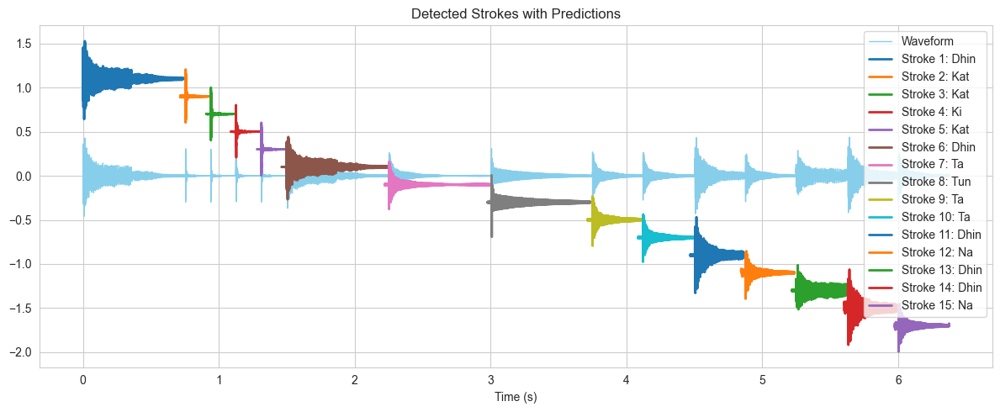

Processing: Soolfaak (10).wav
Detected 17 strokes
Stroke 1: Predicted → Dha (dB: -5.04)
Stroke 2: Predicted → T (dB: -10.22)
Stroke 3: Predicted → Kat (dB: -10.28)
Stroke 4: Predicted → Ki (dB: -10.26)
Stroke 5: Predicted → Kat (dB: -10.29)
Stroke 6: Predicted → Dhin (dB: -8.71)
Stroke 7: Predicted → Ta (dB: -10.97)
Stroke 8: Predicted → Ta (dB: -10.78)
Stroke 9: Predicted → T (dB: -10.33)
Stroke 10: Predicted → Tun (dB: -10.37)
Stroke 11: Predicted → Dha (dB: -6.98)
Stroke 12: Predicted → Dha (dB: -6.91)
Stroke 13: Predicted → Na (dB: -8.58)
Stroke 14: Predicted → Tin (dB: -5.09)
Stroke 15: Predicted → Ta (dB: -11.08)
Stroke 16: Predicted → Na (dB: -10.81)
Stroke 17: Predicted → Tin (dB: -18.64)


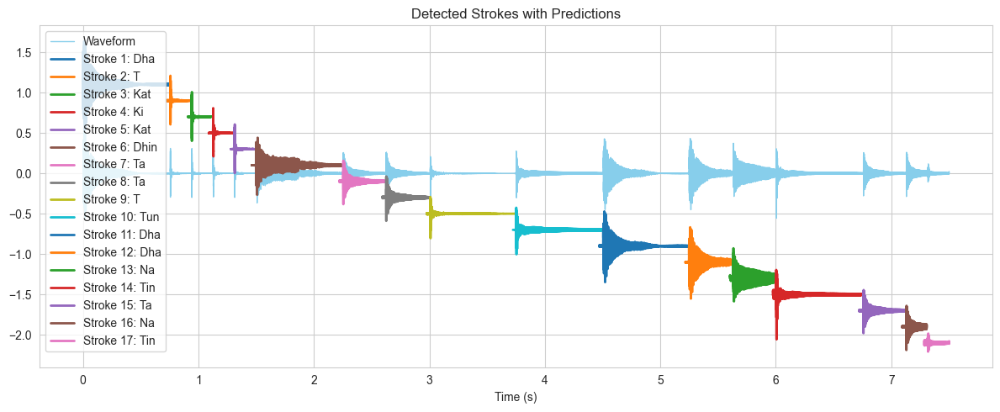

Processing: Bhajani (8).wav
Detected 19 strokes
Stroke 1: Predicted → Dhin (dB: -10.81)
Stroke 2: Predicted → Ki (dB: -10.88)
Stroke 3: Predicted → T (dB: -19.69)
Stroke 4: Predicted → Ta (dB: -10.93)
Stroke 5: Predicted → Dhin (dB: -10.93)
Stroke 6: Predicted → Dhin (dB: -12.65)
Stroke 7: Predicted → Ta (dB: -11.59)
Stroke 8: Predicted → Tin (dB: -16.89)
Stroke 9: Predicted → Dhin (dB: -16.79)
Stroke 10: Predicted → Dhin (dB: -17.66)
Stroke 11: Predicted → Dhin (dB: -12.60)
Stroke 12: Predicted → Kat (dB: -12.76)
Stroke 13: Predicted → Ta (dB: -10.38)
Stroke 14: Predicted → Tin (dB: -8.58)
Stroke 15: Predicted → Tin (dB: -8.60)
Stroke 16: Predicted → Na (dB: -11.00)
Stroke 17: Predicted → Dha (dB: -15.27)
Stroke 18: Predicted → Dhin (dB: -17.03)
Stroke 19: Predicted → Dhin (dB: -17.53)


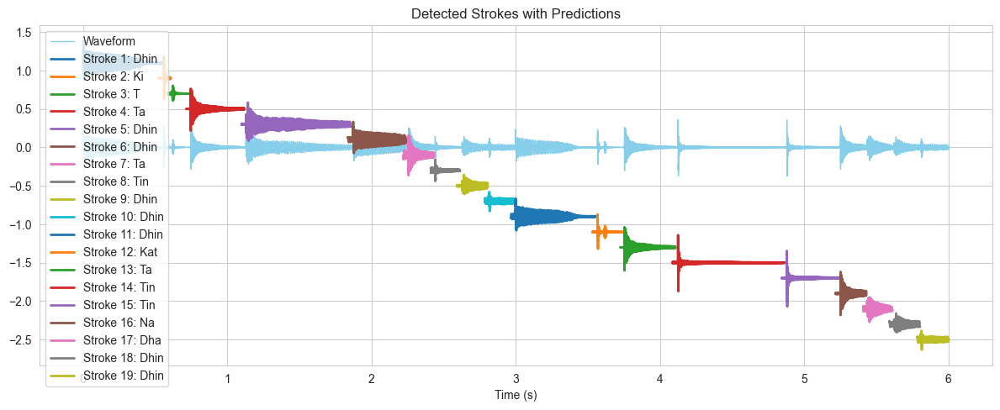

✅ Stroke predictions saved to 'tabla_stroke_predictions_Tabla_PU'


In [46]:
taal_list = "DataSet/TablaPU/"
all_predictions = []

for taal in os.listdir(taal_list):
    if ".wav" in taal:
        print(f"Processing: {taal}")

        # Run your model
        predicted_final, duration_note = predict_tabla_bols(
            file_path=taal_list + taal,
            model=model,
            adjust_length_fn=Adjust_Length,
            target_length=53608
        )

        filename = taal
        predicted_strokes = predicted_final
        durations = duration_note

        # Store strokes and durations with metadata
        for stroke_idx, (stroke, duration) in enumerate(zip(predicted_strokes, durations), start=1):
            all_predictions.append({
                "filename": filename,
                "stroke_index": stroke_idx,
                "stroke": stroke,
                "duration_sec": float(duration)  # make sure duration is float not np.float64
            })

# Convert all predictions to DataFrame
final_df = pd.DataFrame(all_predictions)


final_df.to_csv("tabla_stroke_predictions_model1_Tabla_PU.csv", index=False)

print("✅ Stroke predictions saved to 'tabla_stroke_predictions_Tabla_PU'")

## Appendix:

### Feature Plan Appendix

Optional feature plans:
1. MFCCs and Spectral Centroid
2. Log-Mel-Spec and Spectral Centroid
Replace these preprocess function mentioned above with the ones in the Appendix to try different feature plans

##### Feature Extraction Plan 1: MFCCs + Spectral Centroid

MFCCs, (T, C), 2d
	Pros: suitable for timbre; after DCT, lessen compute complexity
	Cons: loss part of transient characteristic in high frequency

Spectral Centroid, (T, ), 1d
	Pros: suitable for distinguish single note timbre, "Brightness"
	Cons: not sufficient to classify if not cooperate with other features

Returns: 3D array of features with shape (n_features, n_time_frames, n_feature_types)

In [ ]:
# Function to preprocess audio data
def preprocess(audio_data, sample_rate):
    # Normalize the audio data
    if np.max(np.abs(audio_data)) > 0:
        audio_data = audio_data / np.max(np.abs(audio_data))

    # Extract MFCCs (13 coefficients)
    mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=13)

    # Extract Spectral Centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=audio_data, sr=sample_rate)

    # Ensure both features have the same number of time frames
    min_frames = min(mfccs.shape[1], spectral_centroid.shape[1])
    mfccs = mfccs[:, :min_frames]
    spectral_centroid = spectral_centroid[:, :min_frames]

    # Reshape spectral centroid to match MFCC dimensions for proper stacking
    spectral_centroid_reshaped = np.repeat(spectral_centroid, 13, axis=0)[:13, :]

    # Stack features along a new dimension to create a 3D array
    # Shape: (n_features, n_time_frames, n_feature_types)
    features = np.stack([mfccs, spectral_centroid_reshaped], axis=2)

    return features

##### Feature Extraction Plan 2: Log-Mel-spec + Spectral Centroid

Log-Mel-Spectrogram, (T, M), 2d
    Pros:  Direct applicable for CNNs; strengthen low freq part sensations
    Cons: lack phase info, may loss some transient characteristic

Spectral Centroid, (T, ), 1d
	Pros: suitable for distinguish single note timbre, "Brightness"
	Cons: not sufficient to classify if not cooperate with other features

Returns: 3D array of features with shape (n_features, n_time_frames, n_feature_types)

In [ ]:
# Function to preprocess audio data
def preprocess(audio_data, sample_rate):
    # Normalize the audio data
    if np.max(np.abs(audio_data)) > 0:
        audio_data = audio_data / np.max(np.abs(audio_data))

    # Extract log-mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate, n_mels=128)
    log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

    # Extract Spectral Centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=audio_data, sr=sample_rate)

    # Ensure both features have the same number of time frames
    min_frames = min(log_mel_spectrogram.shape[1], spectral_centroid.shape[1])
    log_mel_spectrogram = log_mel_spectrogram[:, :min_frames]
    spectral_centroid = spectral_centroid[:, :min_frames]

    # Reshape spectral centroid to match log-mel spectrogram dimensions for proper stacking
    spectral_centroid_reshaped = np.repeat(spectral_centroid, 128, axis=0)[:128, :]

    # Stack features along a new dimension to create a 3D array
    # Shape: (n_features, n_time_frames, n_feature_types)
    features = np.stack([log_mel_spectrogram, spectral_centroid_reshaped], axis=2)

    return features

''' Change the number of channels in the CNN block when using this feature plan '''

### Onset Detection Strategies (Methods)

In [ ]:
# Trying out different strategies

#### Method 1: Energy Onset Detection

According to Simon Dixon’s 2006 paper "Onset Detection Revisited", this method involves computing the short-term energy of the signal and identifying peaks in its first-order difference (i.e., the derivative of the energy envelope).

In [49]:
# --- ENERGY-BASED ONSET DETECTION FUNCTION ---
def energy_onset_detection(y, sr, frame_length=1024, hop_length=256, threshold=0.05, min_time_diff=0.05):
    energy = np.array([
        np.sum(np.square(y[i:i+frame_length]))
        for i in range(0, len(y)-frame_length, hop_length)
    ])
    energy = energy / np.max(energy)

    distance = int(min_time_diff * sr / hop_length)  # Convert time diff to frames
    peaks, _ = find_peaks(energy, height=threshold, distance=distance)
    onset_samples = peaks * hop_length
    return onset_samples

#### Method 2: hybrid_onsets (Energy + Spectral Flux)

Hybrid Onset Detection combines multiple onset detection functions—such as energy, spectral flux, and phase-based methods—to leverage their complementary strengths and mitigate individual weaknesses.

In [59]:
# Hybrid Onset Detection (Energy + Spectral Flux)
def hybrid_onset_detection(y, sr, hop_length=512, flux_thresh=0.3, energy_thresh=0.3):
    S = np.abs(librosa.stft(y))
    flux = np.sqrt(np.sum(np.diff(S, axis=1)**2, axis=0))
    flux = np.pad(flux, (1, 0)) / np.max(flux)

    frame_length = 2048
    energy = np.array([
        np.sum(np.abs(y[i:i+frame_length])**2)
        for i in range(0, len(y), hop_length)
    ])
    energy = energy / np.max(energy)

    onsets = np.where((flux > flux_thresh) & (energy > energy_thresh))[0]
    return np.array([o * hop_length for o in onsets])

#### Method 4: Weighted Phase Deviation (WPD)

Weighted Phase Deviation (WPD) is an onset detection strategy that focuses on the dynamic behavior of phase across time, as described by Simon Dixon in "Onset Detection Revisited." Unlike amplitude-based methods, WPD leverages the observation that sudden changes in phase—particularly deviations in the expected linear progression of phase—can indicate the presence of an onset.

In [54]:
def compute_wpd_onsets(y, sr, n_fft=2048, hop_length=512, threshold=0.3):
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    phase = np.angle(S)
    mag = np.abs(S)

    # Compute second phase difference
    phase_diff1 = np.diff(phase, axis=1)
    phase_diff2 = np.diff(phase_diff1, axis=1)
    phase_diff2 = np.pad(phase_diff2, ((0, 0), (2, 0)), mode='constant')

    # Weighted by magnitude
    wpd = np.sum(np.abs(mag[:, 2:] * phase_diff2[:, 2:]), axis=0)

    # Normalize and peak-pick
    wpd -= np.mean(wpd)
    wpd /= np.std(wpd) + 1e-8
    peaks = librosa.util.peak_pick(wpd, pre_max=3, post_max=3, pre_avg=3, post_avg=3, delta=threshold, wait=5)

    return librosa.frames_to_samples(peaks, hop_length=hop_length), wpd

#### Method 5: Librosa

The onset detection method in Librosa is a widely used implementation that combines several signal processing techniques to robustly detect musical onsets across a range of instruments and styles.

In [60]:
# Librosa Default Onset Detection
def librosa_onset_detection(y, sr, hop_length=512):
    onset_frames = librosa.onset.onset_detect(
        y=y,
        sr=sr,
        hop_length=hop_length,
        backtrack=True,
        pre_max=5,
        post_max=5,
        pre_avg=5,
        post_avg=5,
        wait=5
    )
    return librosa.frames_to_samples(onset_frames)

### Inference using multiple onset methods

In [64]:
def predict_tabla_bols(file_path, model, note_labels, preprocess_fn, adjust_length_fn,
                       target_length, db_threshold=-40, pre_onset_samples=1000, device='cpu',
                       onset_mode='rcd'):
    y, sr = librosa.load(file_path, sr=None)

    # Choose onset detection method
    if onset_mode == 'energy':
        onset_samples = energy_onset_detection(y, sr)
    elif onset_mode == 'hybrid':
        onset_samples = hybrid_onset_detection(y, sr)
    elif onset_mode == 'wpd':
        onset_samples = compute_wpd_onsets(y, sr)[0]
    elif onset_mode == 'librosa':
        onset_samples = librosa_onset_detection(y, sr)
    else:
        onset_samples, _ = compute_rcd_onsets(y, sr)

    if 0 not in onset_samples:
        onset_samples = np.insert(onset_samples, 0, 0)

    results = []
    for i in range(len(onset_samples) - 1):
        start = max(onset_samples[i] - pre_onset_samples, 0)
        end = onset_samples[i + 1]
        stroke = y[start:end]
        if stroke.shape[0] == 0:
            continue
        stroke_db = librosa.amplitude_to_db([np.max(np.abs(stroke))])[0]
        if stroke_db < db_threshold:
            continue
        adjusted = adjust_length_fn(stroke, target_length)
        features = preprocess_fn(adjusted, sr)
        input_tensor = torch.tensor(features, dtype=torch.float32).unsqueeze(0).to(device)

        model.eval()
        with torch.no_grad():
            output = model(input_tensor)
            pred_index = torch.argmax(output, dim=1).item()
            predicted_bol = note_labels[pred_index]
        results.append(predicted_bol)
    return results




In [66]:
# Example predictions
for mode in ['rcd', 'energy', 'hybrid', 'wpd', 'librosa']:
    print(f"\n--- Onset mode: {mode.upper()} ---")
    predicted_bols = predict_tabla_bols(
        file_path="DataSet/TablaLive/Jhaptaal_1.wav",
        model=model,
        note_labels=note_labels,
        preprocess_fn=preprocess,
        adjust_length_fn=Adjust_Length,
        target_length=target_length,
        onset_mode=mode
    )
    print(f"Predicted strokes ({mode}):", predicted_bols)
    print(f"Number of strokes ({mode}):", len(predicted_bols))


--- Onset mode: RCD ---
Predicted strokes (rcd): ['Dhin', 'Dha', 'Dhin', 'Dhin', 'Na', 'Tin', 'Ta', 'Dhin', 'Dhin', 'Dha']
Number of strokes (rcd): 10

--- Onset mode: ENERGY ---
Predicted strokes (energy): ['T', 'Dhin', 'Dha', 'Ghe', 'Dhin', 'Dhin', 'Na', 'Tin', 'Ta', 'Dhin', 'Dhin']
Number of strokes (energy): 11

--- Onset mode: HYBRID ---
Predicted strokes (hybrid): ['T', 'T', 'T', 'T', 'Dhin', 'Ki', 'T', 'Ghe', 'Ghe', 'Dhin', 'T', 'T', 'T', 'Ta', 'Ki', 'T', 'T', 'Dhin', 'Kat', 'T', 'T']
Number of strokes (hybrid): 21

--- Onset mode: WPD ---


/opt/anaconda3/envs/ML312/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


Predicted strokes (wpd): ['Ghe', 'Dhin', 'Dha', 'Ghe', 'Dhin', 'Dhin', 'Na', 'Tin', 'Ta', 'Dhin', 'Dhin']
Number of strokes (wpd): 11

--- Onset mode: LIBROSA ---
Predicted strokes (librosa): ['T', 'Dhin', 'Dha', 'Dhin', 'Dhin', 'Na', 'T', 'Tin', 'Ta', 'T', 'Dhin', 'Dhin', 'T', 'Dha']
Number of strokes (librosa): 14


### Visualise Predicted Stroke Counts by Onset Method

/opt/anaconda3/envs/ML312/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


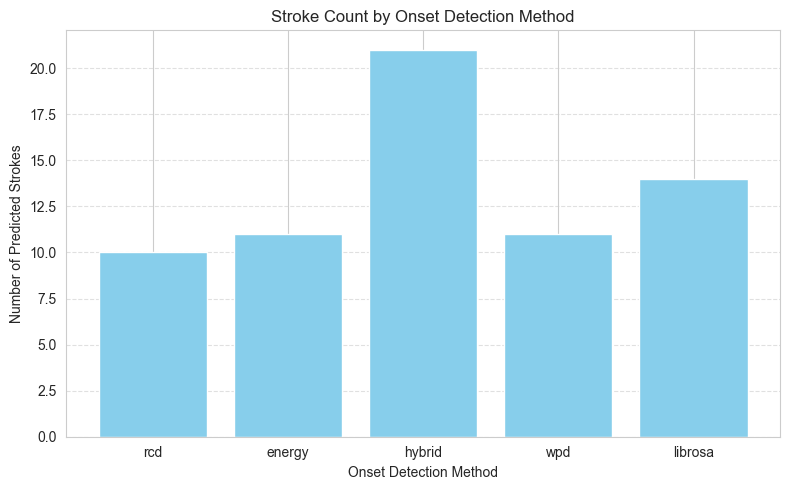

In [67]:
onset_methods = ['rcd', 'energy', 'hybrid', 'wpd', 'librosa']
stroke_lengths = {}

# Collect number of predicted strokes for each method
for mode in onset_methods:
    predicted_bols = predict_tabla_bols(
        file_path="DataSet/TablaLive/Jhaptaal_1.wav",
        model=model,
        note_labels=note_labels,
        preprocess_fn=preprocess,
        adjust_length_fn=Adjust_Length,
        target_length=target_length,
        onset_mode=mode
    )
    stroke_lengths[mode] = len(predicted_bols)

# Plot stroke count comparison
plt.figure(figsize=(8, 5))
plt.bar(stroke_lengths.keys(), stroke_lengths.values(), color='skyblue')
plt.xlabel("Onset Detection Method")
plt.ylabel("Number of Predicted Strokes")
plt.title("Stroke Count by Onset Detection Method")
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

TypeError: unsupported operand type(s) for /: 'tuple' and 'int'

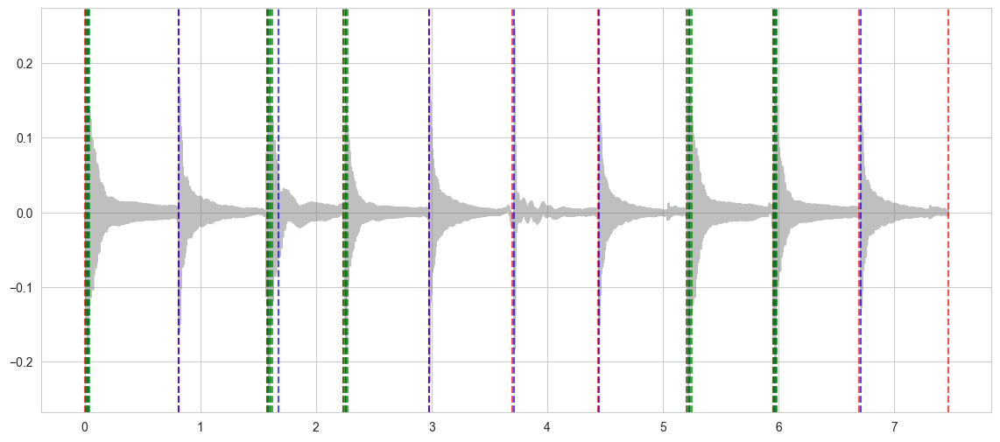